In [1]:
import os
import glob
import itertools
import json
import cv2
import sys

import matplotlib as mpl
import scipy.stats as spstats
import pandas as pd
import numpy as np
import seaborn as sns
import pylab as pl
import pingouin as pg
# 
import analyze2p.gratings.utils as gutils
import analyze2p.plotting as pplot
import analyze2p.aggregate_datasets as aggr
import analyze2p.utils as hutils
import analyze2p.receptive_fields.utils as rfutils
import analyze2p.extraction.rois as roiutils
import analyze2p.correlations as cr
import importlib

import analyze2p.objects.selectivity as sel
import analyze2p.objects.sim_utils as su

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-pipeline/envs/rat2pMIGR/lib/python3.8/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.5.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [2]:
#### Plotting params
visual_areas, area_colors = pplot.set_threecolor_palette()
pplot.set_plot_params(axis_labelsize=7, lw_axes=0.25)
bw_colors = dict((v, [0.7]*3) for v in visual_areas)
#### Set trace ID and FOV/state type
# aggregate_dir = '/n/coxfs01/julianarhee/aggregate-visual-areas'
# rootdir='/n/coxfs01/2p-data'
aggregate_dir = '/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas'
rootdir = '/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-data'

traceid = 'traces001'
fov_type = 'zoom2p0x'
state = 'awake'

In [3]:
experiment = 'blobs'
responsive_test='ROC'
# ---------------------------------------------------------------
trial_epoch='plushalf'
response_type='dff'
responsive_thr=0.05 if responsive_test=='ROC' else 10.0
print(responsive_test, responsive_thr)
#### Responsive params
# responsive_str = '%s_%s-%.2f' % (trial_epoch, response_type, responsive_test, responsive_thr)
responsive_str = '%s_%s_%s-%.2f' % (trial_epoch, response_type, responsive_test, responsive_thr)

#### Set current output dir
dst_dir = os.path.join(aggregate_dir, 'correlations', 
                       'blobs_%s_%s' % (response_type, responsive_test),
                       'morph_tuning_MIGR')
print(dst_dir)

ROC 0.05
/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR


# Load data

In [4]:
sdata, cells0 = aggr.get_aggregate_info(visual_areas=visual_areas, return_cells=True)
meta = sdata[sdata.experiment.isin(['gratings'])].copy()
all_dkeys = [(va, dk) for (va, dk), g in meta.groupby(['visual_area', 'datakey'])]

# Load trial metrics
NDATA0 = aggr.load_responsive_neuraldata(experiment, traceid=traceid,
                      response_type=response_type, trial_epoch=trial_epoch,
                      responsive_test=responsive_test, 
                      responsive_thr=responsive_thr)
if experiment not in ['rfs', 'rfs10']: # assigned in load_responsive_neuraldata()
    NDATA0['experiment'] = experiment 
print("Stimulus: %s (cell counts)" % experiment)
print(NDATA0[['visual_area', 'datakey', 'cell']]\
        .drop_duplicates()['visual_area'].value_counts().to_markdown())
# Get the cells
CELLS = aggr.get_all_responsive_cells(cells0, NDATA0) 
counts = aggr.count_n_cells(CELLS, name='n_cells', reset_index=True)
print(counts.groupby('visual_area').sum().to_markdown())

# Drop duplicates
u_dkeys = aggr.drop_repeats(counts, colname='n_cells')   
NDATA = pd.concat([g for (va, dk), g \
                   in NDATA0.groupby(['visual_area', 'datakey'])\
                   if (va, dk) in u_dkeys], ignore_index=True)
if 'experiment' not in NDATA.columns:
    NDATA['experiment'] = experiment
# Final counts
final_ncells = aggr.count_n_cells(NDATA)
final_totals = aggr.get_final_cell_and_site_counts(final_ncells)
print("FINAL totals: %s (%s)" % (experiment, responsive_test))
print(final_totals.to_markdown())

SDF, incorrect_stim = aggr.check_sdfs(NDATA['datakey'].unique(), experiment='blobs',
                        images_only=False, rename=True,
                        return_incorrect=True, return_all=False)

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/dataset_info_assigned.pkl
Segmentation: missing 12 dsets
/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/dataset_info_assigned.pkl
Segmentation: missing 12 dsets
...loading: aggr_blobs_trialmeans_traces001_ROC-thr-0.05_dff_plushalf.pkl
Checking mislabeled
Stimulus: blobs (cell counts)
|    |   visual_area |
|:---|--------------:|
| V1 |          1259 |
| Lm |          1078 |
| Li |           584 |
| visual_area   |   n_cells |
|:--------------|----------:|
| Li            |       584 |
| Lm            |      1078 |
| V1            |      1259 |
[V1] Animalid does not exist: JC078 
FINAL totals: blobs (ROC)
| visual_area   |   n_cells |   datakey |
|:--------------|----------:|----------:|
| Li            |       409 |        13 |
| Lm            |       684 |        11 |
| V1            |      1033 |        10 |


In [5]:
incorrect_stim.keys()

dict_keys(['20190315_JC070_fov1', '20190316_JC070_fov1', '20190319_JC067_fov1', '20190320_JC067_fov1', '20190321_JC070_fov1', '20190322_JC073_fov1', '20190306_JC061_fov3'])

## RFs?

In [6]:
rf_str = 'no-rfs'

In [7]:
responsive_str

'plushalf_dff_ROC-0.05'

# Output dirs

In [8]:
data_id = '|'.join([traceid, responsive_str, rf_str])
print(data_id)
# examples dir
examples_dir = os.path.join(dst_dir, 'examples')
if not os.path.exists(examples_dir):
    os.makedirs(examples_dir)
print(examples_dir)

# Figure save dir
FIGDIR = os.path.join(aggregate_dir, 'FIGURES', 'example_tuning_curves_MIGR')
if not os.path.exists(FIGDIR):
    os.makedirs(FIGDIR)
print(FIGDIR)

traces001|plushalf_dff_ROC-0.05|no-rfs
/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples
/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/FIGURES/example_tuning_curves_MIGR


# Example dataset

In [9]:

def get_tuning_and_position(ndf, 
            rootdir='/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-data'):
    '''
    Use mean of the tuning curve as colormap, rather than best morph or the entire tuning curve
    Arguments:
    ndf: (pd.DataFrame) NDATA[(NDATA['visual_area']==va) & (NDATA['datakey']==dk)]
    '''
    stacked_trials = aggr.stacked_neuraldf_to_unstacked(ndf)
    stacked_trials.shape

    zscored = aggr.zscore_dataframe(stacked_trials)
    zscored['config'] = stacked_trials['config']

    included_configs = zscored['config'].unique()
    zscored.index.name = None
    zscored.columns.name = None
    tuning_ = zscored[zscored['config'].isin(included_configs)]\
                                   .groupby(['config']).mean().reset_index()

    tuning_df = pd.DataFrame({'mean_tuning': tuning_.median(axis=0),
                              'cell': tuning_.mean(axis=0).index,
                              'datakey': dk, 'visual_area': va, 'experiment': 'blobs'},
                      index=tuning_.mean(axis=0).index)

    ixs_pos = aggr.add_roi_positions(tuning_df, rootdir=rootdir)
    # ixs_pos.head()
    return ixs_pos

In [10]:
def get_best_ixs(rdf, normalize_tuning_curves=False):
    '''
    Get size and morph tuning curves, assign "best" morph/size to each cell. 
    
    Arguments:
        rdf (pd.DataFrame) - mean responses to each config, for each cell
    Returns:
        best_ixs (pd.DataFrame) 
    '''
    
    #### Generate tuning curves
    morph_curves, size_curves = sel.get_object_tuning_curves(rdf, sort_best_size=False,
                                    normalize=normalize_tuning_curves, 
                                    return_stacked=True)
    #### Calculate morph selectivity index
    morph_ixs = rdf.groupby(['cell']).apply(sel.assign_morph_ix, 
                                            at_best_other=True, name='morph_sel')
    morph_ixs.index = morph_ixs.index.droplevel(1)
    sorted_morph_ixs = morph_ixs.sort_values(by='morph_sel', ascending=False)

    #### Calculate size tolerance
    size_tols = rdf.groupby(['cell']).apply(sel.assign_size_tolerance, 
                                            at_best_other=True, name='size_tol')
    size_tols.index = size_tols.index.droplevel(1)
    sorted_size_tols = size_tols.sort_values(by='size_tol', ascending=False)

    #### Combine
    best_ixs = pd.concat([size_tols, morph_ixs], axis=1).reset_index()
    best_ixs.index=best_ixs['cell']

    max_morph=max(morphlevels)
    best_ixs['best_morphlevel_normed'] = best_ixs['best_morphlevel']/float(max_morph)
#     best_ixs.head()
    best_ixs.index.name=None
    best_ixs.head()
    best_ixs['visual_area'] = rdf['visual_area'].unique()[0]
    best_ixs['datakey'] = rdf['datakey'].unique()[0]
    best_ixs['experiment'] = 'blobs'
    return best_ixs

In [11]:
morph_cmap = 'coolwarm'
size_cmap = 'viridis'

In [12]:
NDATA[NDATA['visual_area']=='Li']['datakey'].unique()

array(['20190315_JC070_fov1', '20190316_JC070_fov1',
       '20190319_JC067_fov1', '20190320_JC067_fov1',
       '20190321_JC070_fov1', '20190322_JC073_fov1',
       '20190422_JC076_fov1', '20190602_JC091_fov1',
       '20190609_JC099_fov1', '20190614_JC091_fov1',
       '20190617_JC099_fov1', '20191018_JC113_fov1',
       '20191111_JC120_fov1'], dtype=object)

In [13]:
NDATA[NDATA['visual_area']=='Li'].groupby('datakey')['cell'].nunique()

datakey
20190315_JC070_fov1    22
20190316_JC070_fov1     7
20190319_JC067_fov1     2
20190320_JC067_fov1     1
20190321_JC070_fov1     1
20190322_JC073_fov1    38
20190422_JC076_fov1    29
20190602_JC091_fov1    87
20190609_JC099_fov1    60
20190614_JC091_fov1    78
20190617_JC099_fov1     7
20191018_JC113_fov1    47
20191111_JC120_fov1    30
Name: cell, dtype: int64

In [38]:
va='Li'
# dk='20190617_JC097_fov1'
# dk='20190613_JC097_fov1'

# dk = '20190315_JC070_fov1'
# dk = '20190322_JC073_fov1'
# dk = '20190422_JC076_fov1'
# dk = '20191111_JC120_fov1'
# dk = '20190609_JC099_fov1'
dk = '20190602_JC091_fov1'
# dk = '20190614_JC091_fov1'
# dk = '20191018_JC113_fov1'
# ndf = NDATA[(NDATA['visual_area']==va) & (NDATA['datakey']==dk)].copy()
# ixs_pos = get_tuning_and_position(ndf, rootdir=rootdir)

## Get tuning curves

In [15]:
# dk = '20190622_JC085_fov1'
offset_type='minsub' 
lcorrection='none'
with_lum = False

sdf = aggr.get_stimuli(dk, experiment, match_names=True)
if with_lum:
    configs = sdf.index.tolist()
else:
    configs = sdf[sdf['morphlevel']!=-1].index.tolist()
sizes = list(sorted(sdf['size'].unique()))
morphlevels = list(sorted(sdf.loc[configs]['morphlevel'].unique()))
print(morphlevels)

# Select cells for this dataset
x0 = NDATA0[(NDATA0.visual_area==va) & (NDATA0.datakey==dk) 
          & (NDATA0.config.isin(configs))].copy()
# Get mean response to each config
rdf0 = x0.groupby(['cell', 'config', 'datakey', 'visual_area', 'experiment']).mean().reset_index().drop('trial', axis=1)
rdf_offset = sel.correct_offset(rdf0, offset=offset_type)
rdf = sel.correct_luminance(rdf_offset, sdf, lcorrection=lcorrection)
rdf['size'] = sdf.loc[rdf['config']]['size'].values
rdf['morphlevel'] = sdf.loc[rdf['config']]['morphlevel'].values

# Add position
posdf = rdf[['visual_area', 'datakey', 'experiment', 'cell']].drop_duplicates()
posdf = aggr.add_roi_positions(posdf, rootdir=rootdir)
posdf.shape

# Get tuning ixs
# ixs_ = sel.calculate_metrics(rdf[rdf.config.isin(configs)], sdf)
# ixs_['visual_area'] = va
# ixs_['datakey'] = dk
best_ixs = get_best_ixs(rdf)

[0, 14, 27, 40, 53, 66, 79, 92, 106]


In [16]:
ixs_pos = aggr.add_roi_positions(best_ixs, rootdir=rootdir)

#### Tuning curves

In [17]:
#### Generate tuning curves
# For each cell, mean response to each stimulus makes up the tuning curve 
# Morph tuning is taken at cell's best size, and vice versa
normalize_tuning_curves = True
morph_curves, size_curves = sel.get_object_tuning_curves(rdf, sort_best_size=False,
                                normalize=normalize_tuning_curves, return_stacked=True)

#### Compare similarity metrics for pairs with the same best_size

In [18]:
curr_size = 50
#for curr_size, curr_morph_curves in morph_curves.groupby('best_size'):
curr_morph_curves = morph_curves[morph_curves['best_size']==curr_size]
curr_rois = morph_curves[morph_curves['best_size']==curr_size]['cell'].unique()

# Stack current morph curves
morph_mat = curr_morph_curves[['cell', 'response', 'morphlevel']]\
                    .pivot(columns='cell', index='morphlevel')
morph_mat.columns = morph_mat.columns.droplevel()
morph_mat = morph_mat.sort_index(ascending=True)

# Current cell pairs
col_pairs = list(itertools.combinations(curr_rois, 2))

# Get comparisons
m_list = [cr.compare_curves(morph_mat[a].values, morph_mat[b].values, a=a, b=b) \
                                                    for (a, b) in col_pairs]
# Combine
df_morph = pd.concat(m_list, axis=1).T

# Add cortical distances
morph_and_pos = cr.get_pw_distance(df_morph, posdf)
morph_and_pos[['xcorr', 'pearsons', 'cosim']] = morph_and_pos[['xcorr', 'pearsons', 'cosim']].astype(float)
morph_and_pos['best_size'] = curr_size

In [19]:
nr=3; nc=4
fig, axn = pl.subplots(nr, nc, sharex=True, sharey=True)
i = 0
for (a, b), comparisons in df_morph.groupby(['cell_1', 'cell_2']):
    if i>=nr*nc:
        break
    ax = axn.flat[i]
    results_str = 'xcorr={:.2f}\npearson={:.2f}\ncosim={:.2f}'.format(
        float(comparisons['xcorr']), float(comparisons['pearsons']), 
        float(comparisons['cosim']))
    ax.plot(morph_mat[a])
    ax.plot(morph_mat[b])
    ax.set_title(results_str)
    i+=1
pl.subplots_adjust(hspace=0.5)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


pearsons_v_cortical_distance_bestsize-50.0__Li_20190602_JC091_fov1


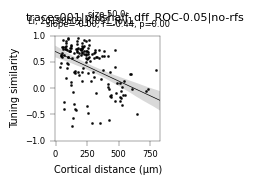

In [182]:
# Plot cortical distance vs. tuning similiarty for current size
x_var = 'cortical_distance'
y_var='pearsons'

min_ctx_dist = 30
plotdf = morph_and_pos[morph_and_pos['cortical_distance']>=min_ctx_dist]

fig, ax =pl.subplots(figsize=(1.5,1.5))
sns.regplot(data=morph_and_pos, x=x_var, y=y_var, ax=ax, 
            line_kws={'lw':0.5},
            scatter_kws={'s': 1}, color='k', truncate=False, fit_reg=True)
ax.set_box_aspect(1)
ax.set_ylim([-1, 1])
ax.set_xlabel('Cortical distance (\u00b5m)')
ax.set_ylabel('Tuning similarity')
pl.subplots_adjust(left=0.2)
# stats
X = morph_and_pos[x_var].values
y = morph_and_pos[y_var].values
slope, intercept, r_value, p_value, std_err = spstats.linregress(X, y)
fig.text(0.02, 0.92, '{}, {}'.format(va, dk))
pplot.label_figure(fig, data_id)
ax.set_title('size {}:\nslope={:.2f}, r={:.2f}, p={:.2f}'\
             .format(curr_size, slope, r_value, p_value), fontsize=6)

figname='{}_v_{}_bestsize-{}__{}_{}'.format(y_var, x_var, curr_size, va, dk) 
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(figname)

#### Tuning similarity vs. Cortical distance, all sizes

In [21]:
df_list = []
for curr_size, curr_morph_curves in morph_curves.groupby('best_size'):
    curr_morph_curves = morph_curves[morph_curves['best_size']==curr_size]
    curr_rois = morph_curves[morph_curves['best_size']==curr_size]['cell'].unique()
    if len(curr_rois) < 3:
        continue
    # Stack current morph curves
    morph_mat = curr_morph_curves[['cell', 'response', 'morphlevel']]\
                        .pivot(columns='cell', index='morphlevel')
    morph_mat.columns = morph_mat.columns.droplevel()
    morph_mat = morph_mat.sort_index(ascending=True)

    # Current cell pairs
    col_pairs = list(itertools.combinations(curr_rois, 2))
    
    # Get pairwise corrs
    m_list = [cr.compare_curves(morph_mat[a].values, morph_mat[b].values, a=a, b=b) \
                                                        for (a, b) in col_pairs]
    curr_corrs = pd.concat(m_list, axis=1).T
    
    # Get positions
    morph_and_pos = cr.get_pw_distance(curr_corrs, posdf)
    morph_and_pos[['xcorr', 'pearsons', 'cosim']] = morph_and_pos[['xcorr', 'pearsons', 'cosim']].astype(float)

    morph_and_pos['best_size'] = curr_size
    morph_and_pos['datakey'] = dk
    morph_and_pos['visual_area'] = va
    df_list.append(morph_and_pos)
morph_and_pos_all_sizes = pd.concat(df_list)

In [22]:
# Plot cortical distance vs. tuning similiarty for current size
x_var = 'cortical_distance'
y_var='pearsons'

min_ctx_dist = 30
plotdf = morph_and_pos_all_sizes[morph_and_pos_all_sizes['cortical_distance']>=min_ctx_dist]
n_sizes = morph_and_pos_all_sizes['best_size'].nunique()
fig, axn = pl.subplots(1, n_sizes, figsize=(8,4), sharex=True, sharey=True)
for ai, (curr_size, morph_and_pos) in enumerate(plotdf.groupby('best_size')):
    ax=axn[ai]
    sns.regplot(data=morph_and_pos, x=x_var, y=y_var, ax=ax, 
                scatter_kws={'s': 5}, color='k', truncate=False, fit_reg=True)
    ax.set_box_aspect(1)
    #ax.set_title('{}: best_size={}'.format(dk, curr_size))

    # stats
    X = morph_and_pos[x_var].values
    y = morph_and_pos[y_var].values
    slope, intercept, r_value, p_value, std_err = spstats.linregress(X, y)
    ax.set_title('best_size={}\nslope={:.2f}\nr={:.2f}\np={:.2f}'.format(curr_size, slope, r_value, p_value))

figname='{}_v_{}_each-size__{}_{}'.format(y_var, x_var, va, dk) 
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(figname)

pearsons_v_cortical_distance_each-size__Li_20190602_JC091_fov1


In [23]:
x_var = 'cortical_distance'
y_var='pearsons'

plotdf = morph_and_pos_all_sizes[morph_and_pos_all_sizes['cortical_distance']>=min_ctx_dist]

# stats
X = plotdf[x_var].values
y = plotdf[y_var].values
slope, intercept, r_value, p_value, std_err = spstats.linregress(X, y)
stat_str = '{}: slope={:.3f}, r={:.3f}, p={:.3f}'.format(dk, slope, r_value, p_value)

# plot
fig, ax =pl.subplots(figsize=(1.5,1.5))
sns.regplot(data=plotdf, x=x_var, y=y_var, ax=ax, 
            line_kws={'lw': 0.5},
            scatter_kws={'s': 1}, color='k', truncate=False, fit_reg=True)
ax.set_box_aspect(1)
#ax.set_title('{}: best_size={}'.format(dk, curr_size))

# stats
X = morph_and_pos[x_var].values
y = morph_and_pos[y_var].values
slope, intercept, r_value, p_value, std_err = spstats.linregress(X, y)
ax.set_title('slope={:.2f}\nr={:.2f}\np={:.2f}'.format(slope, r_value, p_value))
fig.text(0.02, 0.92, '{}, {}'.format(va, dk))
pplot.label_figure(fig, data_id)
pl.subplots_adjust(left=0.2)

# figname='{}_v_{}_bestsize-{}__{}_{}'.format(y_var, x_var, curr_size, va, dk) 
# pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
# pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
# print(figname)

# Color code tuning to view spatial organization

In [24]:
import analyze2p.utils as util

In [25]:
def get_tuning_color_codes(ixs_pos, morph_mat):
    tuning_cdict={}
    for rid, irow in ixs_pos.iterrows():
        color_code = np.array([morph_mat[rid].iloc[0:3].mean(), 
                              morph_mat[rid].iloc[3:6].mean(),
                              morph_mat[rid].iloc[6:].mean() ])
    #     color_code = color_code/max(color_code)
        tuning_cdict[rid] = color_code
    return tuning_cdict

##### Get FOV image

In [26]:
# # Load img and masks
# session, animalid, fov = util.split_datakey_str(dk)
# masks, zimg = roiutils.load_roi_masks(animalid, session, fov, rois='rois001',
#                                       rootdir=rootdir)
# if masks.min()==0:
#     masks[masks==0] = np.nan
# print(masks.shape)

In [27]:
# Get morph_mat for all ROIs
normalize_tuning_curves=True
morph_mat, size_mat = sel.get_object_tuning_curves(rdf, 
                                            sort_best_size=False,
                                            normalize=normalize_tuning_curves, 
                                            return_stacked=False)
# plot.

In [28]:
fig, ax = pl.subplots(figsize=(2,2))
# Get color codes
tuning_cdict = get_tuning_color_codes(ixs_pos, morph_mat)

# plot.    
sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                hue='cell', palette=tuning_cdict,
                s=20,linewidth=0.2, alpha=0.8)
ax.set_aspect(1)
ax.legend_.remove()
ax.invert_yaxis()
ax.set_title(dk, fontsize=4)
ax.set_ylabel('AP position')
ax.set_xlabel('ML position')

figname = 'spatial_layout_color_tuning_{}-{}_pretty'.format(va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


In [29]:
# Get mean for each cell for each config
means = NDATA[(NDATA['visual_area']=='Li')]\
            .groupby(['datakey', 'cell', 'config']).mean().reset_index()
means['morphlevel'] = [sdf.loc[c]['morphlevel'] for c in means['config']]

# Get cells with large respnses to NON-luminance stimuli:
d2 = means[(means['response']>=0.15)][['datakey', 'cell']]
d3 = means[(means['datakey'].isin(d2['datakey']))
          & (means['cell'].isin(d2['cell']))]
# Of these, get cells also with low responses to LUM controls:
d_list = []
for (k, ce), d_ in d3.groupby(['datakey', 'cell']):
    if all(d_[d_['morphlevel']==-1]['response'] < 0.1):
        d_list.append(d_)
print(len(d_list))
d = pd.concat(d_list)
d[['datakey', 'cell']].drop_duplicates()

25


,datakey,cell
1800,20190322_JC073_fov1,142
2295,20190322_JC073_fov1,234
3015,20190322_JC073_fov1,277
3345,20190422_JC076_fov1,119
3895,20190422_JC076_fov1,277
4445,20190422_JC076_fov1,316
5445,20190602_JC091_fov1,40
6145,20190602_JC091_fov1,64
6545,20190602_JC091_fov1,76
7245,20190602_JC091_fov1,234


In [157]:
dk = '20190602_JC091_fov1'

In [173]:
plot_rois = list(d[d['datakey']==dk]['cell'].unique())
plot_rois.extend([73, 233])
plot_rois.extend([253, 254, 345, 277, 276, 250]) #[345, 276, 253, 250] # 254 277
plot_rois.extend( [240, 238, 243, 336])
plot_rois.extend( [23, 29, 16, 34])
plot_rois.extend([73, 74, 75, 76])
plot_rois.extend([62, 64, 65, 71, 73])
plot_rois = np.array(plot_rois)

In [174]:
%matplotlib notebook

<IPython.core.display.Javascript object>


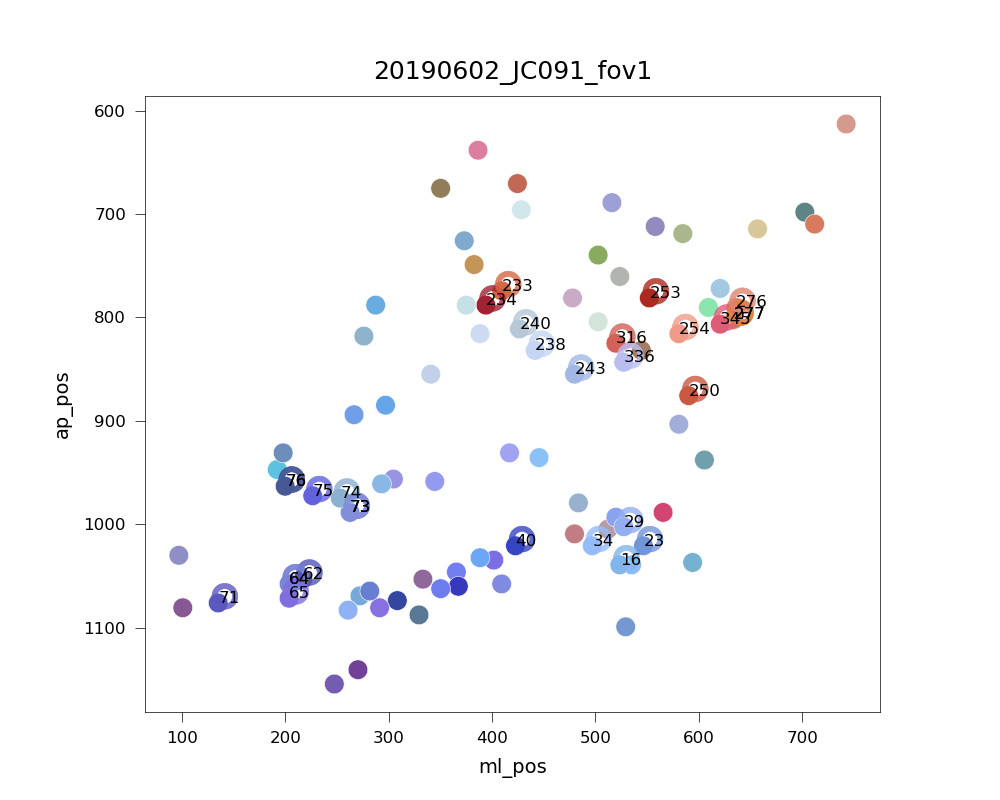

In [175]:
label_rois = True
fig, ax = pl.subplots()
sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                hue='cell', palette=tuning_cdict,
                s=50,linewidth=0.2, alpha=1)
ax.set_aspect(1)
ax.legend_.remove()
ax.invert_yaxis()

if label_rois:
    sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos.loc[plot_rois], ax=ax,
                        hue='cell', palette=tuning_cdict,
                        s=200,linewidth=0.2, alpha=0.8,
                        marker="$\circ$", ec="face")
    ax.set_aspect(1)
    ax.legend_.remove()
    for rid in plot_rois:
        ax.text(ixs_pos.loc[rid]['ml_pos'], ixs_pos.loc[rid]['ap_pos'],rid)
ax.set_title(dk)

figname = 'spatial_layout_color_tuning_{}-{}_labeled'.format(va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))

In [161]:
srt_pos = ixs_pos.sort_values(by=['ml_pos', 'ap_pos'])[['cell', 'ml_pos', 'ap_pos']]
srt_pos[srt_pos['ml_pos']>588].iloc[0:5]

,cell,ml_pos,ap_pos
250,250,590.152642,875.710372
21,21,593.960078,1037.025440
18,18,605.382387,937.931898
256,256,609.189824,790.443836
257,257,620.612133,772.007828


In [39]:
dk

'20190602_JC091_fov1'

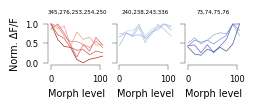

In [180]:
fig, axn = pl.subplots(1, 3, sharex=True, sharey=True,
                       figsize=(2.5, 0.7))
# if dk == '20160614_JC091_fov1':
# c1 = [211, 272, 277, 266, 267, 523]
# c2 = [530, 331, 384]
# c3 = [248, 251, 252, 255]
if dk == '20190602_JC091_fov1':
    c1 = [345, 276, 253, 254, 250] # 254 277
    c2 = [240, 238, 243, 336]
    c3 = [23, 29, 16, 34]
    c4 = [73, 74, 75, 76]
    c5 = [62, 64, 65, 71] # 61] #, 52,53]
    
for ai, clist in enumerate([c1, c2, c4]):
    ax=axn[ai]
    for roi in clist:
        ax.plot(morph_mat[roi], color=tuning_cdict[roi], 
                lw=0.5)
    ax.set_title(','.join([str(c) for c in clist]), fontsize=4)
    ax.set_box_aspect(0.75)
    sns.despine(trim=True)
    ax.set_xlabel('Morph level')
    if ai==0:
        ax.set_ylabel('Norm. \u0394F/F')
    else:
        ax.set_ylabel('')
figname = 'selected_cells_tuningcurves_{}-{}'.format(va, dk)
pl.savefig(os.path.join( dst_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))

In [163]:
import copy
import analyze2p.extraction.traces as traceutils

In [164]:
data_fpath = traceutils.get_data_fpath(dk, experiment_name='blobs',
                                       rootdir=rootdir)
print(data_fpath)
raw_traces, labels, sdf, run_info = traceutils.load_dataset(data_fpath, 
                                                    trace_type='corrected',
                                                    rootdir=rootdir)
processed, trialmetrics = aggr.process_traces(raw_traces, labels, 
                        trace_type='dff', 
                        response_type='dff', trial_epoch='stimulus')

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-data/JC091/20190602/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_573669_traces001_3d2687_traces001_17838a_traces001_452178_traces001_c84a17_traces001_faae98/data_arrays/corrected.npz
--- processed traces: dff


In [165]:
### rid = 217
selected_morphlevels = sorted(sdf['morphlevel'].unique())[1:]

t_list=[]
# curr_plot_rois = [76, 234, 40]
for rid in check_rois: #top_rois_with_rfs[0:20]:
    best_sz = int(morph_curves[morph_curves['cell']==rid]['best_size'].unique())
    cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(selected_morphlevels)]\
                .index.tolist()
    tdf = traceutils.get_mean_and_std_traces(rid, processed, labels, 
                    cfgs_, sdf[sdf.morphlevel.isin(selected_morphlevels)], 
                    param='morphlevel', 
                    return_stacked=True, smooth=True, win_size=9)
#     tdf['has_rfs'] = ~np.isnan(fits_rfs.loc[rid]['x0'])
    tdf['cell']=rid
    tdf['best_morphlevel'] = best_ixs.loc[rid]['best_morphlevel']
    tdf['best_size'] = best_ixs.loc[rid]['best_size']
    t_list.append(tdf)
trace_ex = pd.concat(t_list, axis=0)
trace_ex = trace_ex.reset_index(drop=True)
trace_ex['sem_lo'] = trace_ex['mean'].values - trace_ex['sem'].values
trace_ex['sem_hi'] = trace_ex['mean'].values + trace_ex['sem'].values
trace_ex.head()

,time,morphlevel,mean,sem,cell,best_morphlevel,best_size,sem_lo,sem_hi
0,-1.007998,0,-0.031785,0.043904,254,0.0,50.0,-0.075689,0.012119
1,-0.985598,0,-0.023870,0.042878,254,0.0,50.0,-0.066748,0.019009
2,-0.963198,0,-0.030572,0.043753,254,0.0,50.0,-0.074326,0.013181
3,-0.940798,0,-0.024244,0.043968,254,0.0,50.0,-0.068212,0.019724
4,-0.918398,0,-0.018228,0.043705,254,0.0,50.0,-0.061933,0.025478


In [176]:
# if dk == '20160614_JC091_fov1':
# c1 = [211, 272, 277, 266, 267, 523]
# c2 = [530, 331, 384]
# c3 = [248, 251, 252, 255]
if dk == '20190602_JC091_fov1':
    c1 = [254, 345, 277, 276, 253, 250]
    c2 = [240, 238, 243, 336]
    c3 = [23, 29, 16, 34]
    c4 = [73, 74, 75, 76]
    c5 = [62, 64, 65, 71]
    
check_rois = copy.copy(c1)
check_rois.extend(c2)
check_rois.extend(c3)
check_rois.extend(c4)
check_rois.extend(c5)
check_rois

[254,
 345,
 277,
 276,
 253,
 250,
 240,
 238,
 243,
 336,
 23,
 29,
 16,
 34,
 73,
 74,
 75,
 76,
 62,
 64,
 65,
 71]

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples selected_cells_traces_Li-20190602_JC091_fov1


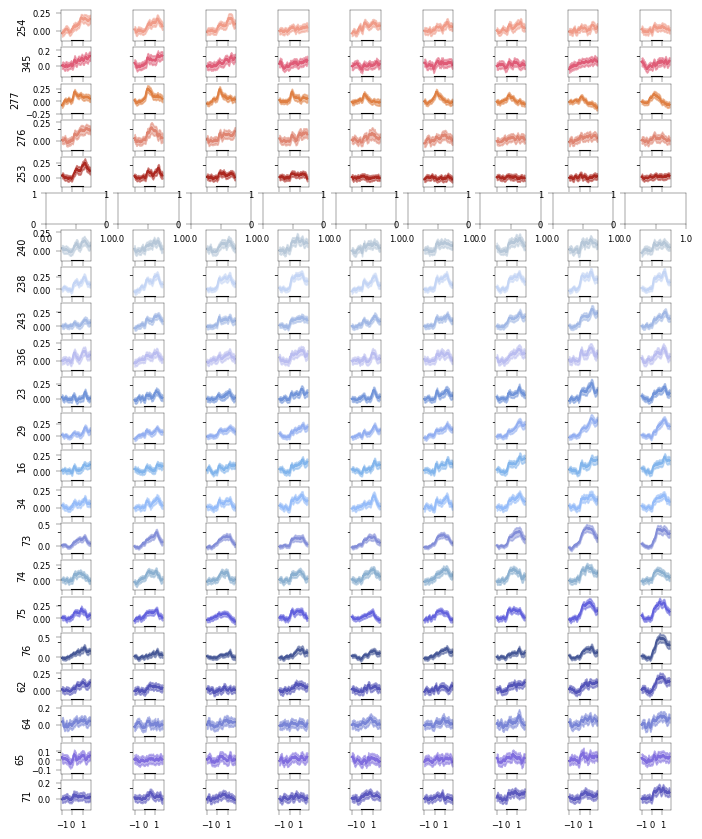

In [177]:
%matplotlib inline
fig, axn = pl.subplots(len(check_rois), len(morphlevels),
                      figsize=(8,10)) #, sharey=True)
for ai, roi in enumerate(check_rois):
    plotd = trace_ex[ (trace_ex['cell']==roi) & (trace_ex['morphlevel']!=-1)].copy()
    minv, maxv = plotd['mean'].min(), plotd['mean'].max()
    for mi, (mlevel, md) in enumerate(plotd.groupby('morphlevel')):
        ax=axn[ai, mi]
        ax.plot(md['time'], md['mean'], color=tuning_cdict[roi])
        ax.fill_between(md['time'], md['sem_lo'], md['sem_hi'], alpha=0.5,
                        color=tuning_cdict[roi])
        if mi==0:
            ax.set_ylabel(roi)
        else:
            ax.set_yticks([])
        if a==0:
            ax.set_title(mlevel)
        ax.set_ylim([minv-0.1, maxv+0.1])
        ax.set_box_aspect(1)
        ax.plot([0, 1], [ax.get_ylim()[0], ax.get_ylim()[0]], 'k')
pl.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)

figname = 'selected_cells_traces_{}-{}'.format(va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(examples_dir, figname)

In [168]:
for c in [c1, c2, c4]:
    print(c)

[254, 345, 277, 276, 253, 250]
[240, 238, 243, 336]
[73, 74, 75, 76]


/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples selected_cells_traces_Li-20190602_JC091_fov1_cells-253-238-76


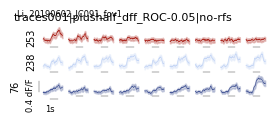

In [158]:
%matplotlib inline

selected_rois = [253, 238, 76]
fig, axn = pl.subplots(len(selected_rois), len(morphlevels),
                      figsize=(2.8,1)) #, sharey=True)

for ai, roi in enumerate(selected_rois):
    plotd = trace_ex[ (trace_ex['cell']==roi) & (trace_ex['morphlevel']!=-1)].copy()
    minv, maxv = plotd['mean'].min(), plotd['mean'].max()
    for mi, (mlevel, md) in enumerate(plotd.groupby('morphlevel')):
        ax=axn[ai, mi]
        ax.plot(md['time'], md['mean'], color=tuning_cdict[roi], lw=0.5)
        ax.fill_between(md['time'], md['sem_lo'], md['sem_hi'], alpha=0.25,
                        color=tuning_cdict[roi])
        if mi==0:
            ax.set_ylabel(roi)
        else:
            ax.set_yticks([])
        ax.set_ylim([minv-0.1, maxv+0.1])
        ax.plot([0, 1], [ax.get_ylim()[0], ax.get_ylim()[0]], 'k', lw=0.5)

        ax.set_box_aspect(1)
        ax.set_xticks([0, 1])
        ax.tick_params(length=0)
        if ai==2 and mi==0:
            ax.set_yticks([0, 0.4])
            sns.despine(ax=ax, trim=True, offset=2)
            ax.set_xticklabels(['1s', ''])
            ax.set_yticklabels(['', '0.4 dF/F'], rotation=90)
        else:
            ax.set_xticklabels(['', ''])
            ax.set_yticks([])
            sns.despine(ax=ax, trim=True, left=True)
        
pl.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, hspace=-0.2)

pplot.label_figure(fig, data_id)
fig.text(0.01, 0.95, '{}, {}'.format(va, dk))
cell_str = '-'.join([str(i) for i in selected_rois])
figname = 'selected_cells_traces_{}-{}_cells-{}'.format(va, dk, cell_str)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(examples_dir, figname)

In [102]:
ixs_pos.loc[253]

cell                                      253
size_tol                             0.245256
best_morphlevel                           0.0
morph_sel                            0.763632
best_size                                50.0
best_morphlevel_normed                    0.0
visual_area                                Li
datakey                   20190602_JC091_fov1
experiment                              blobs
animalid                                JC091
fov                             FOV1_zoom2p0x
session                              20190602
fov_xpos                           396.374168
fov_xpos_pix                            172.0
fov_ypos                           420.721722
fov_ypos_pix                            221.0
ml_pos                             552.078278
ap_pos                             781.225832
Name: 253, dtype: object

Text(0.0, 0.9, '20190602_JC091_fov1 (Li)')

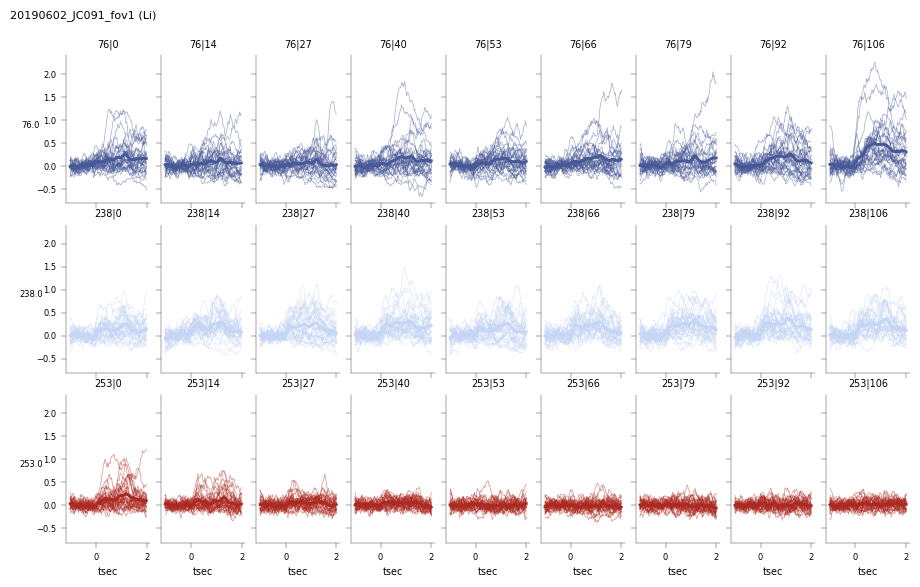

In [103]:
selected_rois = [253, 238, 76]

plot_raw=True
plot_str='raw' if plot_raw else 'shade'

if plot_raw:
    r_list=[]
    for rid in selected_rois: #plot_rois:
        best_sz = ixs_pos.loc[rid]['best_size']
        cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(selected_morphlevels)]\
                        .index.tolist()
        df_ = traceutils.roi_traces_df(rid, processed, labels, sdf, 
                        params=['morphlevel'], cfgs_=cfgs_, smooth_win_size=9)
#         df_['best_morphlevel'] = best_mp
#         df_['best_size'] = best_sz
        df_['cell'] = rid
        r_list.append(df_)
    roidf = pd.concat(r_list, axis=0, ignore_index=True)
    fig = traceutils.plot_raw_traces_roi_set(roidf, response_var='smoothed', 
                                param='morphlevel', param_order=selected_morphlevels,
                                hue_var='cell', hue_cdict=tuning_cdict,
                                lw=2, trial_lw=0.5, trial_alpha=0.5)
else:
    tdf = trace_ex[trace_ex['cell'].isin(plot_rois)].copy()
    fig = traceutils.plot_mean_sem_roi_set(tdf, response_var='smoothed', 
                                param=hue_var, param_order=selected_morphlevels,
                                hue_var='cell', hue_cdict=tuning_cdict,
                                lw=2)
pl.subplots_adjust(left=0.05, right=0.8, bottom=0.2, top=0.85)
fig.text(0.0, 0.9, '%s (%s)' % (dk, va), fontsize=8)

# pplot.label_figure(fig, data_id)
# figname = 'traces_examples_best-%s_%s_%s_rid-%s_%s' % (hue_var, va, plot_str, \
#                                         '-'.join([str(s) for s in sorted(plot_rois)]), 
#                                                       dk)
# print(figname)
# pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
# pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
# pl.savefig(os.path.join(FIGDIR, '%s.png' % figname))

## OVerlay IX on FOV

In [111]:
import tifffile as tf
import analyze2p.retinotopy.utils as retutils

In [114]:
session, animalid, fovnum = hutils.split_datakey_str(dk)
tfs = glob.glob(os.path.join(rootdir, animalid, session, 'FOV%i_*' % fovnum,
                      'blobs_run1', 'processed/processed*', 
                    'mcorrected*_deinterleaved', 'Channel01', 'File*', '*.tif'))
i_=[]
for t in tfs:
    im = tf.imread(t)
    i_.append(im)
imstack = np.dstack(i_)

<IPython.core.display.Javascript object>


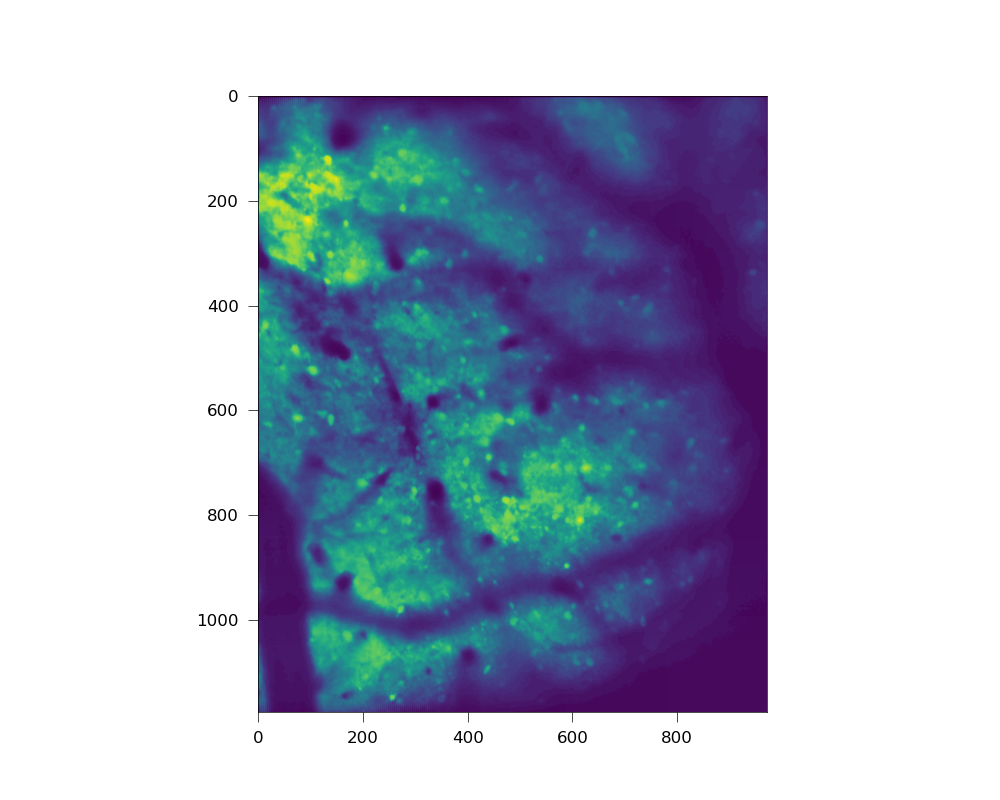

In [115]:
meanr = imstack.mean(axis=-1)
pixel_size = hutils.get_pixel_size()  
fov_transformed = retutils.transform_2p_fov(meanr, pixel_size, normalize=True)

zimg_r = pplot.adjust_image_contrast(fov_transformed, clip_limit=5.0, tile_size=5)
pl.figure()
pl.imshow(zimg_r)

In [781]:
ixs_pos.head()

,cell,size_tol,best_morphlevel,morph_sel,best_size,best_morphlevel_normed,visual_area,datakey,experiment,animalid,fov,session,fov_xpos,fov_xpos_pix,fov_ypos,fov_ypos_pix,ml_pos,ap_pos
13,13,0.286343,92.0,0.424962,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,78.353033,34.0,443.566341,233.0,529.233659,1099.246967
15,15,0.296435,79.0,0.286247,10.0,0.745283,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,138.270059,60.0,437.855186,230.0,534.944814,1039.329941
16,16,0.291776,79.0,0.321063,10.0,0.745283,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,138.270059,60.0,449.277495,236.0,523.522505,1039.329941
18,18,0.405527,53.0,0.471654,50.0,0.500000,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,239.668102,104.0,367.417613,193.0,605.382387,937.931898
21,21,0.332203,92.0,0.383543,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,140.574560,61.0,378.839922,199.0,593.960078,1037.025440


In [782]:
# all_cell_pos = aggr.add_roi_positions(NDATA, rootdir=rootdir)

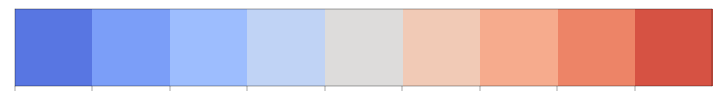

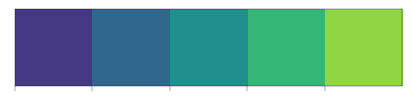

In [783]:
morph_cmap='coolwarm'
morph_colors = sns.color_palette(morph_cmap, n_colors=len(morphlevels))
sns.palplot(sns.color_palette(morph_cmap, n_colors=len(morphlevels)))

size_cmap='viridis'
size_colors = sns.color_palette(size_cmap, n_colors=len(sizes))
sns.palplot(sns.color_palette(size_cmap, n_colors=len(sizes)))

size_labels = [int(s) for s in sorted(sdf['size'].unique())]
morph_labels = [int(s) for s in sorted(sdf['morphlevel'].unique())]

morph_cdict = dict((k, v) for k, v in zip(morphlevels, morph_colors))
size_cdict = dict((k, v) for k, v in zip(sizes, size_colors))

morphlevels_normed = sorted(ixs_pos['best_morphlevel_normed'].unique())
morph_cdict_normed = dict((k, v) for k, v in zip(morphlevels_normed, morph_colors))

### plot

In [784]:
ixs_pos.head()

,cell,size_tol,best_morphlevel,morph_sel,best_size,best_morphlevel_normed,visual_area,datakey,experiment,animalid,fov,session,fov_xpos,fov_xpos_pix,fov_ypos,fov_ypos_pix,ml_pos,ap_pos
13,13,0.286343,92.0,0.424962,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,78.353033,34.0,443.566341,233.0,529.233659,1099.246967
15,15,0.296435,79.0,0.286247,10.0,0.745283,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,138.270059,60.0,437.855186,230.0,534.944814,1039.329941
16,16,0.291776,79.0,0.321063,10.0,0.745283,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,138.270059,60.0,449.277495,236.0,523.522505,1039.329941
18,18,0.405527,53.0,0.471654,50.0,0.500000,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,239.668102,104.0,367.417613,193.0,605.382387,937.931898
21,21,0.332203,92.0,0.383543,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,140.574560,61.0,378.839922,199.0,593.960078,1037.025440


/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples fov_overlay_hue-morphlevel_normed__Li_20190602_JC091_fov1
/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples fov_overlay_hue-size__Li_20190602_JC091_fov1


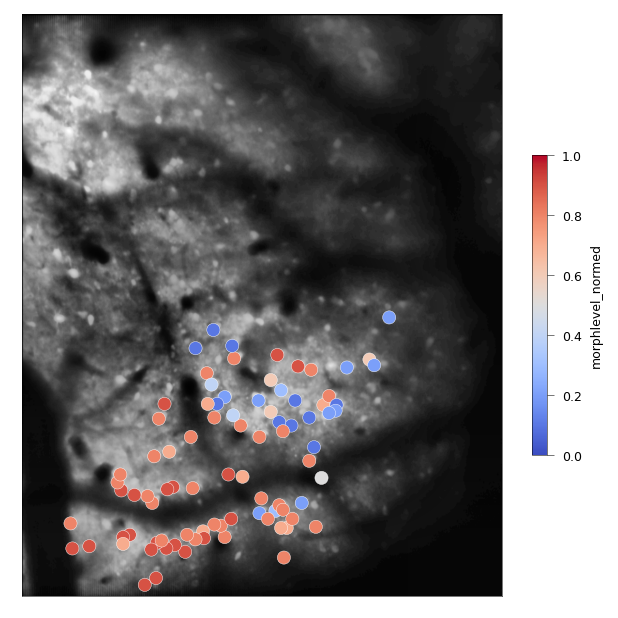

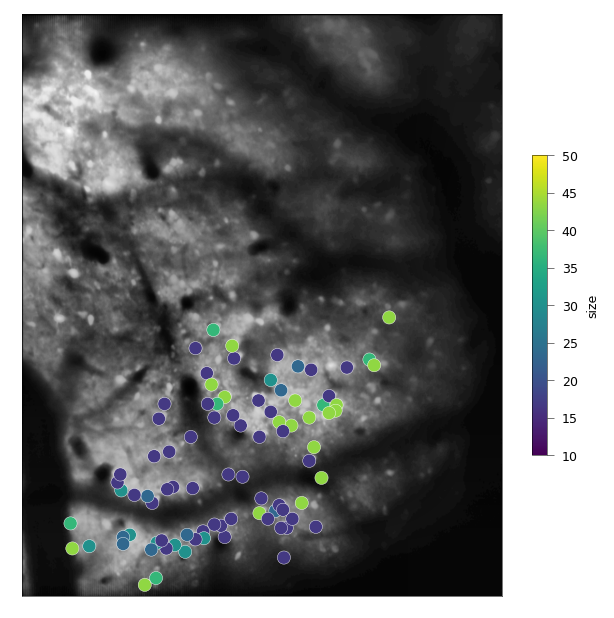

In [785]:
markersize=40
label_rois=False
#plot_rois =  [1, 19, 94] 
# plot_rois = [1, 222, 19] #43] #[222, 1, 19] #top_rois_with_rfs[0:4] #top_rois[0::2][0:3]
# plot_rois = [79, 1, 126]
for hue_var in ['morphlevel_normed', 'size']:
    hue_levels = np.array(morphlevels)/float(max(morphlevels)) \
                        if hue_var=='morphlevel_normed' else sizes
    curr_palette = morph_cdict_normed.copy() if hue_var=='morphlevel_normed'\
                        else size_cdict.copy()
    hue_min, hue_max = min(hue_levels), max(hue_levels)
    cmap=morph_cmap if hue_var =='morphlevel_normed' else size_cmap
    norm = pl.Normalize(hue_min, hue_max)

    fig = pl.figure(figsize=(4,4), dpi=150, frameon=False)
    ax = pl.Axes(fig, [0., 0., 1., 1.])
    #ax.set_axis_off()
    fig.add_axes(ax)
    fig.patch.set_alpha(1)
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])
    ax.imshow(zimg_r, cmap='gray') #, alpha=1 if label_rois else 0)
#     sns.scatterplot(x='ml_pos', y='ap_pos', data=all_cell_pos, ax=ax,
#                     color=[0.5]*3, s=5,linewidth=0.)
    sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                    hue='best_%s' % hue_var, palette=curr_palette,
                    s=markersize,linewidth=0.2)
    ax.patch.set_alpha(1)
    ax.legend_.remove()
    #ax.axis('off')
    if label_rois is True:
        for rid in plot_rois:
            ax.text(ixs_pos.loc[rid]['ml_pos'], ixs_pos.loc[rid]['ap_pos'], int(rid), 
                    fontsize=10, color='w')
    if label_rois:
        ax.set_title('best_%s' % hue_var, fontsize=4, loc='left')
        pplot.label_figure(fig, data_id)
        sns.scatterplot(x='ml_pos', y='ap_pos', ax=ax,
                        data=ixs_pos.loc[plot_rois], #[ixs_pos['cell'].isin(plot_rois)], ax=ax,
                        hue='best_%s' % hue_var, palette=curr_palette, 
                        s=markersize,linewidth=1, edgecolor='k')
        ax.legend_.remove()
    sm = pl.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.5, label=hue_var)
    ax.set_aspect('equal')
    figname='fov_overlay_hue-%s__%s_%s' % (hue_var, va, dk) 
    if label_rois:
       figname='%s_labeled' % figname
    pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
    pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
    print(examples_dir, figname)

In [899]:
ixs_pos['best_morphlevel_normed'] = ixs_pos['best_morphlevel_normed'].round(3)

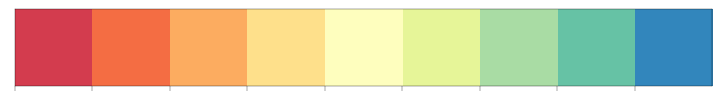

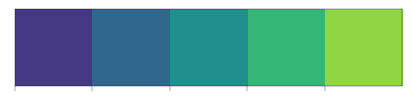

In [787]:
morph_cmap='Spectral'
morph_colors = sns.color_palette(morph_cmap, n_colors=len(morphlevels))
sns.palplot(sns.color_palette(morph_cmap, n_colors=len(morphlevels)))

size_cmap='viridis'
size_colors = sns.color_palette(size_cmap, n_colors=len(sizes))
sns.palplot(sns.color_palette(size_cmap, n_colors=len(sizes)))

size_labels = [int(s) for s in sorted(sdf['size'].unique())]
morph_labels = [int(s) for s in sorted(sdf['morphlevel'].unique())]

morph_cdict = dict((k, v) for k, v in zip(morphlevels, morph_colors))
size_cdict = dict((k, v) for k, v in zip(sizes, size_colors))

morphlevels_normed = sorted(ixs_pos['best_morphlevel_normed'].unique())
morph_cdict_normed = dict((round(k, 3), v) for k, v in zip(morphlevels_normed, morph_colors))

In [788]:
curr_palette

{10.0: (0.267968, 0.223549, 0.512008),
 20.0: (0.190631, 0.407061, 0.556089),
 30.0: (0.127568, 0.566949, 0.550556),
 40.0: (0.20803, 0.718701, 0.472873),
 50.0: (0.565498, 0.84243, 0.262877)}

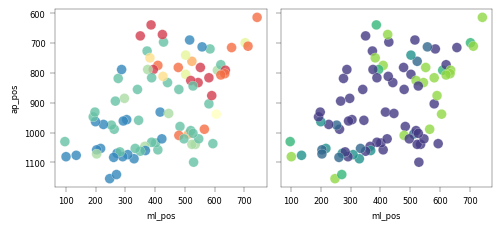

In [789]:

fig, axn = pl.subplots(1, 2, sharex=True, sharey=True) #pl.subplots(1, 2, figsize=(10,5))
for ai, hue_var in enumerate(['morphlevel_normed', 'size']):
    hue_levels = np.array(morphlevels)/float(max(morphlevels)) \
                        if hue_var=='morphlevel_normed' else sizes
    curr_palette = morph_cdict_normed.copy() if hue_var=='morphlevel_normed'\
                        else size_cdict.copy()
    hue_min, hue_max = min(hue_levels), max(hue_levels)
    cmap=morph_cmap if hue_var =='morphlevel_normed' else size_cmap
    norm = pl.Normalize(hue_min, hue_max)

    ax=axn[ai]
    sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                    hue='best_%s' % hue_var, palette=curr_palette,
                    s=50,linewidth=0.2, alpha=0.8)
    ax.set_aspect(1)
    ax.legend_.remove()
ax.invert_yaxis()
    # Colorbar
#     sm = pl.cm.ScalarMappable(cmap=cmap, norm=norm)
#     sm.set_array([])
#     fig.colorbar(sm, ax=ax, orientation='horizontal', shrink=0.5, label=hue_var)
pl.tight_layout()

## Plot FOV for all

In [13]:
counts = NDATA[NDATA['visual_area']=='Li'].groupby('datakey')['cell'].nunique()
incl_dks = counts[counts>=30].index.tolist()

In [18]:
%matplotlib notebook

<IPython.core.display.Javascript object>


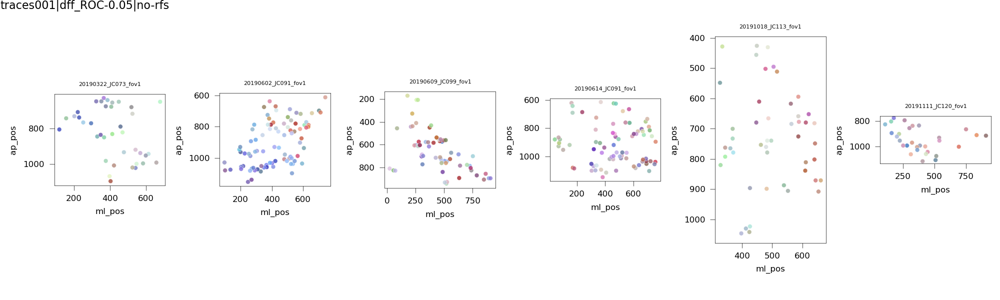

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples spatial_layout_colorcode_tuning_all_fovs


In [23]:
# dk = '20190622_JC085_fov1'
offset_type='minsub' 
lcorrection='none'
with_lum = False
normalize_tuning_curves=True

# # Select cells for this dataset
currd = NDATA[(NDATA['visual_area']=='Li') & (NDATA['datakey'].isin(incl_dks))].copy()

fig, axn = pl.subplots(1, len(incl_dks), #sharex=True, sharey=True, 
                       figsize=(10,3))
for ci, (dk, x0) in enumerate(currd.groupby('datakey')):

    sdf = aggr.get_stimuli(dk, experiment, match_names=True)
    if with_lum:
        configs = sdf.index.tolist()
    else:
        configs = sdf[sdf['morphlevel']!=-1].index.tolist()
    sizes = list(sorted(sdf['size'].unique()))
    morphlevels = list(sorted(sdf.loc[configs]['morphlevel'].unique()))
    x0 = x0[x0['config'].isin(configs)]

    # Get mean response to each config
    rdf0 = x0.groupby(['cell', 'config', 'datakey', 'visual_area', 'experiment']).mean().reset_index().drop('trial', axis=1)
    rdf_offset = sel.correct_offset(rdf0, offset=offset_type)
    rdf = sel.correct_luminance(rdf_offset, sdf, lcorrection=lcorrection)
    rdf['size'] = sdf.loc[rdf['config']]['size'].values
    rdf['morphlevel'] = sdf.loc[rdf['config']]['morphlevel'].values

    # Add position
    posdf = rdf[['visual_area', 'datakey', 'experiment', 'cell']].drop_duplicates()
    posdf = aggr.add_roi_positions(posdf, rootdir=rootdir)

    # Get tuning ixs
    best_ixs = get_best_ixs(rdf)
    ixs_pos = aggr.add_roi_positions(best_ixs, rootdir=rootdir)
    ixs_pos['best_morphlevel_normed'] = ixs_pos['best_morphlevel_normed'].round(3)

    # Get morph tuning
    morph_mat, size_mat = sel.get_object_tuning_curves(rdf, 
                                                sort_best_size=False,
                                                normalize=normalize_tuning_curves, 
                                                return_stacked=False)
    # Get color codes
    tuning_cdict = get_tuning_color_codes(ixs_pos, morph_mat)
    
    # plot.    
    ax=axn[ci]
    sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                    hue='cell', palette=tuning_cdict,
                    s=10,linewidth=0.2, alpha=0.8)
    ax.set_aspect(1)
    ax.legend_.remove()
    ax.invert_yaxis()
    ax.set_title(dk, fontsize=4)
pl.tight_layout()

pplot.label_figure(fig, data_id)
figname = 'spatial_layout_colorcode_tuning_all_fovs'
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(examples_dir, figname)

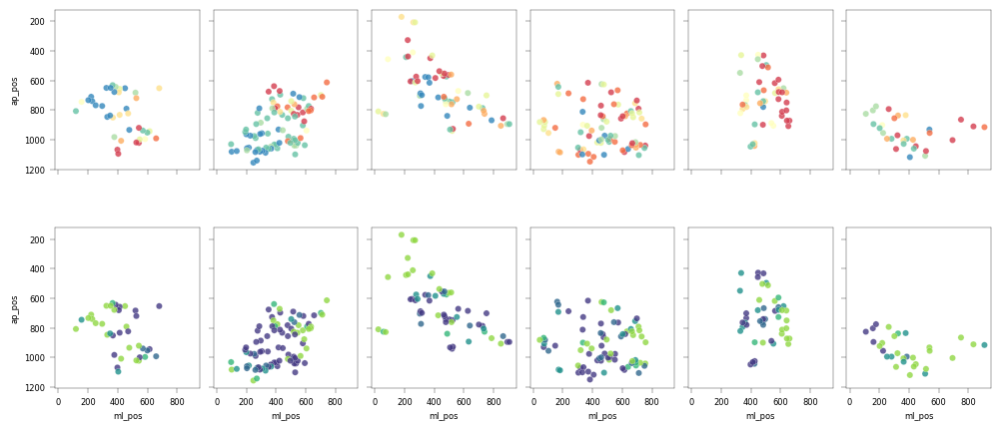

In [952]:
# dk = '20190622_JC085_fov1'
offset_type='minsub' 
lcorrection='none'
with_lum = False
# # Select cells for this dataset
# x0 = NDATA0[(NDATA0.visual_area==va) & (NDATA0.datakey==dk) 
#           & (NDATA0.config.isin(configs))].copy()
currd = NDATA[(NDATA['visual_area']=='Li') & (NDATA['datakey'].isin(incl_dks))].copy()

fig, axn = pl.subplots(2, len(incl_dks), sharex=True, sharey=True, 
                       figsize=(10,5))
for ci, (dk, x0) in enumerate(currd.groupby('datakey')):

    sdf = aggr.get_stimuli(dk, experiment, match_names=True)
    if with_lum:
        configs = sdf.index.tolist()
    else:
        configs = sdf[sdf['morphlevel']!=-1].index.tolist()
    sizes = list(sorted(sdf['size'].unique()))
    morphlevels = list(sorted(sdf.loc[configs]['morphlevel'].unique()))
    x0 = x0[x0['config'].isin(configs)]

    # Get mean response to each config
    rdf0 = x0.groupby(['cell', 'config', 'datakey', 'visual_area', 'experiment']).mean().reset_index().drop('trial', axis=1)
    rdf_offset = sel.correct_offset(rdf0, offset=offset_type)
    rdf = sel.correct_luminance(rdf_offset, sdf, lcorrection=lcorrection)
    rdf['size'] = sdf.loc[rdf['config']]['size'].values
    rdf['morphlevel'] = sdf.loc[rdf['config']]['morphlevel'].values

    # Add position
    posdf = rdf[['visual_area', 'datakey', 'experiment', 'cell']].drop_duplicates()
    posdf = aggr.add_roi_positions(posdf, rootdir=rootdir)

    # Get tuning ixs
    best_ixs = get_best_ixs(rdf)
    ixs_pos = aggr.add_roi_positions(best_ixs, rootdir=rootdir)
    ixs_pos['best_morphlevel_normed'] = ixs_pos['best_morphlevel_normed'].round(3)

    # plot
    #fig, axn = pl.subplots(1, 2, sharex=True, sharey=True) #pl.subplots(1, 2, figsize=(10,5))
    
    for ai, hue_var in enumerate(['morphlevel_normed', 'size']):
        hue_levels = np.array(morphlevels)/float(max(morphlevels)) \
                            if hue_var=='morphlevel_normed' else sizes
        curr_palette = morph_cdict_normed.copy() if hue_var=='morphlevel_normed'\
                            else size_cdict.copy()
        hue_min, hue_max = min(hue_levels), max(hue_levels)
        cmap=morph_cmap if hue_var =='morphlevel_normed' else size_cmap
        norm = pl.Normalize(hue_min, hue_max)

        ax=axn[ai, ci]
        sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                        hue='best_%s' % hue_var, palette=curr_palette,
                        s=20,linewidth=0.2, alpha=0.8)
        ax.set_aspect(1)
        ax.legend_.remove()
ax.invert_yaxis()
        # Colorbar
    #     sm = pl.cm.ScalarMappable(cmap=cmap, norm=norm)
    #     sm.set_array([])
    #     fig.colorbar(sm, ax=ax, orientation='horizontal', shrink=0.5, label=hue_var)
pl.tight_layout()

In [948]:
curr_palette

{0.0: (0.8310649750096117, 0.23844675124951936, 0.30880430603613995),
 0.132: (0.9568627450980393, 0.42745098039215684, 0.2627450980392157),
 0.255: (0.9914648212226067, 0.677354863514033, 0.37808535178777386),
 0.377: (0.996078431372549, 0.8784313725490196, 0.5450980392156862),
 0.5: (0.998077662437524, 0.9992310649750096, 0.7460207612456747),
 0.623: (0.9019607843137256, 0.9607843137254902, 0.5960784313725491),
 0.745: (0.6652825836216842, 0.8645905420991927, 0.6432141484044599),
 0.868: (0.4, 0.7607843137254902, 0.6470588235294118),
 1.0: (0.19946174548250672, 0.5289504036908881, 0.7391003460207612)}

In [928]:
morphlevels

[0, 14, 27, 40, 53, 66, 79, 92, 106]

In [887]:
dk

'20190322_JC073_fov1'

### Get RFs

In [862]:
response_type='dff'
do_spherical_correction=False
# ------------------------------------
rf_fit_desc = rfutils.get_fit_desc(response_type=response_type,
                                  do_spherical_correction=do_spherical_correction)
rfdf = rfutils.aggregate_fits(cells0, sdata, combine='average', 
                              response_type=response_type,
                              do_spherical_correction=do_spherical_correction,
                              reliable_only=True,
                              pass_criterion='position')
rfdf = aggr.add_roi_positions(rfdf, rootdir=rootdir)
rf_correction_str = 'sphrcorr' if do_spherical_correction else 'uncorr'
rf_str = 'rfs-%s-%s' % (response_type, rf_correction_str)
print(rf_str)

N dpaths: 58, N unfit: 0
N datasets included: 63, N sessions excluded: 4
N dpaths: 58, N unfit: 0
N datasets included: 63, N sessions excluded: 4
rfs-dff-uncorr


In [863]:
va, dk

('Li', '20190602_JC091_fov1')

In [864]:
rfs = rfdf[(rfdf.visual_area==va) & (rfdf.datakey==dk)].copy()

In [865]:
sdf_rf = aggr.get_stimuli(dk, experiment='blobs')
fit_roi_list= rfs['cell'].unique()

In [866]:
rfs.index = rfs['cell'].values
best_ixs.index = best_ixs['cell'].values
# combine
has_rfs = cr.get_roi_pos_and_rfs(best_ixs, curr_rfs=rfs, rfs_only=False,
                                 position_only=False,
                                 merge_cols=['visual_area', 'datakey', 'cell'])
fits_rfs = pd.merge(best_ixs, has_rfs, on=['visual_area', 'datakey', 'cell'], 
                        how='outer')

In [868]:
rfs = rfs.rename(columns={'std_x': 'sigma_x', 'std_y':'sigma_y'})
fits_rfs = fits_rfs.rename(columns={'std_x': 'sigma_x', 'std_y':'sigma_y'})
fits_rfs.index = fits_rfs['cell'].values #.loc[plot_rois]

screen = hutils.get_screen_dims()

### Select top cells that also has RFs

In [869]:
max_resp = rdf.groupby('cell')['response'].max().reset_index()
top_rois = max_resp.sort_values(by='response', ascending=False)\
                   .iloc[0:20]['cell'].values
top_rois

array([ 73,  76,  44, 319, 300, 238, 243, 234,  29, 249, 233,  43,  53,
        55,  96,  89,  75,  37, 246,  28])

In [870]:
#has_rfs = max_resp.merge(posdf_.dropna(), on=['cell'], how='inner')
has_rfs = max_resp.merge(fits_rfs.dropna(), on=['cell'], how='inner')
top_rois_with_rfs = has_rfs.sort_values(by='response', ascending=False)\
                   .iloc[0:20]['cell'].values
top_rois_with_rfs

array([ 73, 238, 243,  29, 233,  43,  53,  96,  89,  37,  33, 241,  50,
        83,  23, 336,  84, 338,  81,  38])

In [872]:
plot_rois = top_rois_with_rfs[0:4] #[87, 61, 39, 192]

In [873]:
ixs_pos.loc[plot_rois]

,cell,size_tol,best_morphlevel,morph_sel,best_size,best_morphlevel_normed,visual_area,datakey,experiment,animalid,fov,session,fov_xpos,fov_xpos_pix,fov_ypos,fov_ypos_pix,ml_pos,ap_pos
73,73,0.637518,92.0,0.405758,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,188.969080,82.0,710.086888,373.0,262.713112,988.630920
238,238,0.189130,92.0,0.163112,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,345.675147,150.0,531.137378,279.0,441.662622,831.924853
243,243,0.237923,92.0,0.281017,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,322.630137,140.0,493.063014,259.0,479.736986,854.969863
29,29,0.315453,92.0,0.298228,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,FOV1_zoom2p0x,20190602,175.142074,76.0,445.470059,234.0,527.329941,1002.457926


In [874]:
top_rois_with_rfs

array([ 73, 238, 243,  29, 233,  43,  53,  96,  89,  37,  33, 241,  50,
        83,  23, 336,  84, 338,  81,  38])

# Example cells

In [875]:
importlib.reload(sel)

<module 'analyze2p.objects.selectivity' from '/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-pipeline/repos/rat-2p-area-characterizations/analyze2p/objects/selectivity.py'>

In [876]:
# roi_labels = ['high', 'low'] # 'all']
#roi_colors = ['cornflowerblue',  'orange'] #, 'k']
roi_colors = ['magenta',  'purple', 'blue'] #, 'k']

roi_styles = ['-']*len(plot_rois)
rank_order=False
lw=0.25
# rois_plot_mp = [217, 388] 
# rois_plot_sz = [217, 388] # 20190616_JC097_fov1
# plot_rois = None #[39, 60] # 20190617_JC097_fov1
# plot_rois = [87,357]  # 20190622_JC085_fov1 - and 57
#plot_rois =  [1, 19, 94]  # 20190613_JC097_fov1


<IPython.core.display.Javascript object>


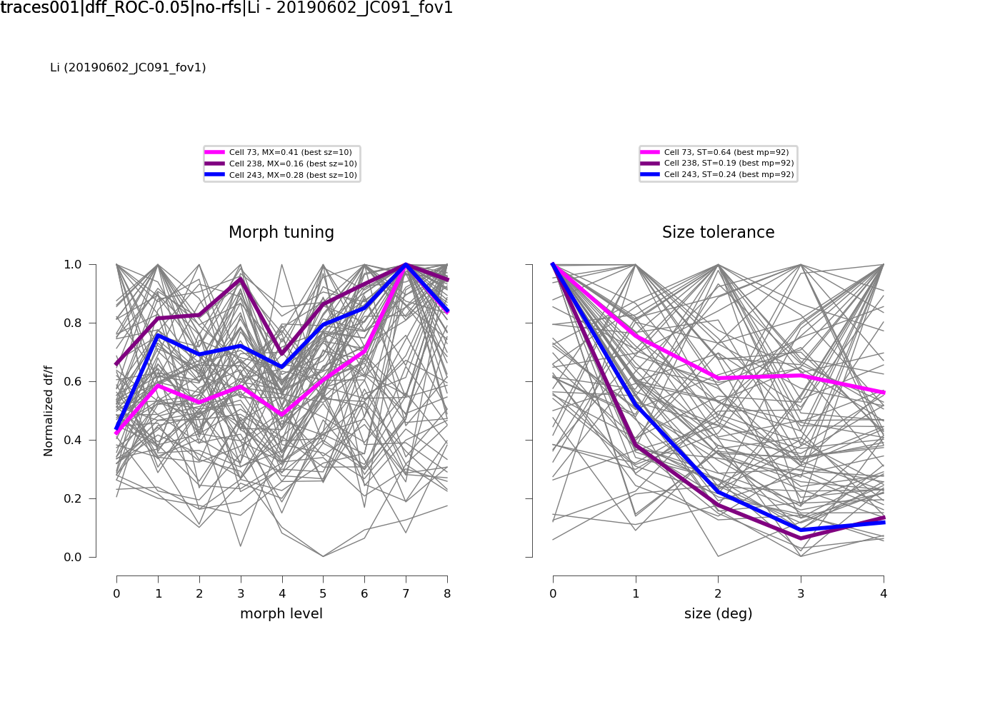

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples aggr_tuning_curves_rid29_73_238_243__Li_20190602_JC091_fov1


In [877]:
%matplotlib notebook
#### Generate tuning curves
rank_order_size=False
normalize=True
morph_mat, size_mat = sel.get_object_tuning_curves(rdf, 
                                            sort_best_size=rank_order_size,
                                            normalize=normalize, return_stacked=False)
# plot.
fig, axn = pl.subplots(1,2, figsize=(7,5), dpi=100,sharey=True)
fig.patch.set_alpha(1)
ax=axn[0]
rois_mp_labels=None
if plot_rois is not None:
    rois_mp_labels = ['Cell %i, MX=%.2f (best sz=%i)' % \
                     (rid, best_ixs.loc[rid]['morph_sel'], 
                     int(best_ixs.loc[rid]['best_size'])) for rid in plot_rois]
ax = sel.plot_overlaid_tuning_curves(morph_mat, rank_order=False, ax=ax,
                                rois_plot=plot_rois, roi_styles=roi_styles,
                                roi_colors=roi_colors,
                                roi_labels=rois_mp_labels, lw=0.5, lc='gray',
                                roi_lw=2)
xlabel = 'morph level'
ax.set_xlabel(xlabel, fontsize=7)
ax.set_ylabel('Normalized df/f')
ax.set_title("Morph tuning")
# Size Tolerance
ax=axn[1]
roi_sz_labels=None
if plot_rois is not None:
    roi_sz_labels = ['Cell %i, ST=%.2f (best mp=%i)'
                % (rid, best_ixs.loc[rid]['size_tol'], 
                  best_ixs.loc[rid]['best_morphlevel']) for rid in plot_rois]
ax = sel.plot_overlaid_tuning_curves(size_mat, rank_order=rank_order_size, ax=ax,
                                rois_plot=plot_rois, roi_styles=roi_styles,
                                roi_colors=roi_colors,
                                roi_labels=roi_sz_labels, lw=0.5, lc='gray',
                                roi_lw=2)
xlabel = 'Rank-ordered size pref.' if rank_order else 'size (deg)'
ax.set_xlabel(xlabel, fontsize=7)
ax.set_title("Size tolerance")
sns.despine(offset=2, trim=True)
fig.text(0.05, 0.9, '%s (%s)' % (va, dk), fontsize=6)
pl.subplots_adjust(wspace=0.2, left=0.1, right=0.9, top=0.65, bottom=0.2)

pplot.label_figure(fig, '%s|%s - %s' % (data_id, va, dk))
pplot.label_figure(fig, data_id)
figname = 'aggr_tuning_curves_rid%s__%s_%s' \
                % ('_'.join([str(i) for i in sorted(plot_rois)]), va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(examples_dir, figname)

<IPython.core.display.Javascript object>


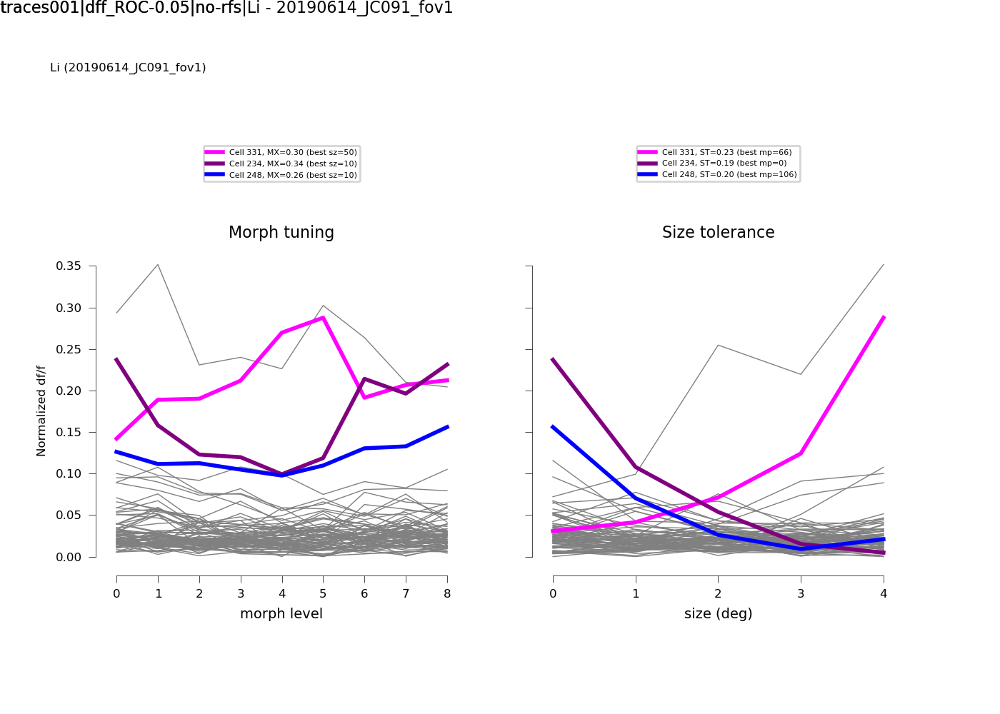

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples aggr_tuning_curves_rid234_248_331_343__Li_20190614_JC091_fov1


In [351]:
%matplotlib notebook
#### Generate tuning curves
rank_order_size=False
normalize=False
morph_mat, size_mat = sel.get_object_tuning_curves(rdf, 
                                            sort_best_size=rank_order_size,
                                            normalize=normalize, return_stacked=False)
# plot.
fig, axn = pl.subplots(1,2, figsize=(7,5), dpi=100,sharey=True)
fig.patch.set_alpha(1)
ax=axn[0]
rois_mp_labels=None
if plot_rois is not None:
    rois_mp_labels = ['Cell %i, MX=%.2f (best sz=%i)' % \
                     (rid, best_ixs.loc[rid]['morph_sel'], 
                     int(best_ixs.loc[rid]['best_size'])) for rid in plot_rois]
ax = sel.plot_overlaid_tuning_curves(morph_mat, rank_order=False, ax=ax,
                                rois_plot=plot_rois, roi_styles=roi_styles,
                                roi_colors=roi_colors,
                                roi_labels=rois_mp_labels, lw=0.5, lc='gray',
                                roi_lw=2)
xlabel = 'morph level'
ax.set_xlabel(xlabel, fontsize=7)
ax.set_ylabel('Normalized df/f')
ax.set_title("Morph tuning")
# Size Tolerance
ax=axn[1]
roi_sz_labels=None
if plot_rois is not None:
    roi_sz_labels = ['Cell %i, ST=%.2f (best mp=%i)'
                % (rid, best_ixs.loc[rid]['size_tol'], 
                  best_ixs.loc[rid]['best_morphlevel']) for rid in plot_rois]
ax = sel.plot_overlaid_tuning_curves(size_mat, rank_order=rank_order_size, ax=ax,
                                rois_plot=plot_rois, roi_styles=roi_styles,
                                roi_colors=roi_colors,
                                roi_labels=roi_sz_labels, lw=0.5, lc='gray',
                                roi_lw=2)
xlabel = 'Rank-ordered size pref.' if rank_order else 'size (deg)'
ax.set_xlabel(xlabel, fontsize=7)
ax.set_title("Size tolerance")
sns.despine(offset=2, trim=True)
fig.text(0.05, 0.9, '%s (%s)' % (va, dk), fontsize=6)
pl.subplots_adjust(wspace=0.2, left=0.1, right=0.9, top=0.65, bottom=0.2)

pplot.label_figure(fig, '%s|%s - %s' % (data_id, va, dk))
pplot.label_figure(fig, data_id)
figname = 'aggr_tuning_curves_rid%s__%s_%s' \
                % ('_'.join([str(i) for i in sorted(plot_rois)]), va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(examples_dir, figname)

In [352]:
va, dk, plot_rois

('Li', '20190614_JC091_fov1', array([331, 234, 248, 343]))

In [589]:
# plot_rois = [73, 33, 50, 53]
# plot_rois = top_rois_with_rfs[0::2][0:10]
#

In [878]:
plot_rois

array([ 73, 238, 243,  29])

In [879]:
hue_var='morphlevel'
hue_cdict = morph_cdict if hue_var=='morphlevel' else size_cdict

rois_ = rfs['cell'].unique()
w_ori = fits_rfs.dropna()['cell'].unique()
wout_ori = [r for r in rois_ if r not in w_ori]
param_hues = [hue_cdict[float(best_ixs.loc[rid]['best_%s' % hue_var])] \
              for rid in w_ori]
plot_param_hues = [hue_cdict[float(best_ixs.loc[rid]['best_%s' % hue_var])] \
                 for rid in plot_rois]
rid_colors = dict((rid, hue_cdict[float(g['best_%s' % hue_var])]) for rid, g \
                 in best_ixs[best_ixs.cell.isin(plot_rois)].groupby('cell'))

In [880]:
fits_rfs.loc[plot_rois]

,cell,size_tol,best_morphlevel,morph_sel,best_size,best_morphlevel_normed,visual_area,datakey,experiment,animalid,...,fy,ratio_xy,major_axis,minor_axis,anisotropy,aniso_index,eccentricity,eccentricity_ctr,rf_theta_deg,aspect_ratio
73,73,0.637518,92.0,0.405758,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,10.173116,0.293725,11.739830,3.448280,0.545924,-0.000988,16.197646,16.197646,150.059841,3.404547
238,238,0.189130,92.0,0.163112,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.372946,2.007872,23.147460,11.553861,0.334893,-0.295847,39.274200,39.274200,3.362247,2.007872
243,243,0.237923,92.0,0.281017,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.537204,2.097060,19.810248,9.446676,0.354226,-0.299253,35.876366,35.876366,175.549580,2.097060
29,29,0.315453,92.0,0.298228,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.014502,1.724915,18.041990,10.459640,0.266032,-0.236114,31.923260,31.923260,3.223446,1.724915


In [835]:
# curr_plot_rois = [76, 234, 40]
# rfs[rfs['cell'].isin(curr_plot_rois)]

In [881]:
fits_rfs.loc[plot_rois]

,cell,size_tol,best_morphlevel,morph_sel,best_size,best_morphlevel_normed,visual_area,datakey,experiment,animalid,...,fy,ratio_xy,major_axis,minor_axis,anisotropy,aniso_index,eccentricity,eccentricity_ctr,rf_theta_deg,aspect_ratio
73,73,0.637518,92.0,0.405758,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,10.173116,0.293725,11.739830,3.448280,0.545924,-0.000988,16.197646,16.197646,150.059841,3.404547
238,238,0.189130,92.0,0.163112,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.372946,2.007872,23.147460,11.553861,0.334893,-0.295847,39.274200,39.274200,3.362247,2.007872
243,243,0.237923,92.0,0.281017,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.537204,2.097060,19.810248,9.446676,0.354226,-0.299253,35.876366,35.876366,175.549580,2.097060
29,29,0.315453,92.0,0.298228,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.014502,1.724915,18.041990,10.459640,0.266032,-0.236114,31.923260,31.923260,3.223446,1.724915


<IPython.core.display.Javascript object>


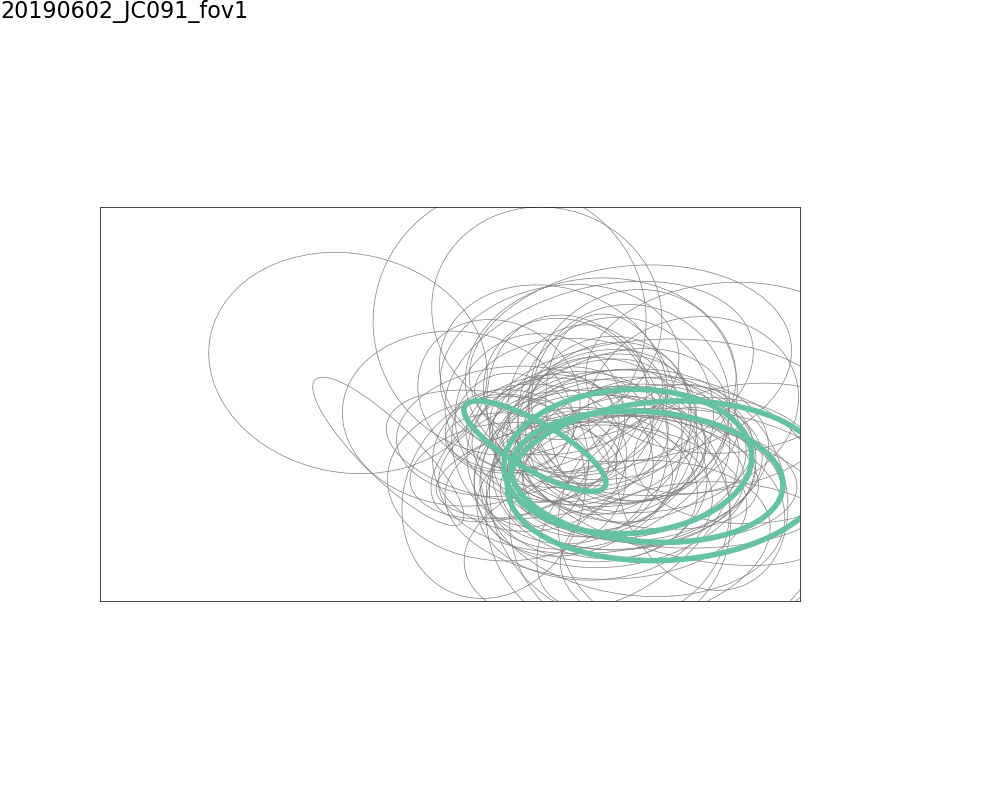

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples overlay_with_morphlevel_Li_20190602_JC091_fov1_rid-29-73-238-243


In [882]:
%matplotlib notebook
col = 0.5
fig, ax = pl.subplots(figsize=(5,4), dpi=100)
#fig.patch.set_visible(False) #(False) #('off')
other_rois = [r for r in fit_roi_list if r not in plot_rois]
ax = rfutils.plot_rfs_to_screen_pretty(rfs, sdf_rf, screen, 
                               fit_roi_list=other_rois, ax=ax, 
                               roi_colors=[(col, col, col)]*len(other_rois), 
                               ellipse_lw=0.25, stimulated_lc='none')
# ax = rfutils.plot_rfs_to_screen_pretty(fits_rfs, sdf_rf, screen, 
#                                fit_roi_list=w_ori, ax=ax, 
#                                roi_colors=ori_hues, ellipse_lw=1)
ax = rfutils.plot_rfs_to_screen_pretty(fits_rfs, sdf_rf, screen, 
                               fit_roi_list=plot_rois, ax=ax, 
                               roi_colors=plot_param_hues, 
                               ellipse_lw=2, stimulated_lc='none')

#ax = fig.add_axes([0.2, 0.3, 0.1, 0.1], polar=True)
#pplot.polar_theta_legend(ax, ori_colors, add_text=False)
pl.subplots_adjust(left=0.1, right=0.8)
pplot.label_figure(fig,dk)
figname='overlay_with_%s_%s_%s_rid-%s' % (hue_var, va, dk, 
                                         '-'.join([str(s) for s in sorted(plot_rois)])) 
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(examples_dir, figname)

In [883]:
fits_rfs.loc[plot_rois].dropna()

,cell,size_tol,best_morphlevel,morph_sel,best_size,best_morphlevel_normed,visual_area,datakey,experiment,animalid,...,fy,ratio_xy,major_axis,minor_axis,anisotropy,aniso_index,eccentricity,eccentricity_ctr,rf_theta_deg,aspect_ratio
73,73,0.637518,92.0,0.405758,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,10.173116,0.293725,11.739830,3.448280,0.545924,-0.000988,16.197646,16.197646,150.059841,3.404547
238,238,0.189130,92.0,0.163112,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.372946,2.007872,23.147460,11.553861,0.334893,-0.295847,39.274200,39.274200,3.362247,2.007872
243,243,0.237923,92.0,0.281017,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.537204,2.097060,19.810248,9.446676,0.354226,-0.299253,35.876366,35.876366,175.549580,2.097060
29,29,0.315453,92.0,0.298228,10.0,0.867925,Li,20190602_JC091_fov1,blobs,JC091,...,1.014502,1.724915,18.041990,10.459640,0.266032,-0.236114,31.923260,31.923260,3.223446,1.724915


In [359]:
plot_rois

array([331, 248, 267, 252, 277, 523, 211, 530, 206, 255])

In [63]:
fits_rfs.columns

Index(['cell', 'size_tol', 'best_morphlevel', 'morph_sel', 'best_size',
       'best_morphlevel_normed', 'visual_area', 'datakey', 'experiment',
       'ml_pos', 'ap_pos', 'x0', 'y0', 'fwhm_x', 'fwhm_y', 'theta', 'offset',
       'amplitude', 'sigma_x', 'sigma_y', 'fwhm_avg', 'std_avg', 'area', 'fx',
       'fy', 'ratio_xy', 'major_axis', 'minor_axis', 'anisotropy',
       'aniso_index', 'eccentricity', 'eccentricity_ctr', 'rf_theta_deg',
       'aspect_ratio'],
      dtype='object')

## Visualize traces

In [792]:
import analyze2p.extraction.traces as traceutils

In [884]:
importlib.reload(aggr)
importlib.reload(traceutils)

<module 'analyze2p.extraction.traces' from '/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-pipeline/repos/rat-2p-area-characterizations/analyze2p/extraction/traces.py'>

In [885]:
data_fpath = traceutils.get_data_fpath(dk, experiment_name='blobs',
                                       rootdir=rootdir)
print(data_fpath)
raw_traces, labels, sdf, run_info = traceutils.load_dataset(data_fpath, 
                                                    trace_type='corrected',
                                                    rootdir=rootdir)
processed, trialmetrics = aggr.process_traces(raw_traces, labels, 
                        trace_type='dff', 
                        response_type='dff', trial_epoch='stimulus')

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-data/JC091/20190602/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_573669_traces001_3d2687_traces001_17838a_traces001_452178_traces001_c84a17_traces001_faae98/data_arrays/corrected.npz
--- processed traces: dff


In [886]:
top_rois_with_rfs

array([ 73, 238, 243,  29, 233,  43,  53,  96,  89,  37,  33, 241,  50,
        83,  23, 336,  84, 338,  81,  38])

In [887]:
sdf['morphlevel'].unique()

array([-1, 0, 14, 27, 40, 53, 66, 79, 92, 106], dtype=object)

In [888]:
morphlevels
selected_morphlevels = sorted(sdf['morphlevel'].unique())[1:]
selected_morphlevels.append(-1)
print(selected_morphlevels)

[0, 14, 27, 40, 53, 66, 79, 92, 106, -1]


In [889]:
# Get mean for each cell for each config
means = NDATA[(NDATA['visual_area']=='Li')].groupby(['datakey', 'cell', 'config']).mean().reset_index()
means['morphlevel'] = [sdf.loc[c]['morphlevel'] for c in means['config']]

# Get cells with large respnses to NON-luminance stimuli:
#d2 = means[(means['morphlevel']!=-1) & (means['response']>0.2)][['datakey', 'cell']]
d2 = means[(means['response']>0.2)][['datakey', 'cell']]

d3 = means[(means['datakey'].isin(d2['datakey']))
          & (means['cell'].isin(d2['cell']))]
# Of these, get cells also with low responses to LUM controls:
d_list = []
for (k, ce), d_ in d3.groupby(['datakey', 'cell']):
    if all(d_[d_['morphlevel']==-1]['response'] < 0.1):
        d_list.append(d_)
print(len(d_list))
d = pd.concat(d_list)
d[['datakey', 'cell']].drop_duplicates()

10


,datakey,cell
5445,20190602_JC091_fov1,40
6545,20190602_JC091_fov1,76
7245,20190602_JC091_fov1,234
12945,20190614_JC091_fov1,55
13295,20190614_JC091_fov1,76
13945,20190614_JC091_fov1,234
15245,20190614_JC091_fov1,331
16345,20191018_JC113_fov1,55
17395,20191018_JC113_fov1,106
18895,20191111_JC120_fov1,44


In [890]:
# dk='20190614_JC091_fov1'
print(dk)

20190602_JC091_fov1


In [368]:
### rid = 217
t_list=[]
# curr_plot_rois = [76, 234, 40]
curr_plot_rois = top_rois_with_rfs[0:20]
for rid in curr_plot_rois: #top_rois_with_rfs[0:20]:
    best_sz = int(morph_curves[morph_curves['cell']==rid]['best_size'].unique())
    cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(selected_morphlevels)]\
                .index.tolist()
    tdf = traceutils.get_mean_and_std_traces(rid, processed, labels, 
                    cfgs_, sdf[sdf.morphlevel.isin(selected_morphlevels)], 
                    param='morphlevel', 
                    return_stacked=True, smooth=True, win_size=9)
    tdf['has_rfs'] = ~np.isnan(fits_rfs.loc[rid]['x0'])
    tdf['cell']=rid
    tdf['best_morphlevel'] = best_ixs.loc[rid]['best_morphlevel']
    tdf['best_size'] = best_ixs.loc[rid]['best_size']
    t_list.append(tdf)
trace_ex = pd.concat(t_list, axis=0)
trace_ex = trace_ex.reset_index(drop=True)
trace_ex['sem_lo'] = trace_ex['mean'].values - trace_ex['sem'].values
trace_ex['sem_hi'] = trace_ex['mean'].values + trace_ex['sem'].values
trace_ex.head()

,time,morphlevel,mean,sem,has_rfs,cell,best_morphlevel,best_size,sem_lo,sem_hi
0,-1.007764,-1,0.016731,0.052455,True,331,66.0,50.0,-0.035725,0.069186
1,-0.985370,-1,0.013619,0.054504,True,331,66.0,50.0,-0.040885,0.068122
2,-0.962975,-1,0.032704,0.055551,True,331,66.0,50.0,-0.022847,0.088256
3,-0.940580,-1,0.049702,0.056239,True,331,66.0,50.0,-0.006536,0.105941
4,-0.918185,-1,0.027248,0.053879,True,331,66.0,50.0,-0.026631,0.081127


In [369]:
selected_morphlevels

[0, 14, 27, 40, 53, 66, 79, 92, 106, -1]

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning_MIGR/examples top_traces_has_rfs__morphlevel_Li_20191111_JC120_fov1


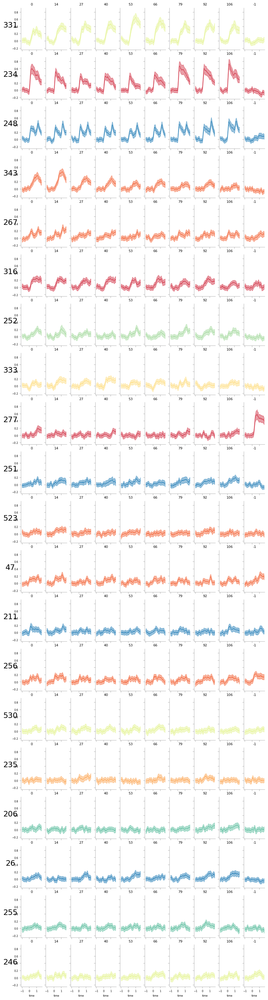

In [383]:
%matplotlib inline
hue_var = 'morphlevel'
hue_cdict = morph_cdict.copy() if hue_var=='morphlevel' else size_cdict.copy()
fg = sns.FacetGrid(data=trace_ex, col=hue_var, col_order=selected_morphlevels, 
               row='cell', row_order=curr_plot_rois,  height=2, aspect=0.5,
               hue='best_%s' % hue_var, palette=hue_cdict)
#                hue='has_rfs', palette={True: 'r', False:'b'}, height=2, aspect=0.5)
fg.map(pl.plot, 'time', 'mean', lw=1)
fg.map(pl.fill_between, 'time', 'sem_lo', 'sem_hi', alpha=0.5)
fg.fig.patch.set_alpha(1)
fg.set_titles('{row_name}|{col_name}', size=18)
pl.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)
for ax in fg.fig.axes:
    rname, mlevel = ax.get_title().split('|')
    if float(mlevel)==0:
        ax.set_ylabel(rname,rotation=0, fontsize=18)
    ax.set_title(mlevel)
figname = 'top_traces_has_rfs__%s_%s_%s' % (hue_var, va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
print(examples_dir, figname)

In [387]:
hue_cdict

{0: (0.8310649750096117, 0.23844675124951936, 0.30880430603613995),
 14: (0.9568627450980393, 0.42745098039215684, 0.2627450980392157),
 27: (0.9914648212226067, 0.677354863514033, 0.37808535178777386),
 40: (0.996078431372549, 0.8784313725490196, 0.5450980392156862),
 53: (0.998077662437524, 0.9992310649750096, 0.7460207612456747),
 66: (0.9019607843137256, 0.9607843137254902, 0.5960784313725491),
 79: (0.6652825836216842, 0.8645905420991927, 0.6432141484044599),
 92: (0.4, 0.7607843137254902, 0.6470588235294118),
 106: (0.19946174548250672, 0.5289504036908881, 0.7391003460207612)}

In [893]:
%matplotlib notebook

<IPython.core.display.Javascript object>


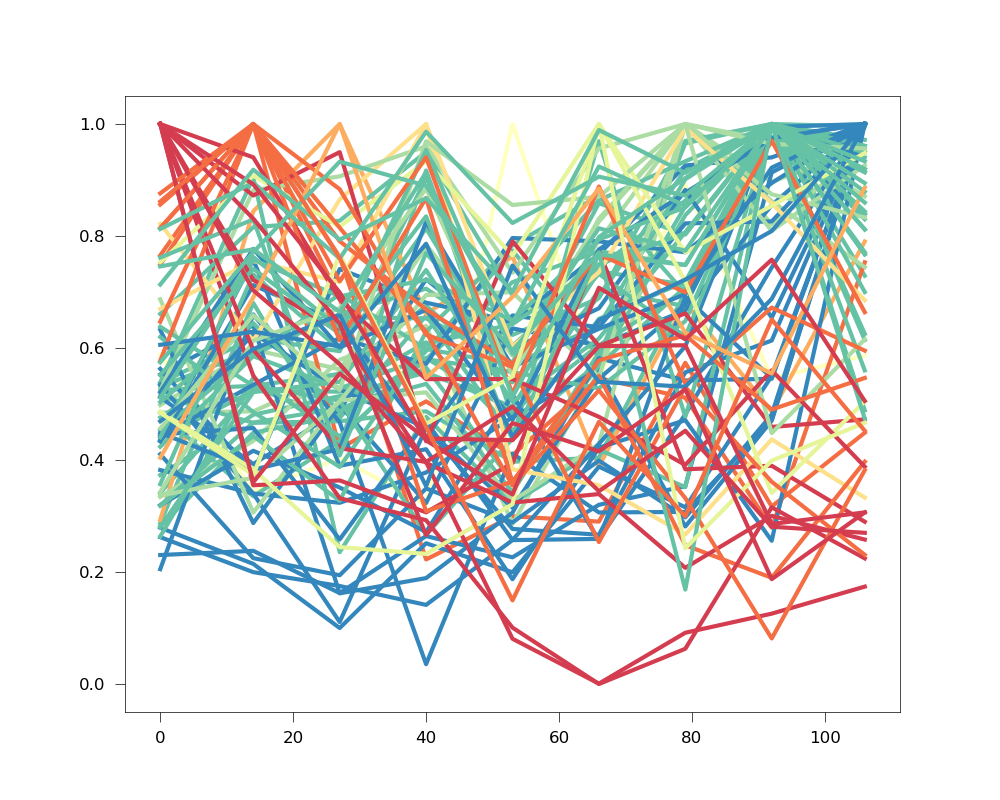

In [894]:
fig, ax = pl.subplots()
for rid in morph_mat.columns:
    ax.plot(morph_mat[rid], color=hue_cdict[ixs_pos.loc[rid]['best_morphlevel']])

8, 79, 133

In [585]:
importlib.reload(traceutils)

<module 'analyze2p.extraction.traces' from '/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-pipeline/repos/rat-2p-area-characterizations/analyze2p/extraction/traces.py'>

In [895]:
# plot_rois = [73, 33, 50]

traces_examples_best-morphlevel_Li_raw_rid-33-50-73_20191111_JC120_fov1


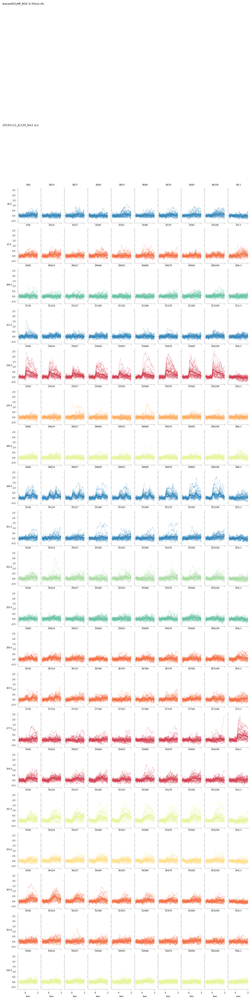

In [374]:
plot_raw=True
plot_str='raw' if plot_raw else 'shade'

hue_var = 'morphlevel'
hue_cdict = morph_cdict.copy() if hue_var=='morphlevel' else size_cdict.copy()

if plot_raw:
    r_list=[]
    for rid in curr_plot_rois: #plot_rois:
        best_sz = best_ixs.loc[rid]['best_size']
        best_mp = best_ixs.loc[rid]['best_morphlevel']
        if hue_var=='morphlevel':
            cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(selected_morphlevels)]\
                        .index.tolist()
        else:
            cfgs_ = sdf[(sdf['morphlevel']==best_mp) & sdf['size'].isin(sizes)]\
                        .index.tolist()
        df_ = traceutils.roi_traces_df(rid, processed, labels, sdf, 
                        params=[hue_var],
                        cfgs_=cfgs_, smooth_win_size=9)
        df_['best_morphlevel'] = best_mp
        df_['best_size'] = best_sz
        df_['cell'] = rid
        r_list.append(df_)
    roidf = pd.concat(r_list, axis=0, ignore_index=True)
    fig = traceutils.plot_raw_traces_roi_set(roidf, response_var='smoothed', 
                                param=hue_var, param_order=selected_morphlevels,
                                hue_var='best_%s' % hue_var, hue_cdict=hue_cdict,
                                lw=2, trial_lw=0.5, trial_alpha=0.5)
else:
    tdf = trace_ex[trace_ex['cell'].isin(plot_rois)].copy()
    fig = traceutils.plot_mean_sem_roi_set(tdf, response_var='smoothed', 
                                param=hue_var, param_order=selected_morphlevels,
                                hue_var='best_%s' % hue_var, hue_cdict=hue_cdict,
                                lw=2)
pl.subplots_adjust(left=0.05, right=0.8, bottom=0.2, top=0.85)
fig.text(0.0, 0.9, '%s (%s)' % (dk, va), fontsize=8)

pplot.label_figure(fig, data_id)
figname = 'traces_examples_best-%s_%s_%s_rid-%s_%s' % (hue_var, va, plot_str, \
                                        '-'.join([str(s) for s in sorted(plot_rois)]), 
                                                      dk)
print(figname)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.png' % figname))


In [375]:
ixs_pos[ixs_pos['cell']==76][['ml_pos', 'ap_pos']]

,ml_pos,ap_pos
76,79.956164,880.319374


In [376]:
ixs_pos[ixs_pos['cell']==234][['ml_pos', 'ap_pos']]

,ml_pos,ap_pos
234,376.936204,974.803914


In [395]:
hue_var='morphlevel_normed'

In [900]:
ixs_pos['best_morphlevel_normed'] = ixs_pos['best_morphlevel_normed'].round(3)

<IPython.core.display.Javascript object>


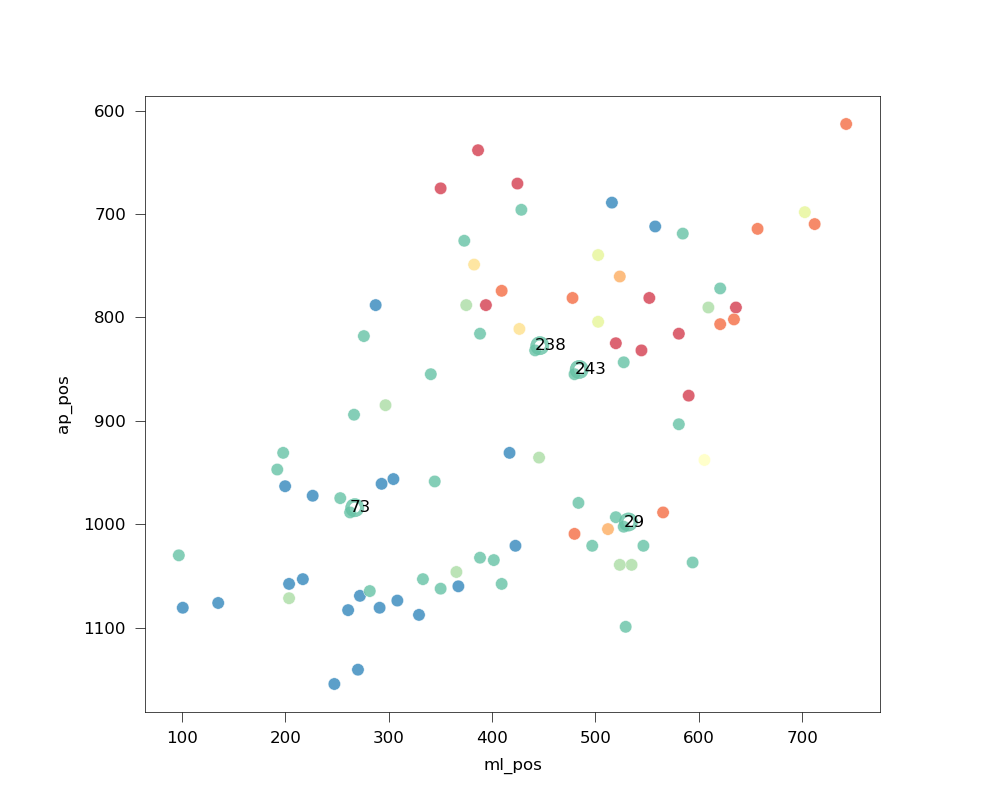

In [901]:
fig, ax = pl.subplots()
hue_var='morphlevel_normed'
#for ai, hue_var in enumerate(['morphlevel_normed']):
hue_levels = np.array(morphlevels)/float(max(morphlevels)) \
                    if hue_var=='morphlevel_normed' else sizes
curr_palette = morph_cdict_normed.copy() if hue_var=='morphlevel_normed'\
                    else size_cdict.copy()
hue_min, hue_max = min(hue_levels), max(hue_levels)
cmap=morph_cmap if hue_var =='morphlevel_normed' else size_cmap
norm = pl.Normalize(hue_min, hue_max)

#ax=axn[ai]
sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                hue='best_%s' % hue_var, palette=curr_palette,
                s=20,linewidth=0.2, alpha=0.8)
ax.set_aspect(1)
ax.legend_.remove()
ax.invert_yaxis()

sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos.loc[plot_rois], ax=ax,
                    hue='best_%s' % hue_var, palette=curr_palette,
                    s=100,linewidth=0.2, alpha=0.8,
                    marker="$\circ$", ec="face")
ax.legend_.remove()
for rid in plot_rois:
    ax.text(ixs_pos.loc[rid]['ml_pos'], ixs_pos.loc[rid]['ap_pos'],rid)
            

In [595]:
import matplotlib.colors as mcolors

# def triplet_to_color(triplet):
#     """Converts an RGB triplet to a color string."""
#     return mcolors.to_hex(triplet)
import matplotlib.cm as cm

# def convert_range(oldval, newmin=None, newmax=None, oldmax=None, oldmin=None):
#     oldrange = (oldmax - oldmin)
#     newrange = (newmax - newmin)
#     newval = np.array( (((oldval - oldmin) * newrange) / oldrange) + newmin)
#     if any(newval)>1:
#         newval[newval>1]=1
#     if any(newval)<0:
#         newval[newval<0]=0
# #     return newval

# def scale_range(v, minval=0, maxval=1):
#     v1 = (v - minval) / (maxval - minval)
#     return v1

In [711]:
dk

'20191111_JC120_fov1'

In [902]:
plot_rois

roi_styles = ['-']*len(plot_rois)

roi_colors=[]
for rid in plot_rois:
    color_code = np.array([morph_mat[rid].iloc[0:3].mean(), 
                          morph_mat[rid].iloc[3:6].mean(),
                          morph_mat[rid].iloc[6:].mean() ])
    roi_colors.append(color_code) #/max(color_code)) #triplet_to_color(color_code))

In [903]:
roi_colors

[array([0.5127127 , 0.55804862, 0.84721771]),
 array([0.76809283, 0.83620677, 0.96073455]),
 array([0.63047584, 0.72174241, 0.89840388]),
 array([0.57505629, 0.68468139, 0.94498681])]

<IPython.core.display.Javascript object>


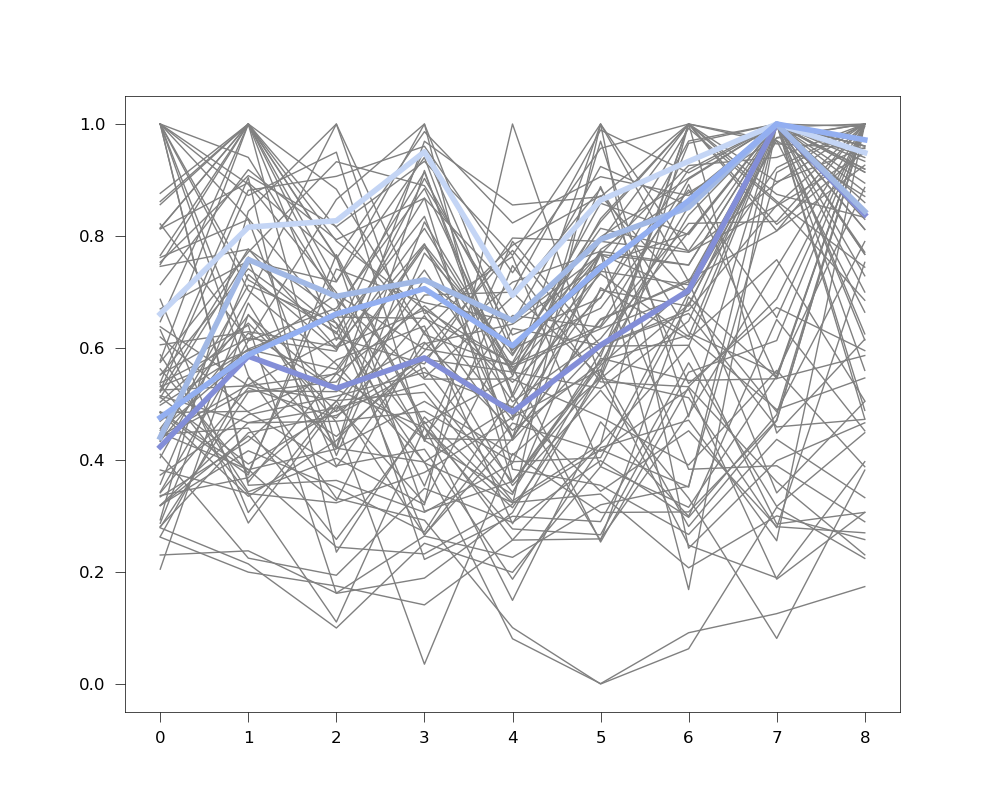

In [904]:
# plot.
fig, ax = pl.subplots() #1,2, figsize=(7,5), dpi=100,sharey=True)
fig.patch.set_alpha(1)

rois_mp_labels=None
if plot_rois is not None:
    rois_mp_labels = ['Cell %i, MX=%.2f (best sz=%i)' % \
                     (rid, best_ixs.loc[rid]['morph_sel'], 
                     int(best_ixs.loc[rid]['best_size'])) for rid in plot_rois]
ax = sel.plot_overlaid_tuning_curves(morph_mat, rank_order=False, ax=ax,
                                rois_plot=plot_rois, roi_styles=roi_styles,
                                roi_colors=roi_colors,
                                roi_labels=rois_mp_labels, lw=0.5, lc='gray',
                                roi_lw=2)

In [616]:
roi_colors

[array([0.60390194, 0.891295  , 0.7073776 ]),
 array([0.74821471, 0.66707472, 0.89571776]),
 array([0.92840375, 0.67421289, 0.84078355]),
 array([0.68229111, 0.51210867, 0.88481828]),
 array([0.8299075 , 0.56056652, 0.73564492]),
 array([0.73989533, 0.48701869, 0.58764138]),
 array([0.84315302, 0.67634887, 0.7341932 ]),
 array([0.83305257, 0.85400498, 0.653497  ]),
 array([0.29564501, 0.06331586, 0.69120212]),
 array([0.53994364, 0.49532944, 0.66878002])]

In [905]:
ixs_pos['tuning_color_code'] = None

#roi_colors=[]
tuning_cdict={}
for rid, irow in ixs_pos.iterrows():
#     color_code = (morph_mat[rid].iloc[0:3].mean(), 
#                   morph_mat[rid].iloc[3:6].mean(),
#                   morph_mat[rid].iloc[6:].mean())
#     color_code = np.array(color_code)/max_roi_color
    color_code = np.array([morph_mat[rid].iloc[0:3].mean(), 
                          morph_mat[rid].iloc[3:6].mean(),
                          morph_mat[rid].iloc[6:].mean() ])
#     color_code = color_code/max(color_code)
    tuning_cdict[rid] = color_code
    #roi_colors.append(color_code) #triplet_to_color(color_code))

In [916]:
%matplotlib notebook

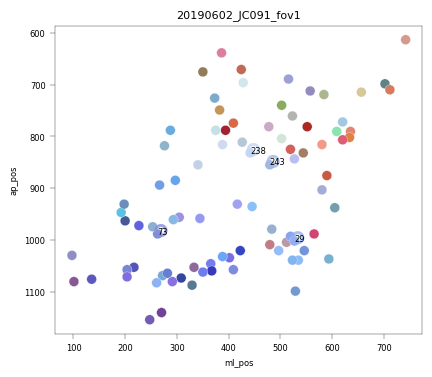

In [930]:
label_rois = True
fig, ax = pl.subplots()
#for ai, hue_var in enumerate(['morphlevel_normed']):
hue_levels = np.array(morphlevels)/float(max(morphlevels)) \
                    if hue_var=='morphlevel_normed' else sizes
curr_palette = morph_cdict_normed.copy() if hue_var=='morphlevel_normed'\
                    else size_cdict.copy()
hue_min, hue_max = min(hue_levels), max(hue_levels)
cmap=morph_cmap if hue_var =='morphlevel_normed' else size_cmap
norm = pl.Normalize(hue_min, hue_max)

#ax=axn[ai]
sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos, ax=ax,
                hue='cell', palette=tuning_cdict,
                s=50,linewidth=0.2, alpha=1)
ax.set_aspect(1)
ax.legend_.remove()
ax.invert_yaxis()

if label_rois:
    sns.scatterplot(x='ml_pos', y='ap_pos', data=ixs_pos.loc[plot_rois], ax=ax,
                        hue='cell', palette=tuning_cdict,
                        s=200,linewidth=0.2, alpha=0.8,
                        marker="$\circ$", ec="face")
    ax.set_aspect(1)
    ax.legend_.remove()
    for rid in plot_rois:
        ax.text(ixs_pos.loc[rid]['ml_pos'], ixs_pos.loc[rid]['ap_pos'],rid)
ax.set_title(dk)

figname = 'spatial_layout_color_tuning_{}-{}_labeled'.format(va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))

In [670]:
272 in trace_ex['cell'].unique()


False

traces_examples_best-morphlevel_V1_raw_rid-1-79-126_20190507_JC083_fov1


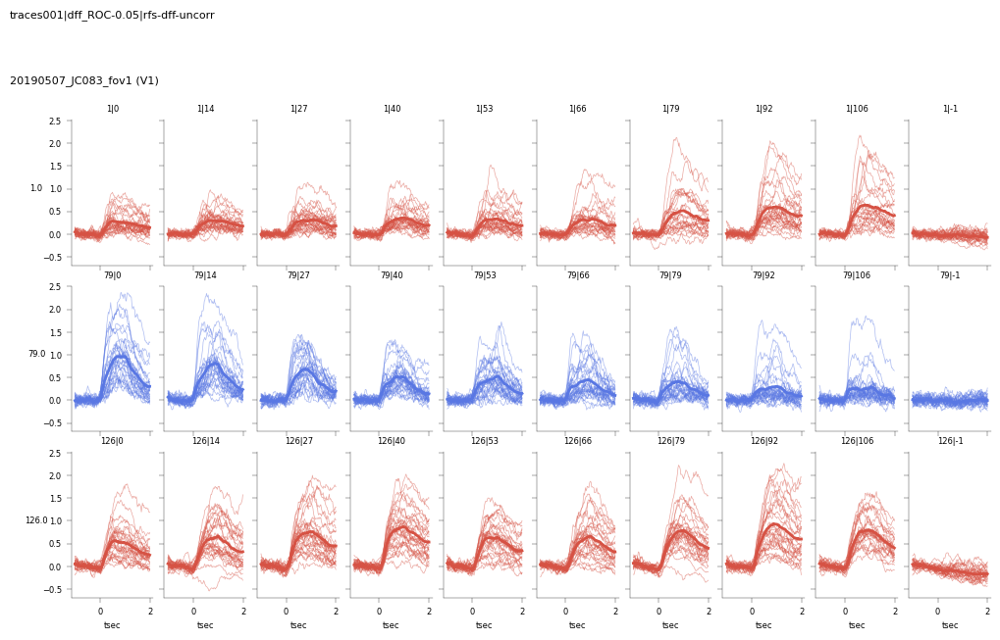

In [62]:
plot_raw=True
plot_str='raw' if plot_raw else 'shade'

hue_var = 'morphlevel'
hue_cdict = morph_cdict.copy() if hue_var=='morphlevel' else size_cdict.copy()

if plot_raw:
    r_list=[]
    for rid in curr_plot_rois; #plot_rois:
        best_sz = best_ixs.loc[rid]['best_size']
        best_mp = best_ixs.loc[rid]['best_morphlevel']
        if hue_var=='morphlevel':
            cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(selected_morphlevels)]\
                        .index.tolist()
        else:
            cfgs_ = sdf[(sdf['morphlevel']==best_mp) & sdf['size'].isin(sizes)]\
                        .index.tolist()
        df_ = traceutils.roi_traces_df(rid, processed, labels, sdf, 
                        params=[hue_var],
                        cfgs_=cfgs_, smooth_win_size=9)
        df_['best_morphlevel'] = best_mp
        df_['best_size'] = best_sz
        df_['cell'] = rid
        r_list.append(df_)
    roidf = pd.concat(r_list, axis=0, ignore_index=True)
    fig = traceutils.plot_raw_traces_roi_set(roidf, response_var='smoothed', 
                                param=hue_var, param_order=selected_morphlevels,
                                hue_var='best_%s' % hue_var, hue_cdict=hue_cdict,
                                lw=2, trial_lw=0.5, trial_alpha=0.5)
else:
    tdf = trace_ex[trace_ex['cell'].isin(plot_rois)].copy()
    fig = traceutils.plot_mean_sem_roi_set(tdf, response_var='smoothed', 
                                param=hue_var, param_order=selected_morphlevels,
                                hue_var='best_%s' % hue_var, hue_cdict=hue_cdict,
                                lw=2)
pl.subplots_adjust(left=0.05, right=0.8, bottom=0.2, top=0.85)
fig.text(0.0, 0.9, '%s (%s)' % (dk, va), fontsize=8)

pplot.label_figure(fig, data_id)
figname = 'traces_examples_best-%s_%s_%s_rid-%s_%s' % (hue_var, va, plot_str, \
                                        '-'.join([str(s) for s in sorted(plot_rois)]), 
                                                      dk)
print(figname)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
pl.savefig(os.path.join(FIGDIR, '%s.png' % figname))


In [281]:
os.path.exists('/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/FIGURES/correlations_MIGR/')

True

In [300]:
FIGDIR

'/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/FIGURES/correlations_MIGR'

[1, 19, 94]


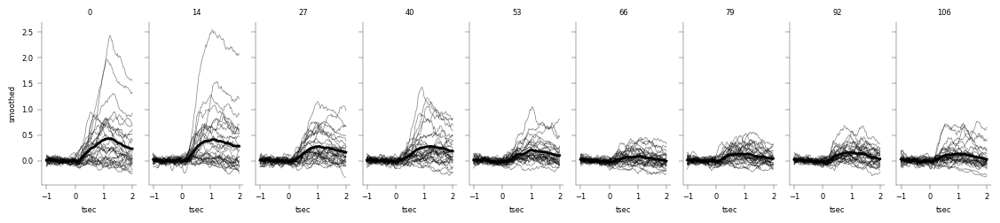

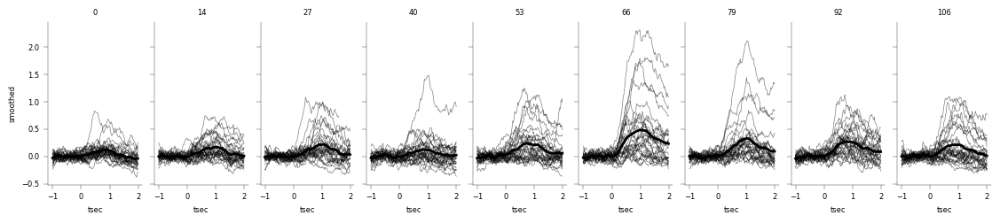

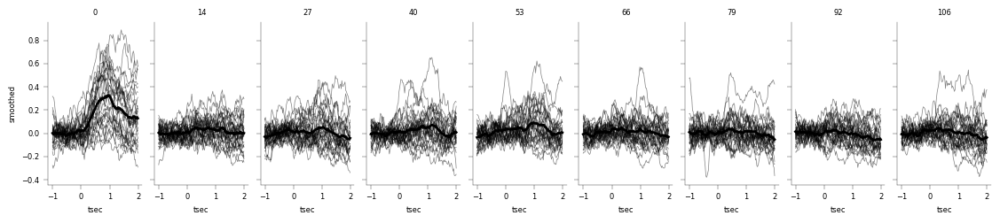

In [156]:
#rid=57
# [1, 19, 94]
print(plot_rois)
rid=94
for rid in plot_rois:
    best_sz = int(morph_curves[morph_curves['cell']==rid]['best_size'].unique())
    cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(morphlevels)]\
                    .index.tolist()

    roidf = traceutils.roi_traces_df(rid, processed, labels, sdf, params=['morphlevel'], 
                         cfgs_=cfgs_, smooth_win_size=9)

    fig = traceutils.plot_raw_traces_tuning_curve(roidf, response_var='smoothed', 
                                    param='morphlevel', color='k',
                                    lw=2, trial_lw=0.5, trial_alpha=0.5)

In [694]:
# mp=0
# tmat = np.squeeze(np.dstack(roidf[roidf['morphlevel']==mp]\
#                             .groupby('trial_ix')['smoothed']\
#                             .apply(np.array).values))
# np.nanmean(tmat, axis=1)

In [160]:
morph_cdict

{0: (0.34832334141176474, 0.4657111465098039, 0.8883461629411764),
 14: (0.48385432959999997, 0.6220498496, 0.9748082026),
 27: (0.6193179451882354, 0.7441207347647059, 0.9989309188196078),
 40: (0.753610618, 0.830232851, 0.960871157),
 53: (0.8674276350862745, 0.864376599772549, 0.8626024620196079),
 66: (0.9473454036, 0.7946955048, 0.7169905058),
 79: (0.9684997476666667, 0.673977379772549, 0.5566492560470588),
 92: (0.9318312966, 0.5190855232, 0.4064796086),
 106: (0.8393649370784314, 0.32185622094117644, 0.26492398098039216)}

In [161]:
rid_colors={}
rtraces_=[]
for rid in plot_rois:
    best_sz = int(morph_curves[morph_curves['cell']==rid]['best_size'].unique())
    best_m = float(best_ixs.loc[rid]['best_morphlevel'])
    #best_s = float(best_ixs.loc[rid]['best_size'])
    
    cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(morphlevels)]\
                    .index.tolist()
    roidf = traceutils.roi_traces_df(rid, processed, labels, sdf, 
                        params=['morphlevel'], cfgs_=cfgs_, smooth_win_size=9)
    roidf['best_morphlevel'] = float(best_ixs.loc[rid]['best_morphlevel'])
    roidf['best_size'] = float(best_ixs.loc[rid]['best_size'])
    roidf['cell'] = rid
    rid_colors.update({rid: morph_cdict[best_m]})
    rtraces_.append(roidf)

In [162]:
roitraces = pd.concat(rtraces_, axis=0,ignore_index=True)

In [163]:
roitraces.columns

Index(['config', 'frame', 'stim_dur', 'trial', 'tsec', 'stim_on_frame',
       'nframes_on', 'run_ix', 'file_ix', 'response', 'morphlevel', 'smoothed',
       'trial_ix', 'best_morphlevel', 'best_size', 'cell'],
      dtype='object')

In [794]:
# max_ntrials = roitraces['trial_ix'].max()+1
# trial_styles = tuple((k, '-') for k in np.arange(0, max_ntrials))
# fg = sns.FacetGrid(col='morphlevel', col_order=morphlevels,
#                   data=roitraces, row='cell',
#                   hue='best_morphlevel', palette=morph_cdict, height=2.5, aspect=0.5)
# fg.map(sns.lineplot, 'tsec', 'smoothed', 'best_morphlevel', 'trial_ix',
#        dashes=trial_styles, palette=morph_cdict, sizes=(0.25, 0.25), alpha=0.7)


In [191]:
importlib.reload(traceutils)

<module 'analyze2p.extraction.traces' from '/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/2p-pipeline/repos/rat-2p-area-characterizations/analyze2p/extraction/traces.py'>

1 14.0


<IPython.core.display.Javascript object>


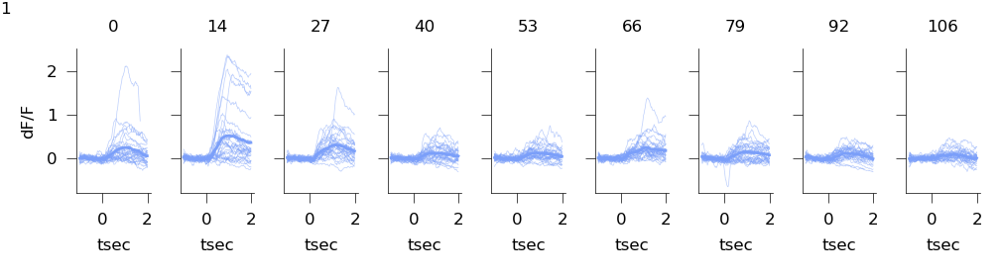

19 66.0


<IPython.core.display.Javascript object>


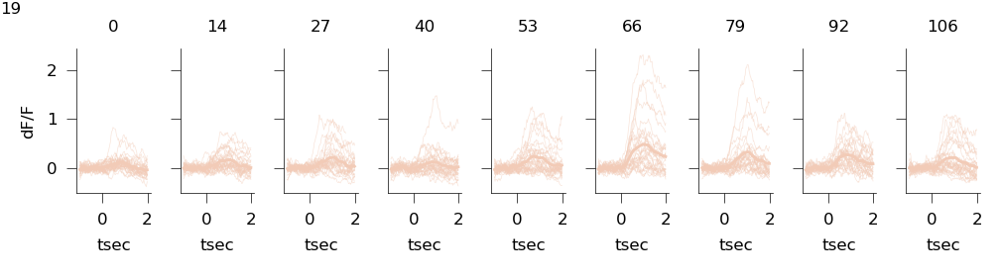

94 0.0


<IPython.core.display.Javascript object>


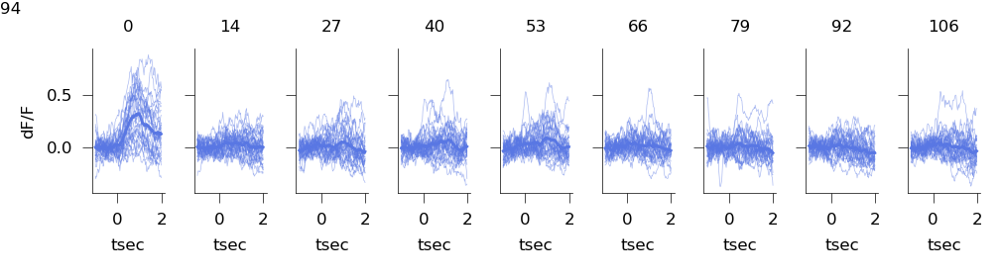

In [201]:
# r1, r2 = cpair
# cc, dist = pw_df[pw_df['neuron_pair']=='%s_%i' % (r1, r2)]\
#             [['pearsons_morph', 'cortical_distance']].values[0]
tdf = trace_ex[trace_ex['cell'].isin(plot_rois)].copy()
rid_colors={}
#tdf.head()
for rid, td in tdf.groupby('cell'):
    best_m = float(best_ixs.loc[rid]['best_morphlevel'])
    best_s = float(best_ixs.loc[rid]['best_size'])
    tdf.loc[td.index, 'best_morphlevel'] = best_m
    tdf.loc[td.index, 'best_size'] = best_s
    print(rid, best_m)
    rid_colors.update({rid: morph_cdict[best_m]})
    roidf = traceutils.roi_traces_df(rid, processed, labels, sdf, params=['morphlevel'], 
                         cfgs_=cfgs_, smooth_win_size=9)

    fig = traceutils.plot_raw_traces_tuning_curve(roidf, response_var='smoothed', 
                                    param='morphlevel', color=rid_colors[rid],
                                    lw=1, trial_lw=0.25, trial_alpha=0.5,
                                    fig_height=1.4, fig_aspect=0.4)
    fig.text(0.0, 0.95, rid, fontsize=6)
    fig.axes[0].set_ylabel('dF/F')
    figname = 'rawtrace_rid%i_%s_%s' % (rid, va, dk)
    pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
    pl.savefig(os.path.join(FIGDIR, '%s.svg' % figname))
# fg = sns.FacetGrid(data=tdf, col='morphlevel', col_order=morphlevels, 
#                row='cell', hue='best_morphlevel', palette=morph_cdict,
#                height=2, aspect=1)
# fg.map(pl.plot, 'time', 'mean', lw=1)
# fg.set_titles('{row_name}|{col_name}')
# fg.fig.patch.set_alpha(1)

# fg.fig.patch.set_alpha(1)
#label = '%s\ncc=%.2f,\nD=%.2f' % (str(cpair), cc, dist)
#fg.fig.text(0.02, 0.5, label, fontsize=12)

In [179]:
print(FIGDIR)

/n/holylfs05/LABS/pfister_lab/Lab/coxfs01/julianarhee/aggregate-visual-areas/FIGURES/correlations_MIGR


In [111]:
x0['morphlevel'] = sdf.loc[x0['config'].values]['morphlevel'].values
x0['size'] = sdf.loc[x0['config'].values]['size'].values


sz: (10.0, 50.0)
mp: (0, 106)
/n/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning/examples allcond_tuning_curves_examples__V1_20190613_JC097_fov1


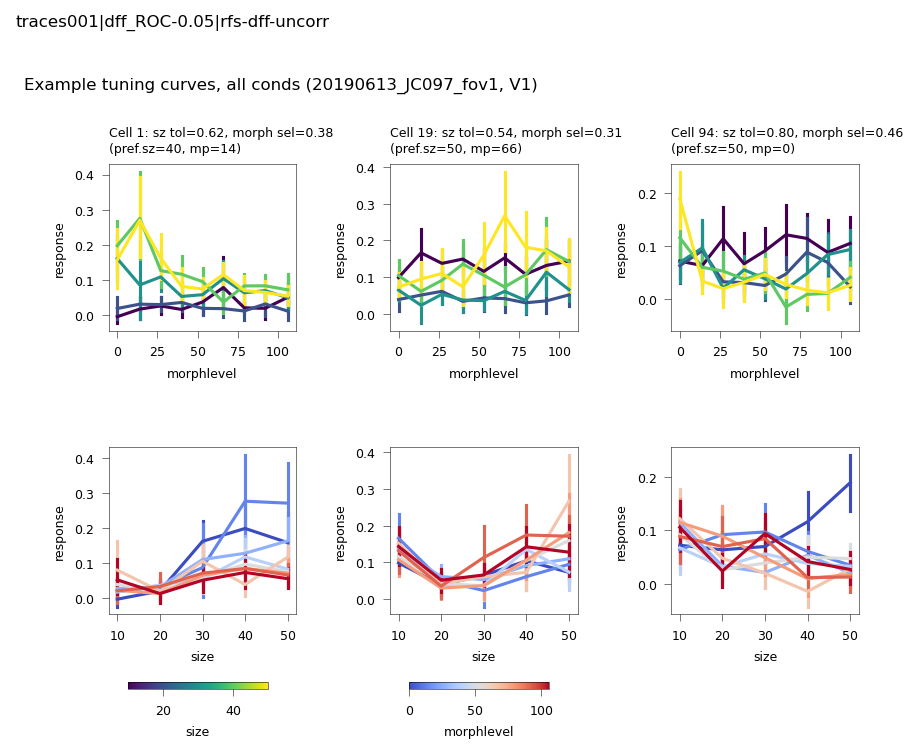

In [114]:
size_lims = (min(sizes), max(sizes))
morph_lims = (min(morphlevels), max(morphlevels))
size_cmap= 'viridis'
morph_cmap = 'coolwarm'

print("sz: %s" % str(size_lims))
print("mp: %s" % str(morph_lims))

fig, axn = pl.subplots(2, len(plot_rois), figsize=(6.25, 5), dpi=150, sharey=False)
fig.patch.set_alpha(1)
for ai, rid in enumerate(plot_rois):
    roi_resp = x0[(x0.cell==rid)].copy()
    #for 
    best_sz = best_ixs.loc[rid]['best_size']
    best_mp = best_ixs.loc[rid]['best_morphlevel']
    # plot
    ax=axn[0, ai]
    sns.lineplot(x='morphlevel', y='response', ax=ax,
                 data=roi_resp, err_style='bars', hue='size', palette=size_cmap)
    sel_v, tol_v = best_ixs.loc[rid][['morph_sel', 'size_tol']].values
    
    ax.set_title('Cell %i: sz tol=%.2f, morph sel=%.2f\n(pref.sz=%i, mp=%i)' \
                 % (rid, sel_v, tol_v, best_sz, best_mp), 
                 loc='left', fontsize=6)
    ax=axn[1, ai]
    sns.lineplot(x='size', y='response',  ax=ax,
                data=roi_resp, err_style='bars', hue='morphlevel', palette=morph_cmap)
fig.subplots_adjust(bottom=0.2)

for hi, hue_var in enumerate(['size', 'morphlevel']):
    cbar_ax = fig.add_axes([0.12+(hi*0.3), 0.1, 0.15, 0.01])
    ax=axn[hi, 2]
    cmap = size_cmap if hue_var=='size' else morph_cmap
    hue_min, hue_max = size_lims if hue_var=='size' else morph_lims
    ax.legend_.remove()
    hue_norm = pl.Normalize(hue_min, hue_max)
    sm = pl.cm.ScalarMappable(cmap=cmap, norm=hue_norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, cax=cbar_ax, 
                 orientation='horizontal', shrink=0.5, label=hue_var)
    for ax in axn[hi, 0:2]:
        ax.legend_.remove()
pl.subplots_adjust(left=0.1, right=0.9, wspace=0.5, hspace=0.7, top=0.8)
fig.text(0.01, 0.9, 'Example tuning curves, all conds (%s, %s)' \
         % (dk, va), fontsize=8)

pplot.label_figure(fig, data_id)
figname = 'allcond_tuning_curves_examples__%s_%s' % ( va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
print(examples_dir, figname)

#### Test tuning metrics

In [152]:
from scipy import signal

In [165]:
%matplotlib notebook
r1, r2 = plot_rois
print(r1, r2)
# r1 =0
# r2= 65
morph_mat, size_mat = sel.get_object_tuning_curves(rdf, 
                                        sort_best_size=False, normalize=True)

39 60


<IPython.core.display.Javascript object>


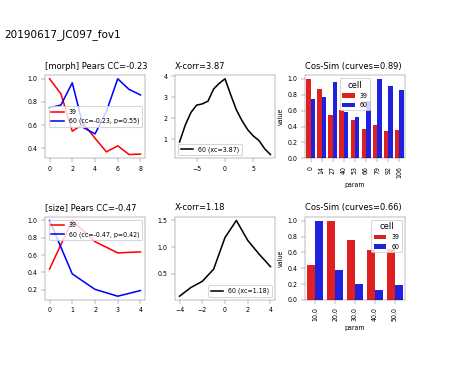

Text(0.01, 0.9, '20190617_JC097_fov1')

In [166]:
# r2 = 116
#r2 = 281
c1='r'
c2='b'
roi_colors={r1: c1, r2: c2}

fig, axn = pl.subplots(2,3, figsize=(6,5), dpi=100)
fig.patch.set_alpha(1)
for ri, stim_param in enumerate(['morph', 'size']):

    val_mat = morph_mat.copy() if stim_param=='morph' else size_mat.copy()
    curve1 = val_mat[r1].values
    curve2 = val_mat[r2].values
    levels = val_mat[r2].index.to_numpy() #.values

    ax=axn[ri, 0]
    ax.plot(curve1, label=r1, color=c1)
    cc, pv = spstats.pearsonr(curve1, curve2)
    ax.plot(curve2, label='%i (cc=%.2f, p=%.2f)' % (r2, cc, pv), color=c2)
    ax.set_title('[%s] Pears CC=%.2f' % (stim_param, cc), loc='left', fontsize=8)
    ax.legend()
    ax=axn[ri, 1]
    ccorr = signal.correlate(curve1, curve2)
    lags = signal.correlation_lags(len(curve1), len(curve1))
    #ax.legend()
    lagzero = list(lags).index(0)
    xcorr = ccorr[lagzero]
    ax.plot(lags, ccorr, label='%i (xc=%.2f)' % (r2, xcorr), color='k')
    ax.set_title('X-corr=%.2f' % xcorr, loc='left', fontsize=8)
    ax.legend()
    # --------------------------------------
    ax=axn[ri, 2]
    cosim_c = cr.cosine_similarity(curve1, curve2)
    # d0, cosim_m = cr.get_paired_tuning_metrics(fitdf, r1, r2)
    d1 = pd.DataFrame({'param': levels, 'value': curve1})
    d1['cell']=r1
    d2 = pd.DataFrame({'param':  levels, 'value': curve2})
    d2['cell']=r2
    d0 = pd.concat([d1, d2], axis=0)
    sns.barplot(x='param', y='value', hue='cell', data=d0, ax=ax,
               dodge=True, palette=roi_colors)
    ax.tick_params(axis='x', rotation=90)
    pl.subplots_adjust(bottom=0.5)
    cosim_m=0
    ax.set_title('Cos-Sim (curves=%.2f)' % (cosim_c), 
                loc='left', fontsize=8)

pl.subplots_adjust(left=0.1, right=0.9, bottom=0.2, wspace=0.3, top=0.8, hspace=0.7)
fig.text(0.01, 0.9, dk)

## Visualize: plot tuning curves

In [808]:
x0['morphlevel'] = sdf.loc[x0.config.values]['morphlevel'].values
x0['size'] = sdf.loc[x0.config.values]['size'].values
x0.head()

,datakey,config,trial,visual_area,cell,response,experiment,morphlevel,size
0,20190613_JC097_fov1,config037,1,V1,1,-0.003034,blobs,79,20.0
2,20190613_JC097_fov1,config013,3,V1,1,0.000708,blobs,14,30.0
3,20190613_JC097_fov1,config029,4,V1,1,0.038527,blobs,53,40.0
4,20190613_JC097_fov1,config021,5,V1,1,-0.020960,blobs,40,10.0
5,20190613_JC097_fov1,config032,6,V1,1,-0.010072,blobs,66,20.0


<IPython.core.display.Javascript object>


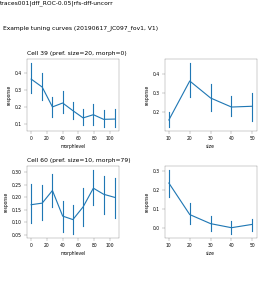

/n/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning/examples tuning_curves_rid39_60__V1_20190617_JC097_fov1


In [169]:
fig, axn = pl.subplots(2,2, figsize=(5,5.5))
fig.patch.set_alpha(1)
for ai, rid in enumerate(plot_rois):
    roi_resp = x0[(x0.cell==rid)].copy()
    best_sz = best_ixs.loc[rid]['best_size']
    best_mp = best_ixs.loc[rid]['best_morphlevel']
    # plot
    ax=axn[ai, 0]
    sns.lineplot(x='morphlevel', y='response', ax=ax,
                 data=roi_resp[roi_resp['size']==best_sz], err_style='bars')
    ax.set_title('Cell %i (pref. size=%i, morph=%i)' % (rid, best_sz, best_mp), 
                 loc='left', fontsize=8)
    ax=axn[ai, 1]
    sns.lineplot(x='size', y='response',  ax=ax,
                data=roi_resp[roi_resp['morphlevel']==best_mp], err_style='bars')

fig.text(0.01, 0.9, 'Example tuning curves (%s, %s)' % (dk, va), fontsize=8)
pl.subplots_adjust(left=0.1, right=0.95,bottom=0.2, wspace=0.5, top=0.8, hspace=0.5)


pplot.label_figure(fig, data_id)
figname = 'tuning_curves_rid%i_%i__%s_%s' % (r1, r2, va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
print(examples_dir, figname)

# Calculate diffs

In [83]:
importlib.reload(sel)

<module 'analyze2p.objects.selectivity' from '/net/coxfs01/srv/export/coxfs01/share_root/2p-pipeline/repos/rat-2p-area-characterizations/analyze2p/objects/selectivity.py'>

In [34]:
# cc = cr.get_pw_tuning(rdf, stimulus='blobs')
# tuning_dists = cr.correlate_pw_tuning_in_fov(rdf, stimulus='blobs',
#                                 sort_best_size=False, normalize=True)
# n_pairs=len(tuning_dists['neuron_pair'].unique())
# tuning_dists.head()

# Get PW differences (tuning)
tuning_dists = cr.correlate_pw_tuning_in_fov(rdf, stimulus='blobs',
                                        sort_best_size=False, normalize=True)

NameError: name 'posdf_' is not defined

In [32]:
# metric = 'pearsons'
# fig, axn = pl.subplots(1,3, figsize=(6,3))
# ax=axn[0]
# sns.histplot(x='%s_morph' % metric, data=tuning_dists, ax=ax, 
#              color=[0.8]*3, edgecolor='w')
# ax=axn[1]
# sns.histplot(x='%s_size' % metric, data=tuning_dists, ax=ax, 
#              color=[0.8]*3, edgecolor='w')
# ax=axn[2]
# sns.regplot(x='%s_morph' % metric,y='%s_size' % metric, data=tuning_dists, ax=ax,
#            scatter_kws={'s':1}, color=[0.8]*3)
# for ax in axn.flat:
#     ax.set_box_aspect(1)
# pl.subplots_adjust(left=0.1, right=0.95,bottom=0.2, wspace=0.5, top=0.8)
# pplot.label_figure(fig, data_id)
# fig.text(0.01, 0.85, 'Distn of similarity (%s)\n%s, %s, (n=%i cells, %i pairs)' 
#          % (metric, dk, va, n_cells, n_pairs), fontsize=8)
# pplot.label_figure(fig, data_id)
# figname = 'distn_%s__%s_%s' % (metric, va, dk)
# pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
# print(examples_dir, figname)

In [35]:
# Cortical and RF position distances
rois_ = rdf['cell'].unique()
rdf['visual_area'] = va
rdf['datakey'] = dk
rdf['experiment'] = 'blobs'
curr_rfs=rfdf[(rfdf.visual_area==va) & (rfdf.datakey==dk)].copy()
posdf_ = cr.get_roi_pos_and_rfs(rdf, curr_rfs=curr_rfs, rfs_only=False, 
                   merge_cols=['visual_area', 'datakey', 'cell'])
# print(posdf_.shape)
dists = cr.get_pw_distance(tuning_dists.copy(), posdf_, xcoord='x0', ycoord='y0', 
                         label='rf_distance', add_eccentricity=True)
dists.shape, tuning_dists.shape

((7140, 14), (7140, 10))

In [37]:
# # RF-to-RF overlaps, if relevant
# dists0 = dists.copy()
# curr_polys = None
# if rfpolys is not None:
#     rois_ = rdf['cell'].unique() 
#     curr_polys = rfpolys[(rfpolys.datakey==dk) & (rfpolys['cell'].isin(rois_))] 
#     if len(curr_polys)<=1: # need >1 to compare
#         print("    (%s NONE, skipping overlaps)" % dk)  
#         curr_polys=None
# if rfdf is not None:
#     rf_diffs = cr.rf_diffs_and_dists_in_fov(dists0, posdf_, curr_polys=curr_polys)
# print(rf_diffs.shape)

dists0=dists.copy()
curr_polys = rfpolys[(rfpolys.datakey==dk) & (rfpolys['cell'].isin(rois_))] 
rf_diffs = cr.rf_diffs_and_dists_in_fov(dists0, posdf_, curr_polys=curr_polys)
pw_df= pd.merge(dists, rf_diffs, on=['neuron_pair', 'cell_1', 'cell_2'], 
                how='outer')
print(pw_df.shape, pw_df.dropna().shape, dk)

(7140, 22) (3321, 22) 20190613_JC097_fov1


In [585]:
# pw_df= pd.merge(dists, rf_diffs, on=['neuron_pair', 'cell_1', 'cell_2'],
#                how='outer')
# pw_df.shape, dists.shape, rf_diffs.shape

((7140, 21), (7140, 14), (3655, 10))

In [586]:
pw_df.columns

Index(['xcorr_morph', 'pearsons_morph', 'cosim_morph', 'cell_1', 'cell_2',
       'neuron_pair', 'xcorr_size', 'pearsons_size', 'cosim_size',
       'max_response', 'rf_distance', 'max_ecc', 'min_ecc',
       'cortical_distance', 'area_overlap', 'perc_overlap', 'rf_angle_diff',
       'rf_angle_diff_abs', 'std_x', 'std_y', 'aspect_ratio'],
      dtype='object')

Text(0.01, 0.9, '20190613_JC097_fov1 (V1)')

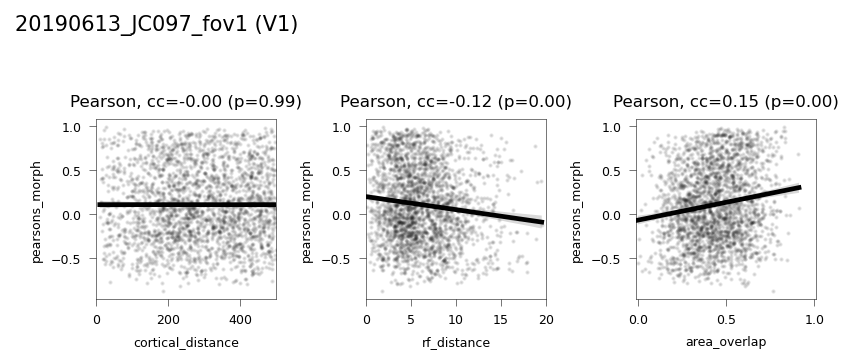

In [587]:
metric='pearsons'
y_var = '%s_morph' % metric
dist_vars=['cortical_distance', 'rf_distance', 'area_overlap']
plotd=pw_df[pw_df.cortical_distance<500].copy().dropna()
scatter_kws={'s':1, 'alpha': 0.1}
# -------------------
fig, axn = pl.subplots(1, 3, figsize=(6,3), dpi=150)
for ax, dist_var in zip(axn.flat, dist_vars):

    sns.regplot(x=dist_var, y=y_var, data=plotd, ax=ax, 
                scatter_kws=scatter_kws, color='k')
    r, p = spstats.pearsonr(plotd[dist_var], plotd[y_var])
    ax.set_title('Pearson, cc=%.2f (p=%.2f)' % (r, p))
    ax.set_box_aspect(1)
    if dist_var=='area_overlap':
        ax.set_xlim([-0.01, 1.01])
    elif dist_var =='rf_distance':
        ax.set_xlim([0, 20])
    else:
        ax.set_xlim([0, 500])
# sns.regplot(x=x_var, y=y_var, data=plotd, ax=ax, scatter_kws=scatter_kws)
# r, p = spstats.pearsonr(plotd[x_var], plotd[y_var])
# ax.set_title('Pearson, cc=%.2f (p=%.2f)' % (r, p))
pl.subplots_adjust(left=0.1, right=0.9, wspace=0.5)
fig.text(0.01, 0.9, '%s (%s)' % (dk, va))

In [588]:
import copy

In [589]:
curr_ctx_maxdist=500
equal_bins=True
n_bins=10
# Split distances into X um bins
df, dist_lut = cr.get_bins_and_cut(DISTS[DISTS.cortical_distance<=curr_ctx_maxdist], 
                                   ctx_step=25, overlap_step=0.1)

Text(0.05, 0.9, '20190613_JC097_fov1 (V1)')

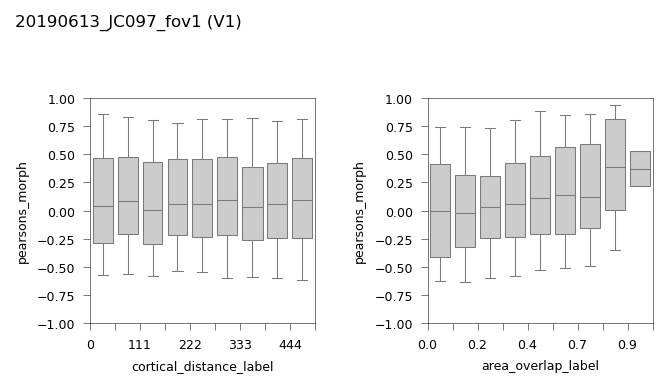

In [590]:
%matplotlib inline
scatter_kws={'s':0.5}
metric = 'pearsons'
y_var = '%s_morph' % metric
dist_vars = ['cortical_distance', 'area_overlap']

r_list=[]
fig, axn = pl.subplots(1, 2, figsize=(5,3), dpi=150)
fig.patch.set_alpha(1)
for ax, dist_var in zip(axn.flat, dist_vars):
    x_bins = [k for k in dist_lut[dist_var]['bins'] if k<=curr_ctx_maxdist]
    curr_maxdist = max(x_bins)
    if dist_var=='cortical_distance':
        df_ = df[df.cortical_distance<=curr_ctx_maxdist].copy()
    else:
        df_ = df.copy()
        
    x_var = '%s_label' % dist_var
    sns.boxplot( x=x_var, y=y_var, ax=ax, data=df_, whis=(5, 95),
                fliersize=0, linewidth=0.5, width=0.8, color=[0.8]*3)
#     sns.stripplot( x=x_var, y='pearsons_morph', ax=ax,
#                 data=df_, s=1, palette='viridis')
#     sns.pointplot( x=x_var, y='pearsons_morph', ax=ax,
#                 data=df_, scale=1, markers='_', join=False, color='k',
#                  errwidth=0.5)
    ax.set_ylim([-1, 1])
    xticks =np.arange(0, len(x_bins))-0.5
    ax.set_xticks(xticks)
    if dist_var=='area_overlap':
        ax.set_xticklabels([round(i, 1) if i in x_bins[0::2] else '' for i in x_bins])
    else:
        ax.set_xticklabels([int(i) if i in x_bins[0::2] else '' for i in x_bins])        
    ax.set_xlim([-0.5, xticks[-1]])
for ax in axn.flat:
    ax.set_box_aspect(1)
pl.subplots_adjust(left=0.15, right=0.9, bottom=0.1, wspace=0.5)

fig.text(0.05, 0.9, '%s (%s)' % (dk, va), fontsize=8)

In [697]:
# cfg = 'config040'
# fig, ax = pl.subplots()
# sns.lineplot(x='tsec', y='smoothed', 
#              data=roidf[(roidf.config==cfg) & (roidf.trial_ix<=5)], ax=ax,
#             hue='trial_ix', palette='colorblind')

# roidf[roidf.config==cfg][['trial', 'trial_ix']].drop_duplicates()

In [653]:
# all_trials = sorted(labels['trial'].unique(), key=hutils.natural_keys)
# # trial = all_trials[trialmetrics[rid].argmax()]
# trial = 'trial00276'

In [661]:
# cfg = 'config040'
# tmat = labels[(labels.trial==trial) & (labels.config==cfg)].copy()

# raw_ = raw_traces.iloc[tmat.index]
# bas_mean = raw_.iloc[0:stim_on_frame].mean(axis=0)
# stim_mean = raw_.iloc[metric_ixs].mean(axis=0)
# bas_std = raw_.iloc[0:stim_on_frame].std(axis=0)

# stim_on_frame = int(labels['stim_on_frame'].unique())
# nframes_on = int(labels['nframes_on'].unique())

# metric_ixs = np.arange(stim_on_frame, stim_on_frame+nframes_on).astype(int)


In [662]:
# bas_mean[rid], stim_mean[rid], bas_std[rid]

(399.17249542147295, 708.5399077085167, 248.4186895793757)

In [664]:
# curr_traces = pd.DataFrame(raw_).subtract(bas_mean)\
#                     .divide(bas_mean, axis='columns')
# curr_traces_z = pd.DataFrame(raw_).subtract(bas_mean)\
#                     .divide(bas_std, axis='columns')



In [ ]:
# maxc = curr_traces.max()

In [671]:
# maxc = curr_traces.max()
# maxc[maxc>3].index.tolist()


[11, 19, 41, 44, 53, 57, 64, 67, 76, 117, 118, 121, 176, 199, 203]

## Select fav rois

In [700]:
# plot_rois = [1, 19, 94] # 20190613_JC097_fov1
#plot_pairs = ['%i_%i' % tuple(plot_rois)]
#plot_pairs

In [365]:
importlib.reload(traceutils)

<module 'analyze2p.extraction.traces' from '/net/coxfs01/srv/export/coxfs01/share_root/2p-pipeline/repos/rat-2p-area-characterizations/analyze2p/extraction/traces.py'>

In [701]:
check_rois = sorted(plot_rois) # 20190613_JC097_fov1  [1, 19, 94]
# check_rois = sorted([87, 357, 37]) # 20190622_JC085_fov1?
#check_rois=sorted([381, 90, 65, 383, 388]) # 20190617JC097?
check_pairs = list(itertools.combinations(check_rois, 2))
check_pairs

[(1, 19), (1, 94), (19, 94)]

<IPython.core.display.Javascript object>


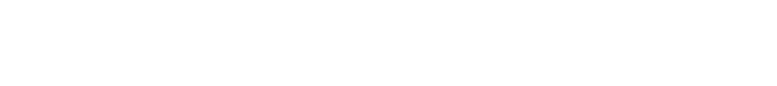

<IPython.core.display.Javascript object>


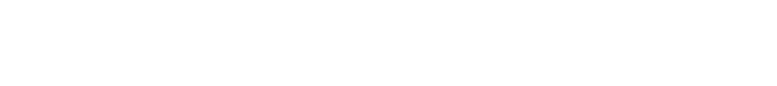

<IPython.core.display.Javascript object>


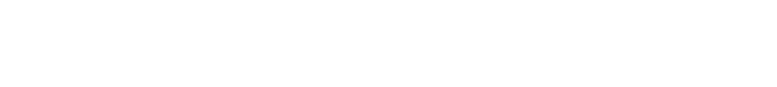

In [702]:
%matplotlib notebook
for cpair in check_pairs:
    r1, r2 = cpair
    rid_colors={r1: 'r', r2: 'b'}
    cc, dist = pw_df[pw_df['neuron_pair']=='%s_%i' % (r1, r2)]\
                [['pearsons_morph', 'cortical_distance']].values[0]
    t_=[]
    means_={}
    for rid in cpair:
        best_sz = int(morph_curves[morph_curves['cell']==rid]['best_size'].unique())
        cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(morphlevels)]\
                    .index.tolist()
        tdf = traceutils.get_mean_and_std_traces(rid, processed, labels, 
                        cfgs_, sdf[sdf.morphlevel.isin(morphlevels)], 
                        param='morphlevel', 
                        return_stacked=True, smooth=True, win_size=9)
        tdf['has_rfs'] = ~np.isnan(posdf_.loc[rid]['x0'])
        tdf['cell']=rid
        t_.append(tdf)
        meanr = trialmetrics[trialmetrics.config.isin(cfgs_)][[rid, 'config']]\
                        .groupby('config').mean()
        means_[rid] = meanr
    tdf = pd.concat(t_, axis=0).reset_index(drop=True)
    
    fg = sns.FacetGrid(data=tdf, col='morphlevel', col_order=morphlevels, 
                   height=2, aspect=1, hue='cell', palette=rid_colors)
    fg.map(pl.plot, 'time', 'mean', lw=1)
    fg.fig.patch.set_alpha(1)
    pl.subplots_adjust(left=0.1, right=0.7, bottom=0.3, top=0.8)
    label = '%s\ncc=%.2f,\nD=%.2f' % (str(cpair), cc, dist)
    fg.fig.text(0.02, 0.5, label, fontsize=18)
    #fg.fig.axes[0].set_ylabel(str(cpair), fontsize=18, rotation=0)

In [804]:
dk

'20190613_JC097_fov1'

<IPython.core.display.Javascript object>


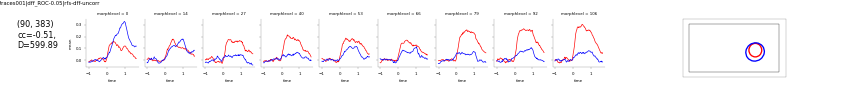

/n/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning/examples compare_rid90_383__V1_20190616_JC097_fov1


In [773]:
# r1=90
# r2=383
# cpair = (r1, r2)

for cpair in check_pairs:
    r1, r2 = cpair
    rid_colors={r1: 'r', r2: 'b'}
    cc, dist = pw_df[pw_df['neuron_pair']=='%s_%i' % (r1, r2)]\
                [['pearsons_morph', 'cortical_distance']].values[0]
#     t_=[]
#     means_={}
#     for rid in cpair:
#         best_sz = int(morph_curves[morph_curves['cell']==rid]['best_size'].unique())
#         cfgs_ = sdf[(sdf['size']==best_sz) & sdf['morphlevel'].isin(morphlevels)]\
#                     .index.tolist()
#         tdf = traceutils.get_mean_and_std_traces(rid, processed, labels, 
#                         cfgs_, sdf[sdf.morphlevel.isin(morphlevels)], 
#                         param='morphlevel', 
#                         return_stacked=True, smooth=True, win_size=9)
#         tdf['has_rfs'] = ~np.isnan(posdf_.loc[rid]['x0'])
#         tdf['cell']=rid
#         t_.append(tdf)
#         meanr = trialmetrics[trialmetrics.config.isin(cfgs_)][[rid, 'config']]\
#                         .groupby('config').mean()
#         means_[rid] = meanr
#     tdf = pd.concat(t_, axis=0).reset_index(drop=True)
    tdf = trace_ex[trace_ex['cell'].isin([r1,r2])].copy()
    fg = sns.FacetGrid(data=tdf, col='morphlevel', col_order=morphlevels, 
                   height=2, aspect=1, hue='cell', palette=rid_colors)
    fg.map(pl.plot, 'time', 'mean', lw=1)
    fg.fig.patch.set_alpha(1)
    pl.subplots_adjust(left=0.1, right=0.7, bottom=0.3, top=0.8)

    # RFs
    ax = fg.fig.add_axes([0.55, 0.2, 0.6, 0.6], polar=False)
    pair_rfs = rfs[rfs.cell.isin(cpair)]
    # plot_ori_hues = [ori_colordict[float(fits.loc[rid]['tested_theta'])] \
    #                  for rid in cpair]
    ax = rfutils.plot_rfs_to_screen_pretty(pair_rfs, sdf_rf, screen, 
                                   fit_roi_list=cpair, ax=ax, 
                                   roi_colors=[rid_colors[r] for r in cpair], 
                                   ellipse_lw=2)

    fg.fig.patch.set_alpha(1)
    pl.subplots_adjust(left=0.1, right=0.7, bottom=0.3, top=0.8)
    label = '%s\ncc=%.2f,\nD=%.2f' % (str(cpair), cc, dist)
    fg.fig.text(0.02, 0.5, label, fontsize=12)

    pplot.label_figure(fg.fig, data_id)
    figname = 'compare_rid%i_%i__%s_%s' % (r1, r2, va, dk)
    pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
    print(examples_dir, figname)

## Compare w stim overlap

In [704]:
images = su.load_stimuli()   
xp, yp = aggr.get_stimulus_coordinates(dk, 'blobs')


sz: (10.0, 50.0)
mp: (0, 106)


<IPython.core.display.Javascript object>


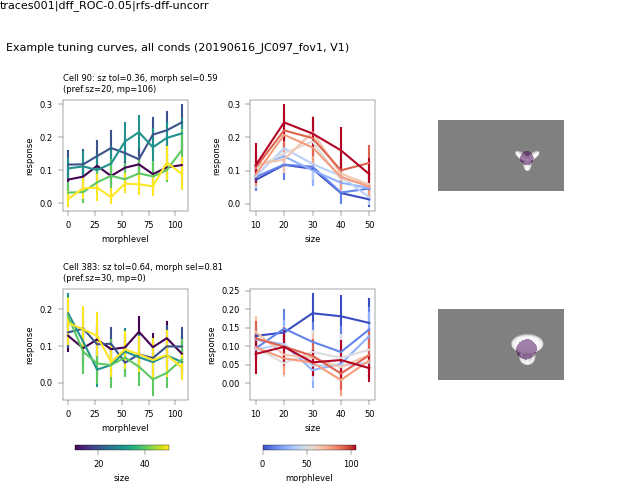

/n/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning/examples allconds_w_rfs_rid90_383__V1_20190616_JC097_fov1


In [774]:
size_lims = (min(sizes), max(sizes))
morph_lims = (min(morphlevels), max(morphlevels))
size_cmap= 'viridis'
morph_cmap = 'coolwarm'

print("sz: %s" % str(size_lims))
print("mp: %s" % str(morph_lims))

fig, axn = pl.subplots(2,len(plot_rois), figsize=(6.25, 5), dpi=150, sharey=False)
fig.patch.set_alpha(1)
for ai, rid in enumerate(cpair):
    roi_resp = x0[(x0.cell==rid)].copy()
    #for 
    best_sz = best_ixs.loc[rid]['best_size']
    best_mp = best_ixs.loc[rid]['best_morphlevel']
    # plot
    ax=axn[ai, 0]
    sns.lineplot(x='morphlevel', y='response', ax=ax,
                 data=roi_resp, err_style='bars', hue='size', palette=size_cmap)
    sel_v, tol_v = best_ixs.loc[rid][['morph_sel', 'size_tol']].values
    
    ax.set_title('Cell %i: sz tol=%.2f, morph sel=%.2f\n(pref.sz=%i, mp=%i)' \
                 % (rid, sel_v, tol_v, best_sz, best_mp), 
                 loc='left', fontsize=6)
    ax=axn[ai, 1]
    sns.lineplot(x='size', y='response',  ax=ax,
                data=roi_resp, err_style='bars', hue='morphlevel', palette=morph_cmap)

    rf_screen = su.rf_to_screen(rid, rfs[rfs['cell']==rid])
    rf_mask = rf_screen.astype(float).copy()
    rf_mask[rf_screen==0] = np.nan
    # Select stimulus and size
    ax=axn[ai, 2]
    mp= best_mp
    sz = best_sz
    stim = images['M%i' % mp].copy()
    stim_screen = su.draw_stimulus_to_screen(stim, size_deg=sz, stim_pos=(xp, yp))
    stim_mask = stim_screen.copy()
    stim_mask[stim_screen==0] = 0.3
    # plot
    ax.imshow(stim_mask, alpha=0.5, cmap='gray')
    ax.imshow(rf_mask, alpha=0.5)
    ax.invert_yaxis()
    ax.axis('off')

fig.subplots_adjust(bottom=0.2)

for hi, hue_var in enumerate(['size', 'morphlevel']):
    cbar_ax = fig.add_axes([0.12+(hi*0.3), 0.1, 0.15, 0.01])
    ax=axn[1, hi]
    cmap = size_cmap if hue_var=='size' else morph_cmap
    hue_min, hue_max = size_lims if hue_var=='size' else morph_lims
    ax.legend_.remove()
    hue_norm = pl.Normalize(hue_min, hue_max)
    sm = pl.cm.ScalarMappable(cmap=cmap, norm=hue_norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, cax=cbar_ax, 
                 orientation='horizontal', shrink=0.5, label=hue_var)
    axn[0, hi].legend_.remove()
pl.subplots_adjust(left=0.1, right=0.9, wspace=0.5, hspace=0.7, top=0.8)
fig.text(0.01, 0.9, 'Example tuning curves, all conds (%s, %s)' \
         % (dk, va), fontsize=8)

pplot.label_figure(fig, data_id)
figname = 'allconds_w_rfs_rid%i_%i__%s_%s' % (r1, r2, va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
print(examples_dir, figname)

In [776]:
print(cpair)
best_ixs.loc[np.array(cpair)][['morph_sel', 'size_tol']]

(90, 383)


,morph_sel,size_tol
cell,,
90,0.357264,0.589258
383,0.643632,0.805507


In [777]:
stim_screen.min()

0.0

In [778]:
(sel_v, tol_v) = best_ixs.loc[np.array(cpair)][['morph_sel', 'size_tol']].values
print(sel_v, tol_v)

[0.35726391 0.58925821] [0.64363166 0.8055071 ]


In [811]:
best_ixs.loc[90]

KeyError: 90

In [806]:
# plot_rois=[65, 90, 383]
plot_pairs = list(itertools.combinations(plot_rois, 2))

plot_pair_labels = ['%i_%i' % (r1, r2) for (r1, r2) in plot_pairs]
plot_pair_labels

['65_90', '65_383', '90_383']

<IPython.core.display.Javascript object>


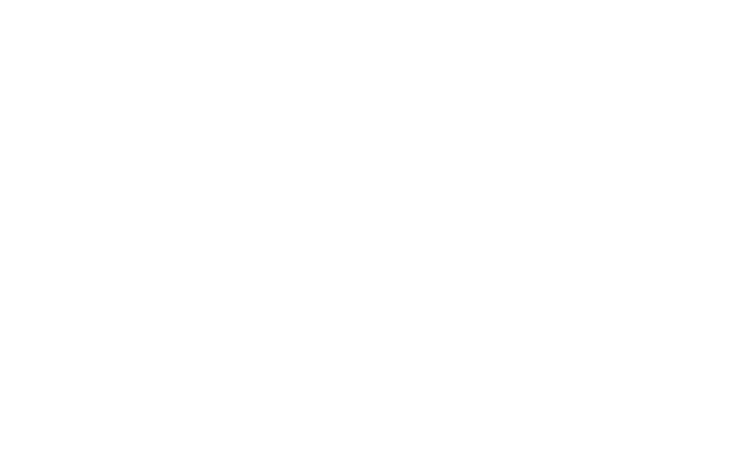

KeyError: 90

In [809]:
fig, axn = pl.subplots(2,len(plot_rois), figsize=(6.5, 4), dpi=150, sharey=False)
fig.patch.set_alpha(1)
for ai, rid in enumerate(plot_rois):
    roi_resp = x0[(x0.cell==rid)].copy()
    best_sz = best_ixs.loc[rid]['best_size']
    best_mp = best_ixs.loc[rid]['best_morphlevel']
    # plot
    ax=axn[0, ai]
    sns.lineplot(x='morphlevel', y='response', ax=ax,
                 data=roi_resp[roi_resp['size']==best_sz], err_style='bars')
    ax.set_title('Cell %i\n(pref.sz=%i, mp=%i)' % (rid, best_sz, best_mp), 
                 loc='left', fontsize=6)
    ax=axn[1, ai]
    sns.lineplot(x='size', y='response',  ax=ax,
                data=roi_resp[roi_resp['morphlevel']==best_mp], err_style='bars')
for ax in axn.flat:
    ax.set_ylim([-0.05, 0.3])
    ax.set_yticks(np.linspace(0, 0.3, 4))
    ax.set_box_aspect(1)
sns.despine(trim=True, offset=4)
fig.text(0.01, 0.9, 'Example tuning curves (%s, %s)' % (dk, va), fontsize=8)
pl.subplots_adjust(left=0.1, right=0.9,bottom=0.2, wspace=0.5, top=0.8, hspace=0.5)

pplot.label_figure(fig, data_id)
figname = 'tuning_curves_examples__%s_%s' % (va, dk)
pl.savefig(os.path.join(examples_dir, '%s.svg' % figname))
print(examples_dir, figname)

In [802]:
pw_df[pw_df['neuron_pair'].isin(plot_pair_labels)]

NameError: name 'plot_pair_labels' is not defined

In [797]:

ctx_maxdist = 1000
ctx_step = 50
ctx_bins = np.arange(0, ctx_maxdist+ctx_step, ctx_step)

plotd = pw_df[pw_df.cortical_distance<=ctx_maxdist].copy().dropna()
plotd = cr.cut_bins(plotd, ctx_bins, 'cortical_distance')

perc_max=1
perc_step=0.05
perc_bins = np.arange(0, perc_max+perc_step, perc_step)
plotd = cr.cut_bins(plotd, perc_bins, 'area_overlap')

rf_maxdist = 60
rf_step = 2.5
rf_bins = np.arange(0, rf_maxdist+rf_step, rf_step)
plotd = cr.cut_bins(plotd, rf_bins, 'rf_distance')



<IPython.core.display.Javascript object>


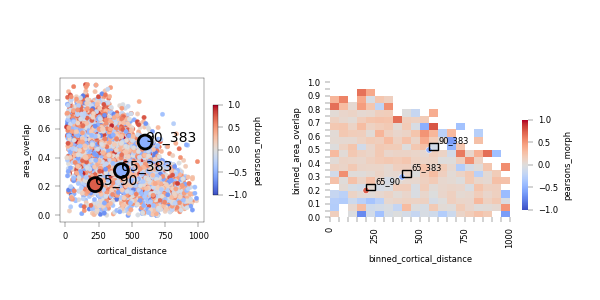

In [888]:
%matplotlib notebook
markersize = 10

plot_pairs =plot_pairs
x_var = 'cortical_distance'
y_var = 'area_overlap'

x_var_name = 'binned_%s' % x_var
y_var_name = 'binned_%s' % y_var
x_vals = [k for k, v in plotd.groupby(x_var_name)]
y_vals = [k for k, v in plotd.groupby(y_var_name)]

plotd['%s_index' % x_var_name] = [x_vals.index(i) for i \
                                    in plotd[x_var_name]]
plotd['%s_index' % y_var_name] = [y_vals.index(i) for i \
                                    in plotd[y_var_name]]

x_bins = ctx_bins.copy()
y_bins = perc_bins.copy()

hue_var = 'pearsons_morph'
hue_min, hue_max = (-1, 1)
cmap='coolwarm'
#
fig, axn = pl.subplots(1,2, figsize=(6,3), dpi=150)
fig.patch.set_alpha(1)
ax=axn[0]
sns.scatterplot(x=x_var, y=y_var, data=plotd, ax=ax,
                hue=hue_var, hue_norm=(hue_min, hue_max), palette=cmap, 
                edgecolor=None, s=markersize)
sns.scatterplot(x=x_var, y=y_var, 
                data=plotd[plotd['neuron_pair'].isin(plot_pair_labels)], ax=ax,
                hue=hue_var, hue_norm=(hue_min, hue_max), palette=cmap,
                edgecolor='k', linewidth=2,  s=100)
for currpair in plot_pair_labels:
    if currpair not in plotd.neuron_pair.values:
        print("   missing %s" %currpair)
        continue
    x=float(plotd[(plotd.neuron_pair==currpair)][x_var])
    y=float(plotd[(plotd.neuron_pair==currpair)][y_var])
    ax.text(x, y, currpair)
ax.legend_.remove()
norm = pl.Normalize(hue_min, hue_max)
sm = pl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.5, label=hue_var)
ax.set_box_aspect(1)

# binned
ax=axn[1]
cbar_ax = fig.add_axes([0.87, 0.3, 0.01, 0.3])
means_ = plotd.groupby([y_var_name, x_var_name])\
           .mean().reset_index()
hmat = means_.pivot(y_var_name, x_var_name, hue_var)
sns.heatmap(hmat, cmap='coolwarm', ax=ax, vmin=hue_min, vmax=hue_max,
            cbar=1, cbar_ax=cbar_ax, cbar_kws={'label': hue_var}) 
#, center=0)
ax.set_box_aspect(0.75)
ax.set_yticks(np.arange(0, len(y_bins)))
ax.set_yticklabels([round(i, 2) if i in y_bins[0::2] else '' for i in y_bins])
ax.set_xticks(np.arange(0, len(x_bins)))
ax.set_xticklabels([int(i) if i in x_bins[0::5] else '' for i in x_bins])

sns.scatterplot(x='%s_index' % x_var_name, y='%s_index' % y_var_name, 
               hue=hue_var, ax=ax,
               data=plotd[plotd.neuron_pair.isin(plot_pair_labels)],
               s=20, palette=cmap, hue_norm=(hue_min, hue_max))
ax.invert_yaxis()
ax.legend_.remove()

for currpair in plot_pair_labels:
    row_v = float(plotd[plotd.neuron_pair==currpair][y_var_name])
    col_v =  float(plotd[plotd.neuron_pair==currpair][x_var_name])
    xv_, yv_, = x_vals.index(col_v), y_vals.index(row_v)
    hv_ = float(plotd[plotd.neuron_pair==currpair][y_var])
    ax.add_patch(mpl.patches.Rectangle((xv_, yv_), 1, 1, 
                                       fill=False, edgecolor='k', lw=1))

#     sns.scatterplot(x=x_var_name, y=y_var_name, hue=hue_var, 
#                    data=plotd[plotd.neuron_pair.isin(plot_pair_labels)], ax=ax,
#                    size=20)
#     sns.scatterplot(x=[xv_+0.5], y=[yv_+0.5], 'o', mec='k', mfc=None,
#            color=hv_, )
    ax.text(xv_+1, yv_+1, currpair, size=6)

pl.subplots_adjust(left=0.1, right=0.85, bottom=0.2, top=0.8, wspace=0.5)


In [835]:
#currpair = plot_pair_labels[0]
row_v = float(plotd[plotd.neuron_pair==currpair]['binned_%s' % y_var])
col_v =  float(plotd[plotd.neuron_pair==currpair]['binned_%s' % x_var])

xv_, yv_, = x_vals.index(col_v), y_vals.index(row_v)

print(col_v, row_v)
plotd[plotd.neuron_pair==currpair]

550.0 0.5


,xcorr_morph,pearsons_morph,cosim_morph,cell_1,cell_2,neuron_pair,xcorr_size,pearsons_size,cosim_size,max_response,...,rf_angle_diff_abs,std_x,std_y,aspect_ratio,binned_cortical_distance,cortical_distance_label,binned_area_overlap,area_overlap_label,binned_rf_distance,rf_distance_label
6255,2.439347,-0.505153,0.790064,90,383,90_383,2.982007,0.991866,0.981519,0.056297,...,52.460369,2.520315,2.677169,0.337169,550,550.0,0.5,0.5,0.0,0.0


In [943]:
ctx_maxdist = 1000
ctx_step = 50
ctx_bins = np.arange(0, ctx_maxdist+ctx_step, ctx_step)

plotd = pw_df[pw_df.cortical_distance<=ctx_maxdist].copy().dropna()
plotd = cr.cut_bins(plotd, ctx_bins, 'cortical_distance')

perc_max=1
perc_step=0.05
perc_bins = np.arange(0, perc_max+perc_step, perc_step)
plotd = cr.cut_bins(plotd, perc_bins, 'area_overlap')

rf_maxdist = 60
rf_step = 2
rf_bins = np.arange(0, rf_maxdist+rf_step, rf_step)
plotd = cr.cut_bins(plotd, rf_bins, 'rf_distance')


-0.7094145887823786 0.7833221809841509


<IPython.core.display.Javascript object>


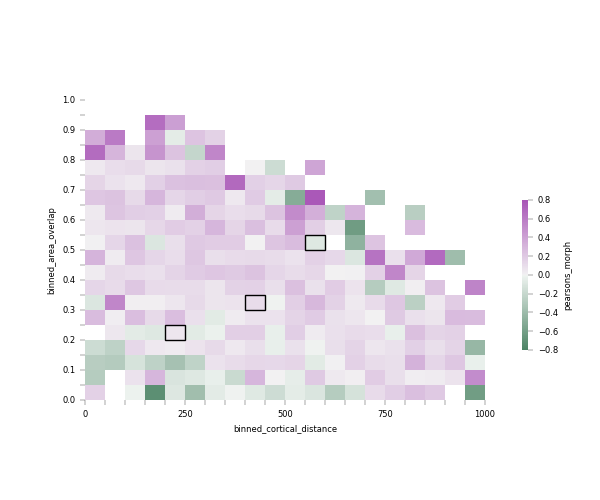

In [993]:
%matplotlib notebook
x_var = 'cortical_distance'
y_var = 'area_overlap'
hue_var = 'pearsons_morph'
hue_min, hue_max = (-.8, 0.8)
cmap=sns.diverging_palette(145, 300, s=60, as_cmap=True)
#'coolwarm'

# x_var_name = 'binned_%s' % x_var
# y_var_name = 'binned_%s' % y_var
x_var_name = '%s_label' % x_var
y_var_name = '%s_label' % y_var
x_vals = [k for k, v in plotd.groupby(x_var_name)]
y_vals = [k for k, v in plotd.groupby(y_var_name)]
plotd['%s_index' % x_var_name] = [x_vals.index(i) for i \
                                    in plotd[x_var_name]]
plotd['%s_index' % y_var_name] = [y_vals.index(i) for i \
                                    in plotd[y_var_name]]

grouped_hue_min = plotd.groupby([x_var_name, y_var_name])[hue_var].mean().min()
grouped_hue_max = plotd.groupby([x_var_name, y_var_name])[hue_var].mean().max()
print(grouped_hue_min, grouped_hue_max)
x_bins = ctx_bins.copy()
y_bins = perc_bins.copy()
#
fig, ax = pl.subplots(figsize=(6, 5), dpi=150)
fig.patch.set_alpha(1)
cbar_ax = fig.add_axes([0.87, 0.3, 0.01, 0.3])
means_ = plotd.groupby(['binned_%s' % y_var, 'binned_%s' % x_var])\
           .mean().reset_index()
hmat = means_.pivot('binned_%s' % y_var, 'binned_%s' % x_var, hue_var)
sns.heatmap(hmat, cmap=cmap, ax=ax, vmin=hue_min, vmax=hue_max,
            cbar=1, cbar_ax=cbar_ax, cbar_kws={'label': hue_var}) 
ax.set_box_aspect(0.75)
#, center=0)
ax.set_box_aspect(0.75)
ax.set_yticks(np.arange(0, len(y_bins)))
ax.set_yticklabels([round(i, 2) if i in y_bins[0::2] else '' for i in y_bins])
ax.set_xticks(np.arange(0, len(x_bins)))
ax.set_xticklabels([int(i) if i in x_bins[0::5] else '' for i in x_bins])
ax.invert_yaxis()
# 
for currpair in plot_pair_labels:
    row_v = float(plotd[plotd.neuron_pair==currpair][y_var_name])
    col_v =  float(plotd[plotd.neuron_pair==currpair][x_var_name])
    xv_, yv_, = x_vals.index(col_v), y_vals.index(row_v)
    hv_ = float(plotd[plotd.neuron_pair==currpair][y_var])
    ax.add_patch(mpl.patches.Rectangle((xv_, yv_), 1, 1, 
                                       fill=False, edgecolor='k', lw=1))
    
pl.subplots_adjust(left=0.1, right=0.85, bottom=0.2, top=0.8, wspace=0.5)


In [738]:

ctx_maxdist = 500
ctx_step = 25
ctx_bins = np.arange(0, ctx_maxdist+ctx_step, ctx_step)

plotd = pw_df[pw_df.cortical_distance<=ctx_maxdist].copy() #.dropna()
plotd = cr.cut_bins(plotd, ctx_bins, 'cortical_distance')

perc_max=1
perc_step=0.1
perc_bins = np.arange(0, perc_max+perc_step, perc_step)
plotd = cr.cut_bins(plotd, perc_bins, 'area_overlap')

rf_maxdist = 60
rf_step = 2.5
rf_bins = np.arange(0, rf_maxdist+rf_step, rf_step)
plotd = cr.cut_bins(plotd, rf_bins, 'rf_distance')



<IPython.core.display.Javascript object>


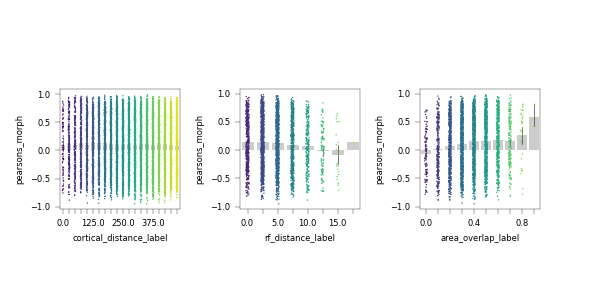

In [739]:
dist_params = ['cortical_distance', 'rf_distance', 'area_overlap']
    
fig, axn = pl.subplots(1, len(dist_params), figsize=(6,3), dpi=150)
fig.patch.set_alpha(1)
# sns.scatterplot(x='area_overlap', y='pearsons_morph', data=plotd, ax=ax)
# sns.barplot(x='area_overlap_label', y='pearsons_morph', data=plotd, ax=ax)
# sns.stripplot(x='area_overlap_label', y='pearsons_morph', data=plotd, ax=ax,
#              size=5)
for ax, x_v in zip(axn.flat, dist_params):
#     sns.boxplot(x='%s_label' % x_v, y='pearsons_morph', data=plotd, ax=ax, 
#            whis=(5, 95), fliersize=0)
    sns.barplot(x='%s_label' % x_v, y='pearsons_morph', data=plotd, ax=ax,
               ci=95, errwidth=0.5, color=[0.8]*3)
    sns.stripplot(x='%s_label' % x_v, y='pearsons_morph', data=plotd, ax=ax,s=1,
                 palette='viridis')
    ax.set_box_aspect(1)
    x_vals = [k for k, v in plotd.groupby(['%s_label' % x_v])]
    
    #x_vals = sorted([round(i, 1) for i in plotd['%s_label' % x_v].unique()])
    ax.set_xticks(np.arange(0, len(x_vals)))
    round_to = 2 if x_v =='area_overlap' else 0
    if x_v == 'cortical_distance':
        skip_x = 5
    else:
        skip_x = 2 if x_v=='rf_distance' else 4
    ax.set_xticklabels([round(i,round_to) if i in x_vals[0::skip_x] \
                        else '' for i in x_vals])
pl.subplots_adjust(left=0.1, right=0.9, wspace=0.5)

In [742]:

ctx_maxdist = 500
ctx_step = 25
ctx_bins = np.arange(0, ctx_maxdist+ctx_step, ctx_step)

plotd = pw_df[pw_df.cortical_distance<=ctx_maxdist].copy().dropna()
plotd = cr.cut_bins(plotd, ctx_bins, 'cortical_distance')

perc_max=1
perc_step=0.1
perc_bins = np.arange(0, perc_max+perc_step, perc_step)
plotd = cr.cut_bins(plotd, perc_bins, 'area_overlap')

rf_maxdist = 60
rf_step = 2.5
rf_bins = np.arange(0, rf_maxdist+rf_step, rf_step)
plotd = cr.cut_bins(plotd, rf_bins, 'rf_distance')


In [745]:
plotd.dtypes

xcorr_morph                  float64
pearsons_morph               float64
cosim_morph                  float64
cell_1                         int64
cell_2                         int64
neuron_pair                   object
xcorr_size                   float64
pearsons_size                float64
cosim_size                   float64
max_response                 float64
rf_distance                  float64
max_ecc                      float64
min_ecc                      float64
cortical_distance            float64
area_overlap                 float64
perc_overlap                 float64
rf_angle_diff                float64
rf_angle_diff_abs            float64
std_x                        float64
std_y                        float64
aspect_ratio                 float64
binned_cortical_distance    category
cortical_distance_label      float64
binned_area_overlap         category
area_overlap_label           float64
binned_rf_distance          category
rf_distance_label            float64
d

<IPython.core.display.Javascript object>


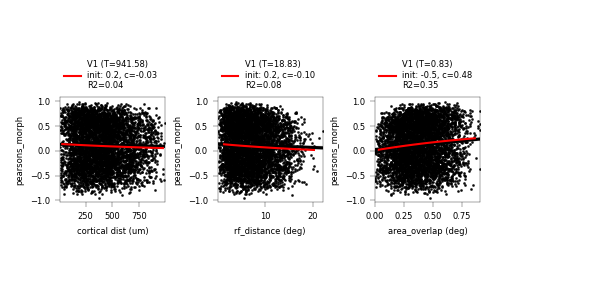

In [994]:
%matplotlib notebook
metric='pearsons_morph'
params = ['cortical_distance', 'rf_distance', 'area_overlap']
fit_sites = False
use_binned=True
min_npairs = 3
n_iter=int(np.random.rand(1)[0]*500)


fig, axn = pl.subplots(1, len(params), figsize=(6,3), dpi=150)
fig.patch.set_alpha(1)

for ax, to_quartile in zip(axn.flat, params):
    xlabel='cortical dist (um)' if to_quartile=='cortical_distance' else '%s (deg)' % to_quartile

    if fit_sites:
        cnt_grouper.append('datakey')
    x_var = '%s_label' % to_quartile
    cnt_grouper = [x_var] 

    cnts = plotd.groupby(cnt_grouper)['neuron_pair'].count()  
    # How many resample per group
    nsamples_per = dict((k, v) for k, v \
                        in zip(cnts[cnts>min_npairs].index.tolist(),
                               cnts[cnts>min_npairs].values))
    # Sample
    cc_ = pd.concat([cg.sample(nsamples_per[c], random_state=n_iter, replace=True) \
                         for c, cg in plotd.groupby(cnt_grouper) \
                         if c in nsamples_per.keys()])
    # fov mean for visualizing
    if fit_sites:
        fit_cc = cc_.groupby(cnt_grouper).median().reset_index().dropna()
    else:
        fit_cc = cc_.copy()

    # plot
    meas_cc = plotd.groupby(cnt_grouper).median().reset_index().dropna()
    #ax.scatter(x=to_quartile, y=metric, data=plotd, s=2, color='k')
    sns.regplot(x=to_quartile, y=metric, data=plotd, color='k',
               scatter_kws={'s':1}, ax=ax)
    res_, xvals, yvals = cr.fit_decay_on_binned(fit_cc, use_binned=use_binned,
                                            normalize_x=True, func='halflife',
                                            estimator='median',
                                            metric=metric,
                                            to_quartile=to_quartile,
                                            return_inputs=True)
    if all(res_.isnull()):
        print("BINNED, no fit: %s" % va)
        label='no fit'
    else:
        fit_y = cr.func_halflife(xvals, res_.init, res_.tau, res_.constant)
        label = '%s (T=%.2f)\ninit: %.1f, c=%.2f\nR2=%.2f' \
                        % (va, res_.tau, res_.init, res_.constant, res_.R2)
        ax.plot(xvals, fit_y, color='r', label=label)
    ax.set_ylabel(metric)
    ax.set_xlabel(xlabel)
    ax.legend(bbox_to_anchor=(1,1), loc='lower right', frameon=False, ncol=1)
    ax.set_box_aspect(1)
    #ax.set_xlim([0, 250])
#ax.set_ylim([0, 0.7])
pl.subplots_adjust(bottom=0.3, left=0.1, right=0.8, top=0.7, wspace=0.5)

In [971]:
curr_dst_dir

'/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/signal_correlations/ROC_rfs-dff-uncorr/examples'

In [465]:
currpair

'37_383'

In [731]:
plotd[plotd['neuron_pair'].isin(plot_pairs)]

,xcorr_morph,pearsons_morph,cosim_morph,cell_1,cell_2,neuron_pair,xcorr_size,pearsons_size,cosim_size,max_response,...,rf_angle_diff_abs,std_x,std_y,aspect_ratio,binned_cortical_distance,cortical_distance_label,binned_area_overlap,area_overlap_label,binned_rf_distance,rf_distance_label


# Aggregate

In [528]:
response_type='dff'
do_spherical_correction=False
# ------------------------------------
rf_fit_desc = rfutils.get_fit_desc(response_type=response_type,
                                  do_spherical_correction=do_spherical_correction)
rfdf = rfutils.aggregate_fits(cells0, sdata, combine='average', 
                              response_type=response_type,
                              do_spherical_correction=do_spherical_correction,
                              reliable_only=True,
                              pass_criterion='position')
rfdf = aggr.add_roi_positions(rfdf)

N dpaths: 56, N unfit: 0
N datasets included: 61, N sessions excluded: 4


In [122]:
print(rf_fit_desc)
try:
    rfpolys, _ = su.load_rfpolys(rf_fit_desc)
except FileNotFoundError as e:
    rfpolys, check_rfs = su.update_rfpolys(rfdf, rf_fit_desc, create_new=True)

NameError: name 'rf_fit_desc' is not defined

In [492]:
# va='V1'
# dk='20190616_JC097_fov1'
offset_type='minsub' 
lcorrection='exclude'
with_lum = False

rdf_list=[]
for (va, dk), x0 in NDATA.groupby(['visual_area', 'datakey']):

    sdf = aggr.get_stimuli(dk, experiment, match_names=True)
    if with_lum:
        configs = sdf.index.tolist()
    else:
        configs = sdf[sdf['morphlevel']!=-1].index.tolist()
    sizes = list(sorted(sdf['size'].unique()))
    morphlevels = list(sorted(sdf.loc[configs]['morphlevel'].unique()))
    # print(morphlevels)

    x0 = NDATA0[(NDATA0.visual_area==va) & (NDATA0.datakey==dk) 
              & (NDATA0.config.isin(configs))].copy()
    rdf0 = x0.groupby(['visual_area', 'datakey', 'cell', 'config'])\
             .mean().reset_index().drop('trial', axis=1)
    rdf_offset = sel.correct_offset(rdf0, offset=offset_type)
    rdf = sel.correct_luminance(rdf_offset, sdf, lcorrection=lcorrection)
    rdf['size'] = sdf.loc[rdf['config']]['size'].values
    rdf['morphlevel'] = sdf.loc[rdf['config']]['morphlevel'].values

    rdf_list.append(rdf)
avg_responses = pd.concat(rdf_list, axis=0, ignore_index=True)
avg_responses['experiment'] = 'blobs'

In [501]:
has_rfs = pd.concat([g for (va, dk), g in rfdf.groupby(['visual_area', 'datakey'])
                    if not avg_responses.query('@va==visual_area')])

,visual_area,datakey,cell,config,response,size,morphlevel,experiment
0,Li,20190315_JC070_fov1,145,config006,0.045293,10.0,0,blobs
1,Li,20190315_JC070_fov1,145,config007,0.034502,20.0,0,blobs
2,Li,20190315_JC070_fov1,145,config008,0.029531,30.0,0,blobs
3,Li,20190315_JC070_fov1,145,config009,0.040361,40.0,0,blobs
4,Li,20190315_JC070_fov1,145,config010,0.030793,50.0,0,blobs


In [527]:
importlib.reload(cr)

<module 'analyze2p.correlations' from '/net/coxfs01/srv/export/coxfs01/share_root/2p-pipeline/repos/rat-2p-area-characterizations/analyze2p/correlations.py'>

In [529]:

DISTS = cr.aggregate_tuning_curve_ccdist(avg_responses, rfdf=rfdf, 
                                         min_ncells=5, stimulus='blobs')

too few cells: Li, 20190319_JC067_fov1
too few cells: Li, 20190320_JC067_fov1
too few cells: Li, 20190321_JC070_fov1
too few cells: Lm, 20191111_JC120_fov1
[]


In [531]:
DISTS.groupby('visual_area').count()

,xcorr_morph,pearsons_morph,cosim_morph,cell_1,cell_2,neuron_pair,xcorr_size,pearsons_size,cosim_size,rf_distance,max_ecc,min_ecc,cortical_distance,datakey,n_cells
visual_area,,,,,,,,,,,,,,,
Li,10770,10770,10770,10770,10770,10770,10770,10770,10770,1940,1940,1940,10770,10770,10770
Lm,28864,28864,28864,28864,28864,28864,28864,28864,28864,2463,2463,2463,28864,28864,28864
V1,74551,74551,74551,74551,74551,74551,74551,74551,74551,18307,18307,18307,74551,74551,74551


In [532]:
va='V1'
dk='20190616_JC097_fov1'
test_a = DISTS[(DISTS.visual_area==va) & (DISTS.datakey==dk)].copy()
test_a.shape, adist.shape

((17020, 16), (17020, 13))

In [533]:
df = DISTS.copy()
# Split distances into X um bins
ctx_step=50
ctx_bins = np.arange(0, 1200+ctx_step, ctx_step)
df = cr.cut_bins(df, ctx_bins, 'cortical_distance')

rf_step=5
rf_bins = np.arange(0, 60+rf_step, rf_step)
df = cr.cut_bins(df, rf_bins, 'rf_distance')

<IPython.core.display.Javascript object>


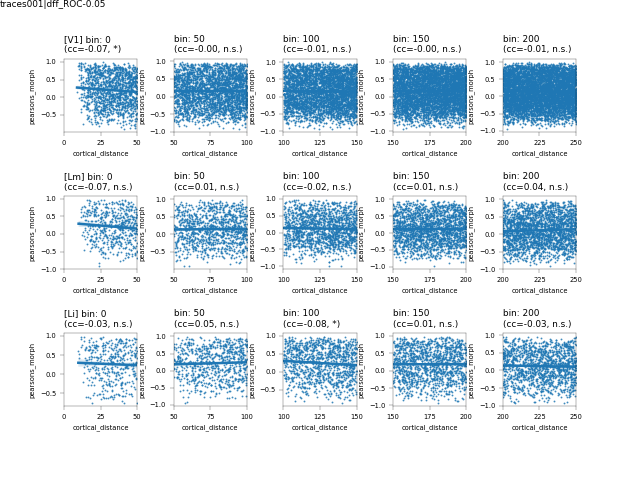

/n/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning pearsons_morph_v_binCTX_50um


In [585]:
%matplotlib notebook
y_var='pearsons_morph'
dist_var = 'cortical_distance'
# -------------------------------------------------------------
dist_str='VF' if dist_var=='rf_distance' else 'CTX'
dist_bins = copy.copy(rf_bins) if dist_var=='rf_distance' else copy.copy(ctx_bins)
dist_step = rf_step if dist_var=='rf_distance' else ctx_step
dist_unit = 'deg' if dist_var=='rf_distance' else 'um'
#
scatter_kws={'s': 0.5}
n_bins_plot = 5
# --------------------------------------------------------------
fig, axn = pl.subplots(3, n_bins_plot, figsize=(8,6))
for va, vg in df.groupby('visual_area'):
    vi = visual_areas.index(va)
    for di, (dist_bin, dg) in enumerate(vg.groupby('%s_label' % dist_var)):
        if di >= n_bins_plot:
            continue
        ax = axn[vi, di]
        ax.set_xlim([dist_bins[di], dist_bins[di+1]])
        ax.set_xticks(np.linspace(dist_bins[di], dist_bins[di+1], 3))
        g0 = sns.regplot(data=dg, ax=ax, scatter=True,
                    x=dist_var, y=y_var, scatter_kws=scatter_kws)
        cc, pv = spstats.spearmanr(dg[dist_var].values, dg[y_var].values)
        if pv<0.05:
            sig_str = '**' if pv<0.01 else '*'
        else:
            sig_str = 'n.s.'
        vstr='[%s] ' % va if di==0 else ''
        ax.set_title("%sbin: %i\n(cc=%.2f, %s)" % (vstr,dist_bin, cc, sig_str), 
                     loc='left')
for ax in axn.flat:
    ax.set_box_aspect(1)
pl.subplots_adjust(left=0.1, right=0.9, bottom=0.15, wspace=0.5, hspace=0.8)
pplot.label_figure(fig, data_id)

figname = '%s_v_bin%s_%i%s' % (y_var, dist_str, dist_step, dist_unit)
# pl.savefig(os.path.join(dst_dir, '%s.svg' % figname))
print(dst_dir, figname)

In [591]:
df = DISTS.copy()
# Split distances into X um bins
ctx_step=12.5
ctx_bins = np.arange(0, 1200+ctx_step, ctx_step)
df = cr.cut_bins(df, ctx_bins, 'cortical_distance')

rf_step=2.5
rf_bins = np.arange(0, 60+rf_step, rf_step)
df = cr.cut_bins(df, rf_bins, 'rf_distance')

<IPython.core.display.Javascript object>


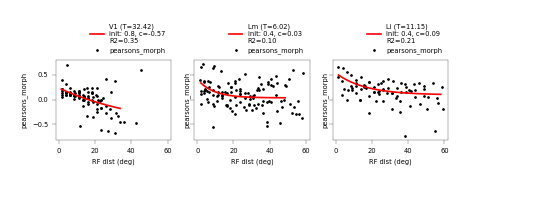

In [597]:
%matplotlib notebook
metric='pearsons_morph'
to_quartile = 'rf_distance'
x_var = '%s_label' % to_quartile

fit_sites = True
use_binned=False
min_npairs = 3
n_iter=int(np.random.rand(1)[0]*500)

xlabel='cortical dist (um)' if to_quartile=='cortical_distance' else 'RF dist (deg)'
cnt_grouper = [x_var] 
if fit_sites:
    cnt_grouper.append('datakey')
   
fig, axn = pl.subplots(1,3, figsize=(7,2.5), sharex=True, sharey=True)
for va, cc0 in df.groupby('visual_area'):
    ax=axn[visual_areas.index(va)]
    cnts = cc0.groupby(cnt_grouper)['neuron_pair'].count()  
    # How many resample per group
    nsamples_per = dict((k, v) for k, v \
                        in zip(cnts[cnts>min_npairs].index.tolist(),
                               cnts[cnts>min_npairs].values))
    # Sample
    cc_ = pd.concat([cg.sample(nsamples_per[c], random_state=n_iter, replace=True) \
                         for c, cg in cc0.groupby(cnt_grouper) \
                         if c in nsamples_per.keys()])
    # fov mean for visualizing
    if fit_sites:
        fit_cc = cc_.groupby(cnt_grouper).median().reset_index().dropna()
    else:
        fit_cc = cc_.copy()
    # plot
    meas_cc = cc0.groupby(cnt_grouper).median().reset_index().dropna()
    ax.scatter(x=to_quartile, y=metric, data=meas_cc, s=2, color='k')
    res_, xvals, yvals = cr.fit_decay_on_binned(fit_cc, use_binned=use_binned,
                                            normalize_x=True, func='halflife',
                                            estimator='median',
                                            metric=metric,
                                            to_quartile=to_quartile,
                                            return_inputs=True)
    if all(res_.isnull()):
        print("BINNED, no fit: %s" % va)
        label='no fit'
    else:
        fit_y = cr.func_halflife(xvals, res_.init, res_.tau, res_.constant)
        label = '%s (T=%.2f)\ninit: %.1f, c=%.2f\nR2=%.2f' \
                        % (va, res_.tau, res_.init, res_.constant, res_.R2)
        ax.plot(xvals, fit_y, color='r', label=label)
    #ax.set_ylim([-0.2, 0.6])
    #ax.set_title(label, loc='left')
    ax.set_ylabel(metric)
    ax.set_xlabel(xlabel)
    ax.legend(bbox_to_anchor=(1,1), loc='lower right', frameon=False, ncol=1)
       #ax.set_title(va)
    #ax.set_xlim([0, 250])
   # ax.set_xlim([0, 40])
    #ax.set_ylim([0, 0.7])
pl.subplots_adjust(bottom=0.3, left=0.1, right=0.8, top=0.7)

In [559]:
dst_dir

'/n/coxfs01/julianarhee/aggregate-visual-areas/correlations/blobs_dff_ROC/morph_tuning'

In [516]:
va='V1'
dk='20190616_JC097_fov1'
df_ = avg_responses[(avg_responses.visual_area==va) & (avg_responses.datakey==dk)]

In [519]:

posdf_ = aggr.add_roi_positions(df_)
if rfdf is not None:
    posdf0 = posdf_.copy()
    curr_rfs = rfdf[(rfdf.visual_area==va) & (rfdf.datakey==dk)].copy()
    posdf_ = cr.get_roi_pos_and_rfs(posdf0, curr_rfs, rfs_only=False, 
                                merge_cols=['visual_area', 'datakey', 'cell'])
    if posdf_.shape[0]==0:
        print(va, dk)

In [520]:
posdf_

,visual_area,datakey,cell,ml_pos,ap_pos,x0,y0
0,V1,20190616_JC097_fov1,0,909.977299,1078.506458,34.263130,-10.628686
1,V1,20190616_JC097_fov1,1,864.288063,1099.246967,NaN,NaN
2,V1,20190616_JC097_fov1,2,852.865753,1073.897456,30.848143,-6.732552
3,V1,20190616_JC097_fov1,9,873.806654,1023.198434,39.429009,-3.330024
4,V1,20190616_JC097_fov1,11,883.325245,993.239922,35.470047,-12.506376
...,...,...,...,...,...,...,...
180,V1,20190616_JC097_fov1,424,207.505284,1048.547945,29.780096,-2.802732
181,V1,20190616_JC097_fov1,425,32.363209,772.007828,20.431419,-7.071060
182,V1,20190616_JC097_fov1,426,45.689237,811.184344,NaN,NaN
183,V1,20190616_JC097_fov1,429,138.971429,520.817221,20.485330,-13.131780


In [524]:

cc = cr.get_pw_curve_correlations(df_, stimulus='blobs')
diffs_ = cc.copy()

if 'x0' in posdf_.columns:
    adist = cr.get_pw_distance(diffs_, posdf_, xcoord='x0', ycoord='y0', 
                             label='rf_distance', add_eccentricity=True)
else:
    adist = cr.get_pw_distance(diffs_, posdf_, xcoord='ml_pos', ycoord='ap_pos', 
                             label='cortical_distance', add_eccentricity=False)


In [526]:
adist.head()

,xcorr_morph,pearsons_morph,cosim_morph,cell_1,cell_2,neuron_pair,xcorr_size,pearsons_size,cosim_size,rf_distance,max_ecc,min_ecc,cortical_distance
0,3.502203,-0.030559,0.876929,0,1,0_1,1.900788,0.848862,0.958029,NaN,NaN,NaN,50.176439
1,2.839756,0.780673,0.942752,0,2,0_2,1.832618,0.920442,0.977413,5.180927,35.873821,31.574280,57.297221
2,3.129756,0.676105,0.936768,0,9,0_9,1.694492,0.994842,0.991813,8.941855,39.569379,35.873821,66.085498
3,2.824641,-0.381755,0.813232,0,11,0_11,1.768774,0.915901,0.965303,2.232122,37.610287,35.873821,89.334843
4,2.598988,0.200115,0.860275,0,12,0_12,2.073319,0.958303,0.991609,9.247455,40.524749,35.873821,129.947597


In [486]:
no_rfs=[]

curr_rfs=None
if rfdf is not None:
    curr_rfs = rfdf[(rfdf.visual_area==va) & (rfdf.datakey==dk)].copy()
    posdf = cr.get_roi_pos_and_rfs(df_, curr_rfs, rfs_only=False, 
                                merge_cols=['visual_area', 'datakey', 'cell'])
    if curr_rfs.shape[0]==0:
        no_rfs.append((va, dk, exp))
else:
    posdf = aggr.add_roi_positions(df_)
no_rfs

[]

In [490]:
posdf_ = aggr.add_roi_positions(df_)
posdf_

,visual_area,datakey,cell,config,response,size,morphlevel,experiment,animalid,fov,session,fov_xpos,fov_xpos_pix,fov_ypos,fov_ypos_pix,ml_pos,ap_pos
0,V1,20190616_JC097_fov1,0,config006,0.073549,10.0,0,blobs,JC097,FOV1_zoom2p0x,20190616,99.093542,43.0,62.822701,33.0,909.977299,1078.506458
1,V1,20190616_JC097_fov1,0,config007,0.062874,20.0,0,blobs,JC097,FOV1_zoom2p0x,20190616,99.093542,43.0,62.822701,33.0,909.977299,1078.506458
2,V1,20190616_JC097_fov1,0,config008,0.089596,30.0,0,blobs,JC097,FOV1_zoom2p0x,20190616,99.093542,43.0,62.822701,33.0,909.977299,1078.506458
3,V1,20190616_JC097_fov1,0,config009,0.102889,40.0,0,blobs,JC097,FOV1_zoom2p0x,20190616,99.093542,43.0,62.822701,33.0,909.977299,1078.506458
4,V1,20190616_JC097_fov1,0,config010,0.181599,50.0,0,blobs,JC097,FOV1_zoom2p0x,20190616,99.093542,43.0,62.822701,33.0,909.977299,1078.506458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8320,V1,20190616_JC097_fov1,431,config046,0.047672,10.0,106,blobs,JC097,FOV1_zoom2p0x,20190616,258.104110,112.0,287.461448,151.0,685.338552,919.495890
8321,V1,20190616_JC097_fov1,431,config047,0.014780,20.0,106,blobs,JC097,FOV1_zoom2p0x,20190616,258.104110,112.0,287.461448,151.0,685.338552,919.495890
8322,V1,20190616_JC097_fov1,431,config048,0.016424,30.0,106,blobs,JC097,FOV1_zoom2p0x,20190616,258.104110,112.0,287.461448,151.0,685.338552,919.495890
8323,V1,20190616_JC097_fov1,431,config049,0.016479,40.0,106,blobs,JC097,FOV1_zoom2p0x,20190616,258.104110,112.0,287.461448,151.0,685.338552,919.495890


In [ ]:

cc = get_pw_curve_correlations(df_, n_intervals=n_intervals, stimulus=stimulus)
diffs_ = cc.copy()

# # Cortical and RF difff
# if 'ml_pos' not in df_.columns:
#     if stimulus=='blobs':
#         posdf0 = df_[['visual_area', 'datakey', 'experiment', 'cell']].drop_duplicates()
#     else:
#         posdf0 = df_.copy()
#     posdf_ = aggr.add_roi_positionsS(posdf0)
# else:
#     posdf_ = df_.copy()        

if 'x0' in posdf_.columns:
    adist = get_pw_distance(diffs_, posdf_, xcoord='x0', ycoord='y0', 
                             label='rf_distance', add_eccentricity=True)
else:
    adist = get_pw_distance(diffs_, posdf_, xcoord='ml_pos', ycoord='ap_pos', 
                             label='cortical_distance', add_eccentricity=False)

assert adist.shape[0]==cc.shape[0], 'Bad merging: %s, %s' (va, dk)